### <font color="red"> SEGUNDO TRABAJO TAE 2019-2, BASADO EN EL LIBRO "AN INTRODUCTION TO STATISTICAL LEARNING" </font>

### Santiago González Quiroz, 1040752831.
### Juan Jose Alvarez Villada,  1037657494.
### Ingeniería de sistemas e informática.
### Profesor Juan David Ospina Arango.

### Se van a realizar del libro anteriormente mencionado los ejercicios: 
### * 4.7.2 del 10 al 13.
### * 8.4 del 7 al 12.
### * 9.7.2 del 4 al 8. 

### <font color="blue"> 1. En una celda se cargan todas las diferentes librerias y paquetes que se van a usar </font>

In [1]:
##Importar las librerias necesarias 
import pandas as pd ##Manejo de datasets
import numpy as np ##Arrays
import matplotlib.pyplot as plt ##Librería para gráficar
pd.set_option("max_columns",2000)
pd.set_option("max_rows",2000)

import seaborn as sb ##librería para gráficar

%matplotlib inline
import statistics

###SKLEARN
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import pairwise_distances_argmin_min

from sklearn.model_selection import train_test_split
from sklearn import tree
from sklearn import metrics
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import recall_score
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.metrics import precision_score
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import cross_val_score
from sklearn.tree import DecisionTreeRegressor
from sklearn.tree import DecisionTreeClassifier
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import KFold
from sklearn.ensemble import BaggingRegressor
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from mlxtend.plotting import plot_decision_regions

##grafica arbol
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus

##Confusión 
from pycm import *

plt.rcParams['figure.figsize'] = (14, 8)
plt.style.use('ggplot')

C:\Users\sgonzalezq\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\externals\six.py:31: DeprecationWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", DeprecationWarning)


### <font color="Red"> *  4.7.2 del 10 al 13 </font>

### Se carga el dataset weekly, obtenido por medio de la librería de R ISLR.

In [2]:
df=pd.read_csv("weekly.csv")
print(df.shape)

(1089, 9)


### Es importante el entendimiento del contexto de los datos con que se va a trabajar. Los datos hacen referencia al SyP500 en un rango de tiempo entre el 1990 y el 2010. El SyP500 es uno de los indices bursatiles más importantes de Estados Unidos. Los valores están expresados como  el Rendimiento porcentual semanal para el índice bursátil S&P 500 entre 1990 y 2010.

### <font color=red> -- </font> En las diferentes columnas Lag i, i=1...5, se tiene el porcentaje de retorno que tuvo el indice durantes las últimas iesimas semanas.

### <font color=red> -- </font> Volume: Volumen de acciones negociadas (número promedio de acciones diarias negociadas en miles de millones)

### <font color=red> -- </font> Today indica el porcentaje de retorno para la semana actual. 

### <font color=red> -- </font> Direction  indica si el mercado tuvo un rendimiento positivo o negativo en una semana determinada

In [3]:
df.head() ##vistazo del conjunto de datos.

,Year,Lag1,Lag2,Lag3,Lag4,Lag5,Volume,Today,Direction
0,1990,0.816,1.572,-3.936,-0.229,-3.484,0.154976,-0.270,Down
1,1990,-0.270,0.816,1.572,-3.936,-0.229,0.148574,-2.576,Down
2,1990,-2.576,-0.270,0.816,1.572,-3.936,0.159837,3.514,Up
3,1990,3.514,-2.576,-0.270,0.816,1.572,0.161630,0.712,Up
4,1990,0.712,3.514,-2.576,-0.270,0.816,0.153728,1.178,Up


### <font color="blue"> 10. <br>  A: Produce some numerical and graphical summaries of the Weekly data. Do there appear to be any patterns? </font>
### Para hacer este ejercicio, se planteará una descripción númerica para cada una de las variables que NO son categoricas. Posterior a esto, se podría observar una gráfica de correlaciones y una matríz de coeficientes de Pearson, para así ver patrones en los datos:

### <font color="green"> <i>Descripción numérica variables: </i></font>

In [4]:
df.describe()

,Year,Lag1,Lag2,Lag3,Lag4,Lag5,Volume,Today
count,1089.000000,1089.000000,1089.000000,1089.000000,1089.000000,1089.000000,1089.000000,1089.000000
mean,2000.048669,0.150585,0.151079,0.147205,0.145818,0.139893,1.574618,0.149899
std,6.033182,2.357013,2.357254,2.360502,2.360279,2.361285,1.686636,2.356927
min,1990.000000,-18.195000,-18.195000,-18.195000,-18.195000,-18.195000,0.087465,-18.195000
25%,1995.000000,-1.154000,-1.154000,-1.158000,-1.158000,-1.166000,0.332022,-1.154000
50%,2000.000000,0.241000,0.241000,0.241000,0.238000,0.234000,1.002680,0.241000
75%,2005.000000,1.405000,1.409000,1.409000,1.409000,1.405000,2.053727,1.405000
max,2010.000000,12.026000,12.026000,12.026000,12.026000,12.026000,9.328214,12.026000


### Datos importantes:
 #### 1. Ninguna variable tiene datos faltantes, todas tienen los 1089 registros correspondientes al total de filas del dataset. 
 #### 2. Las medias tienden a mantenerse por pares de semana de análisis. Se puede ver como en la columna Lag1 y Lag2 (que corresponden a resultados en la última y en las últimas 2 semanas, la media es muy similar. Lo mismo ocurre con Lag3 y Lag4.
 #### 3. Los datos mínimo y máximo son los mismos para todas las variables, por qué? Se responde posteriormente

### Cuántos registros se tienen para cada año?


In [5]:
df.groupby("Year").size() ##Mostrar registros que se tienen por año.

Year
1990    47
1991    52
1992    52
1993    52
1994    52
1995    52
1996    53
1997    52
1998    52
1999    52
2000    52
2001    52
2002    52
2003    52
2004    52
2005    52
2006    52
2007    53
2008    52
2009    52
2010    52
dtype: int64

### Para cada año, se tienen 52 registros (excepto en 1990), correspondientes a las 52 semanas del año. Con esto ya se tiene una idea del motivo por el que los valores mínimo y máximo son los mismos en todas las columnas. Para verificar la idea, se muestra un subcojunto de datos, asociado solo a un año en especifico, en este caso 2000.

In [6]:
df[df.Year==2000].head(7) ##Mostrar el dataframe del año 2000.

,Year,Lag1,Lag2,Lag3,Lag4,Lag5,Volume,Today,Direction
516,2000,0.748,2.626,0.282,-1.134,1.177,0.574918,-1.891,Down
517,2000,-1.891,0.748,2.626,0.282,-1.134,1.068760,1.643,Up
518,2000,1.643,-1.891,0.748,2.626,0.282,1.033940,-1.624,Down
519,2000,-1.624,1.643,-1.891,0.748,2.626,1.113750,-5.634,Down
520,2000,-5.634,-1.624,1.643,-1.891,0.748,1.106420,4.721,Up
521,2000,4.721,-5.634,-1.624,1.643,-1.891,1.041000,-2.615,Down
522,2000,-2.615,4.721,-5.634,-1.624,1.643,1.020160,-2.958,Down


### En efecto, se puede ver que un valor que aparece en Today (valor actual de retorno), en el siguiente registro (que es tomado una semana después), aparece en la columna Lag1. En el siguiente registro (2 semanas después) aparece en la columna Lag2. Finalmente dicho valor, va a pasar por cada una de las columnas Lag. Es por esto que el valor mínimo y máximo que se presente en todo el datset, será igual en todas las columnas.

### Lo anterior implica que generalmente un valor siempre aparecerá mínimamente en 6 registros, en diferentes columnas, lo cual podría influir en la correlación entre las variables. Se analizan los histogramas y correlaciones:

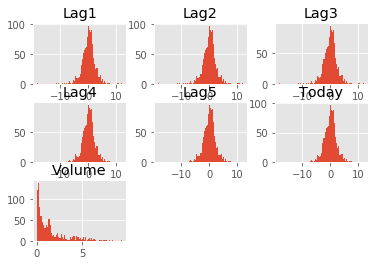

In [7]:
### Se observan las distribuciones de los datos, sin tener en cuenta el año que no aporta para este análisis:
df.drop("Year",axis=1).hist(bins=80)
plt.show()


### Analizando histogramas, parece que todas las variables tipo Lag tienen la misma forma. La que difiere en gran parte es volumen, donde sus valores se concentran principalmente entre 0 y 3.

### Qué dicen las correlaciones?

C:\Users\sgonzalezq\AppData\Local\Continuum\anaconda3\lib\site-packages\seaborn\axisgrid.py:2065: UserWarning: The `size` parameter has been renamed to `height`; pleaes update your code.
  warnings.warn(msg, UserWarning)


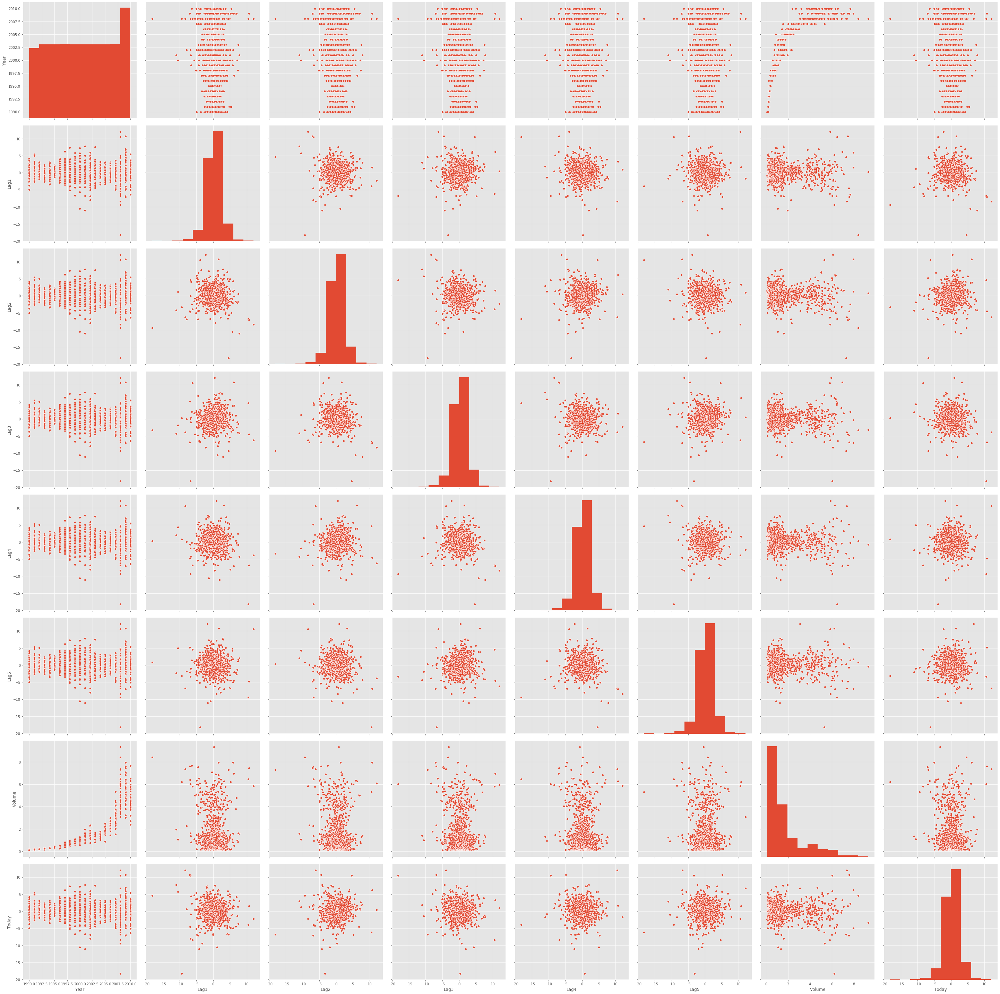

In [8]:
plt.rcParams['figure.figsize'] = (10, 7)
sb.pairplot(df,size=5,vars=df.drop(["Direction"],axis=1).columns,kind='scatter') ##Grafica con base en 3 variables.

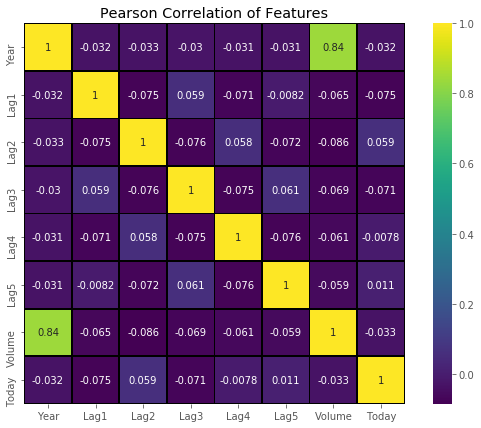

In [9]:
colormap = plt.cm.viridis  #Correlación de Pearson
#plt.figure(figsize=(13,13))
plt.title('Pearson Correlation of Features')
sb.heatmap(df.drop("Direction",axis=1).corr(),
           vmax=1.0,
           cmap=colormap,
           annot=True,
           linewidths=0.8,
           linecolor='black',
           square=True)

### Las variables están muy poco correlacionadas, a excepción de Volumen y year, con un coeficiente de 0.84. Lo que indica que generalmente entre más alto sea el año, más volumen hay.

### <font color="blue">  B. Use the full data set to perform a logistic regression with Direction as the response and the five lag variables plus Volume as predictors. Use the summary function to print the results. Do any of the predictors appear to be statistically significant? If so, which ones? </font>

### para efectuar la regresión logistica, se usara el método contenido en la librería sklearn. Se usará direction como variable de respuesta el resto de variables como explicativas:

### <font color=green> Datos desbalanceados? </font> 
### <font color=red> -- </font> Surge una duda inicial y es: Están los datos balanceados? Se observa

In [10]:
print(df.Direction.value_counts()) ##Observar muestras por clase
print(484/(605+484)) ##Porcentaje muestras clase minoritaria .

Up      605
Down    484
Name: Direction, dtype: int64
0.4444444444444444


### La clase Down pertenece a un 44.4% de los registros, se puede decir que no hay un desbalance fuerte en el dataset (entonces no se aclara en los parametros) y se procede a realizar la regresión logistica.
### <font color=green> Regresión logistica </font> 

### <font color=red> -- </font> Las intrucciones indican que se realice sobre todo el conjunto de datos, por ende, NO se hará una partición entre train y test.
### <font color=red> -- </font> En la regresión se usa el parametro solver= liblinear, ya que según la documentación oficial de sklearn[1], se ajusta mejor a conjuntos de datos pequeños, como este caso, en el cual solo hay 1089 registros.  
#### <font color= blue> [1] https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html </font>


In [11]:
X=df.drop(["Direction","Year","Today"],axis=1) ##Se excluyen year, today y direction de las variables explicativas
Y=df["Direction"] ##Se obtiene Direction como respuesta

In [12]:
regresion_l=LogisticRegression(random_state=0, solver="liblinear") #Se crea el objeto regresión logistica
regresion_l.fit(X, Y) ##Se ajusta a los conjuntos X,Y

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=0, solver='liblinear', tol=0.0001, verbose=0,
                   warm_start=False)

### <font color=green> Coeficientes: </font> 
### <font color=red> -- </font> Se exploran los coeficientes que presenta la regresión anteriormente ajustada, para análizar la/ las variables que tienen un mayor peso o significancia:

In [13]:
regresion_l.coef_

array([[-0.04117292,  0.05846974, -0.01599122, -0.02769998, -0.01440289,
        -0.02212844]])

### <font color=red> -- </font>Según los coeficientes mostrados, todo indica que la variable lag2 es la que más significancia tiene. Incluso es la única variable que presenta un coeficiente positivo. 
### <font color=red> -- </font>Entonces, el porcentaje de retorno que hubo hace 2 semanas atrás, es un muy buen indicador para hacer la regresión, para la predicción de la dirección del rendimiento del mercado.

### <font color="blue"> C. Compute the confusion matrix and overall fraction of correct predictions. Explain what the confusion matrix is telling you about the types of mistakes made by logistic regression </font>

### <font color=red> -- </font>Para mostrar la matríz de confusión del modelo logistico, se usa la implementada por la librería sklearn. Esta matríz de confusión se hace sobre todo el dataset, que fue el usado para entrenar el modelo. Se hacen entonces las respectivas predicciones para todo X y se comparan las salidas con los valores Y conocidos.




In [14]:
prediccion=regresion_l.predict(X) ##Predicción para todo el conjunto X 
confusion_matrix(Y,prediccion, labels=["Down","Up"]) ## Matríz confusión fea
cm = ConfusionMatrix(Y.to_numpy(), prediccion,digit=5) ##Matriz confusión bonita

In [15]:
##Cantidad de positivos y negativos
Y.value_counts()

Up      605
Down    484
Name: Direction, dtype: int64

### <font color=green> Matríz de confusión: </font> 

In [16]:
cm.print_matrix() ##Aclara la clase directamente

Predict    Down       Up         
Actual
Down       55         429        

Up         47         558        




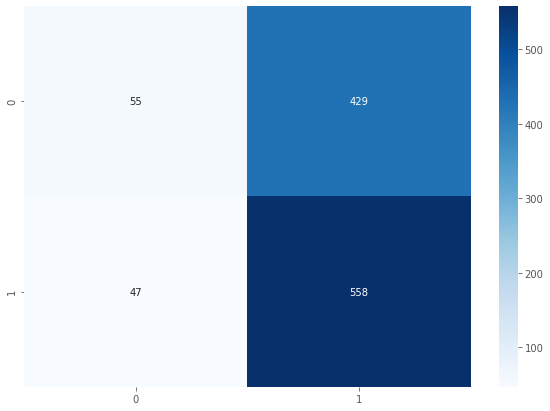

In [17]:
confusion=metrics.confusion_matrix(Y, prediccion) ##matríz confusión bonita 0=
ax1=plt.axes()

sb.heatmap(confusion, square=False, annot=True,fmt="d",cbar=True,cmap="Blues", ax=ax1)
plt.show()

In [18]:
print("############## DOWN: #######################" )
precision = precision_score(Y, prediccion, average='binary',pos_label='Down') #La #precisión para down
print('Precision: %.3f' % precision)

recall = recall_score(Y, prediccion, average='binary',pos_label='Down') ## recall para down
print('Recall: %.3f' % recall)

############## DOWN: #######################
Precision: 0.539
Recall: 0.114


In [19]:
print("############## UP: #######################" )
precision = precision_score(Y, prediccion, average='binary',pos_label='Up') #La #precisión para up
print('Precision: %.3f' % precision)

recall = recall_score(Y, prediccion, average='binary',pos_label='Up') ## recall para up
print('Recall: %.3f' % recall)

############## UP: #######################
Precision: 0.565
Recall: 0.922



### <font color=green> Análisis matríz de confusión: </font> 

### Predicciones correctas = 613

### <font color=red> -- </font> La matríz de confusión arroja los siguientes resultados:

### <font color="blue"> Clase Down: </font>

#### <font color=red> -- </font>  TP= 55
#### <font color=red> -- </font>  TN= 558
#### <font color=red> -- </font>  FP= 47
#### <font color=red> -- </font>   FN=429




### <font color=red> -- </font> El desempeño del modelo con esta clase es bastante pobre, pues se ve como la tasa de verdaderos positivos (recall) es muy bajita, ya que falla mucho prediciendo un "Up" cuando en realidad es "Down" (FN).

### <font color=red> -- </font> Adicionalmente la precisión es mala ya que los falsos positivos son casi la misma cantidad que los verdaderos positivos. El modelo no reconoce bien la clase "Down".


### <font color="blue"> Clase UP: </font>

#### <font color=red> -- </font>  TP= 558
#### <font color=red> -- </font>  TN=55
#### <font color=red> -- </font>  FP= 429
#### <font color=red> -- </font>   FN=47




### <font color=red> -- </font> Con esta clase el modelo tiene un desempeño mejor, pero sigue siendo regular. Mejoró mucho en la tasa de verdaderos positivos (recall), ya que el modelo arroja pocos falsos negativos. Lo que quiere decir que el modelo reconoce bien las muestra UP y las clasifica como tal.

### <font color=red> -- </font> Adicionalmente la precisión continua siendo algo regular, ya que el modelo falla reconociendo los elementos Down.


###  <font color="blue">D. Now fit the logistic regression model using a training data period from 1990 to 2008, with Lag2 as the only predictor. Compute the confusion matrix and the overall fraction of correct predictions for the held out data (that is, the data from 2009 and 2010) </font>

### <font color=red> -- </font> Lo primero que se debe realizar en este paso es filtrar el dataset, para quedar solo con los registros entre 1990-2008. Posterior a esto, se extrae solo la variable Lag2 (que fue la mas representativa en el punto anterior) y ajustar la regresión nuevamente. Luego se deben realizar las predicciones para los datos de los años 2009 y 2010, que previamente también se deben haber extraido:

In [20]:
##Extraer los datos
X_filtrado=df[df.Year<=2008] ##Solo muestras de 1990-2010.
X_train=X_filtrado.Lag2 ##X_train
X_train=X_train.to_numpy().reshape(-1, 1) ##Al ser un solo feature, es necesario hacer esta manipulación:
Y_train=X_filtrado.Direction

##Test
X_filtrado2=df[df.Year>2008] ##Conjunto de prueba >2008
X_test=X_filtrado2.Lag2
X_test=X_test.to_numpy().reshape(-1, 1)
Y_test=X_filtrado2.Direction

### <font color=green> Regresión logistica  2:</font> 
### <font color=red> -- </font>  Se usan los mismos parametros que en la regresión anterior:

In [21]:
regresion_lag2=LogisticRegression(random_state=0, solver="liblinear") #Se crea el objeto regresión logistica
regresion_lag2.fit(X_train, Y_train) ##Se ajusta a los conjuntos X,Y de entrenaminento

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=0, solver='liblinear', tol=0.0001, verbose=0,
                   warm_start=False)

In [22]:
y_predicho=regresion_lag2.predict(X_test) ##Predicción con el conjunto de prueba
confusion_matrix(Y_test,y_predicho, labels=["Down","Up"]) ## Matríz confusión fea
cm = ConfusionMatrix(Y_test.to_numpy(), y_predicho,digit=5) ##Matriz confusión bonita

### <font color=green> Matríz de confusión: </font> 

In [23]:
cm.print_matrix() ##Aclara la clase directamente

Predict    Down       Up         
Actual
Down       9          34         

Up         5          56         




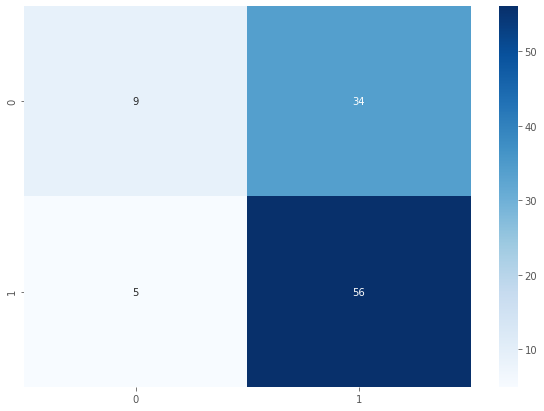

In [24]:
confusion=metrics.confusion_matrix(Y_test,y_predicho) ##matríz confusión bonita 0=
ax1=plt.axes()

sb.heatmap(confusion, square=False, annot=True,fmt="d",cbar=True,cmap="Blues", ax=ax1)
plt.show()

In [25]:
print("############## DOWN: #######################" )
precision = precision_score(Y_test, y_predicho, average='binary',pos_label='Down') #La #precisión para down
print('Precision: %.3f' % precision)

recall = recall_score(Y_test, y_predicho, average='binary',pos_label='Down') ## recall para down
print('Recall: %.3f' % recall)

############## DOWN: #######################
Precision: 0.643
Recall: 0.209


In [26]:
print("############## UP: #######################" )
precision = precision_score(Y_test, y_predicho, average='binary',pos_label='Up') #La #precisión para up
print('Precision: %.3f' % precision)

recall = recall_score(Y_test, y_predicho, average='binary',pos_label='Up') ## recall paraup
print('Recall: %.3f' % recall)

############## UP: #######################
Precision: 0.622
Recall: 0.918


### <font color=green> Análisis matríz de confusión regresión logistica 2: </font> 

### <font color=red> -- </font> La matríz de confusión arroja los siguientes resultados:

### Predicciones correctas = 65

### <font color=blue>  Clase Down:</font>

#### <font color=red> -- </font>  TP= 9
#### <font color=red> -- </font>  TN= 56
#### <font color=red> -- </font>  FP= 5
#### <font color=red> -- </font>   FN=34

### <font color=blue>  Clase Up:</font>

#### <font color=red> -- </font>  TP= 56
#### <font color=red> -- </font>  TN= 9
#### <font color=red> -- </font>  FP= 34
#### <font color=red> -- </font>   FN=5




### <font color=red> -- </font> Como en el modelo anterior, se mantiene la conclusión, la clase Down sigue teniendo problemas para ser correctamente reconocida. Mientras que la clase Up continua con un buen porcentaje de reconocimiento correcto.



###  <font color="blue"> E. Repeat (d) using LDA. </font>

### <font color=red> -- </font>  Para el análisis de discriminante lineal, se usará también la implementación que tiene la librería sklearn. El modelo se debe ajustar al mismo conjunto de datos del literal anterior, por lo que no es necesario volver a obtenerlo, ya se tiene.

In [27]:
lda = LinearDiscriminantAnalysis() #Se crea objeto lDA
lda.fit(X_train,Y_train) # Se ajusta a x,y de prueba

LinearDiscriminantAnalysis(n_components=None, priors=None, shrinkage=None,
                           solver='svd', store_covariance=False, tol=0.0001)

In [28]:
lda_predicho=lda.predict(X_test) ##Predicciones para x de prueba 
confusion_matrix(Y_test,lda_predicho, labels=["Down","Up"]) ## Matríz confusión fea
cm = ConfusionMatrix(Y_test.to_numpy(), lda_predicho,digit=5) ##Matriz confusión bonita

### <font color=green> Matríz de confusión: </font> 

In [29]:
cm.print_matrix() ##Aclara la clase directamente

Predict    Down       Up         
Actual
Down       9          34         

Up         5          56         




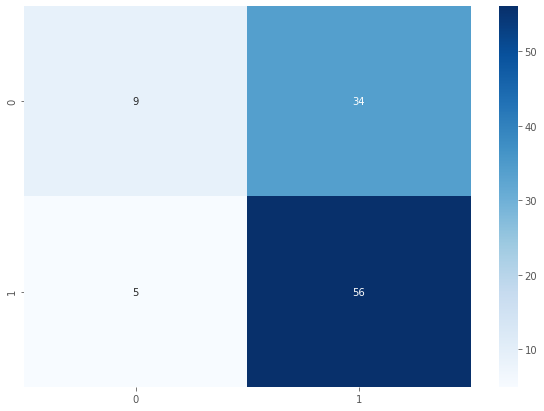

In [30]:
confusion=metrics.confusion_matrix(Y_test,lda_predicho) ##matríz confusión bonita 0=
ax1=plt.axes()

sb.heatmap(confusion, square=False, annot=True,fmt="d",cbar=True,cmap="Blues", ax=ax1)
plt.show()

In [31]:
print("############## DOWN: #######################" )
precision = precision_score(Y_test, lda_predicho, average='binary',pos_label='Down') #La #precisión para down
print('Precision: %.3f' % precision)

recall = recall_score(Y_test, lda_predicho, average='binary',pos_label='Down') ## recall para down
print('Recall: %.3f' % recall)

############## DOWN: #######################
Precision: 0.643
Recall: 0.209


In [32]:
print("############## UP: #######################" )
precision = precision_score(Y_test, lda_predicho, average='binary',pos_label='Up') #La #precisión para up
print('Precision: %.3f' % precision)

recall = recall_score(Y_test, lda_predicho, average='binary',pos_label='Up') ## recall paraup
print('Recall: %.3f' % recall)

############## UP: #######################
Precision: 0.622
Recall: 0.918


### <font color=green> Análisis matríz de confusión LDA: </font> 

### <font color=red> -- </font> La matríz de confusión arroja los siguientes resultados:

### Predicciones correctas = 65

### <font color=red> -- </font> Los resultados obtenidos através del análisis de discriminante lineal, son exactamente los mismo que se obtuvieron con la regresión logistica 2 que se ajustó en el literal anterior. No hubo ningún cambio en los resultados entre ambos modelos.

###  <font color="blue"> F. Repeat (d) using QDA </font>

### <font color=red> -- </font>  Para el análisis de discriminante cuadratico, se usará también la implementación que tiene la librería sklearn. El modelo se debe ajustar al mismo conjunto de datos del literal anterior, por lo que no es necesario volver a obtenerlo, ya se tiene.


In [33]:
qda=QuadraticDiscriminantAnalysis() #Se crea el objeto qda
qda.fit(X_train,Y_train) # Se ajusta a x,y de prueba

QuadraticDiscriminantAnalysis(priors=None, reg_param=0.0,
                              store_covariance=False, tol=0.0001)

In [34]:
qda_predicho=qda.predict(X_test) ##Predicción para x de prueba
confusion_matrix(Y_test,qda_predicho, labels=["Down","Up"]) ## Matríz confusión fea
cm = ConfusionMatrix(Y_test.to_numpy(), qda_predicho,digit=5) ##Matriz confusión bonita

### <font color=green> Matríz de confusión: </font> 

In [35]:
cm.print_matrix() ##Aclara la clase directamente

Predict    Down       Up         
Actual
Down       0          43         

Up         0          61         




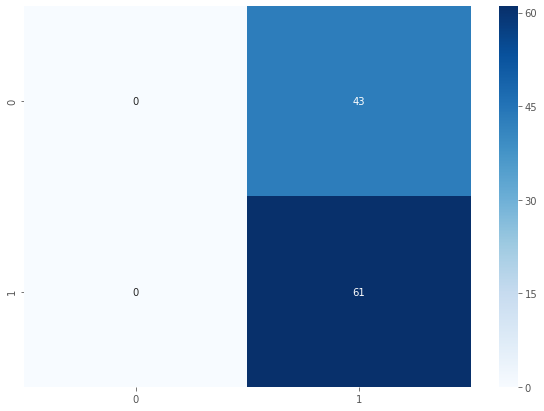

In [36]:
confusion=metrics.confusion_matrix(Y_test,qda_predicho) ##matríz confusión bonita 0=
ax1=plt.axes()

sb.heatmap(confusion, square=False, annot=True,fmt="d",cbar=True,cmap="Blues", ax=ax1)
plt.show()

In [37]:
print("############## DOWN: #######################" )
precision = precision_score(Y_test, qda_predicho, average='binary',pos_label='Down') #La #precisión para down
print('Precision: %.3f' % precision)

recall = recall_score(Y_test, qda_predicho, average='binary',pos_label='Down') ## recall para down
print('Recall: %.3f' % recall)

############## DOWN: #######################
Precision: 0.000
Recall: 0.000


C:\Users\sgonzalezq\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)


In [38]:
print("############## UP: #######################" )
precision = precision_score(Y_test, qda_predicho, average='binary',pos_label='Up') #La #precisión para up
print('Precision: %.3f' % precision)

recall = recall_score(Y_test, qda_predicho, average='binary',pos_label='Up') ## recall paraup
print('Recall: %.3f' % recall)

############## UP: #######################
Precision: 0.587
Recall: 1.000


### <font color=green> Análisis matríz de confusión QDA: </font> 

### <font color=red> -- </font> La matríz de confusión arroja los siguientes resultados:

### Predicciones correctas = 61

### <font color=red> -- </font> Los resultados obtenidos através del análisis de discriminante cuadratico, son demasiado malos. Se puede ver como el modelo no fue capáz de reconocer correctamente ninguna muestra de la clase down. Por el contrario reconoció perfectamente todas las muestras que eran UP.

###  <font color="blue"> G. Repeat (d) using KNN with K = 1. </font>
### <font color=red> -- </font>  Para hacer uso del modelo de los K vecinos más cercanos, se usa la implementación que trae la librería sklearn. Se establece el número de vecinos en K=1, como lo indica el ejercicio. A priori se cree que con un número de vecinos tan bajito, el modelo podría ser malo, pero hay que recordar que igual en el conjunto solo se está teniendo en cuenta 1 feature.


In [39]:
knn=KNeighborsClassifier(n_neighbors=1) #Se crea el objeto knn con 1 vecino 
knn.fit(X_train,Y_train) # Se ajusta a x,y de prueba

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=1, p=2,
                     weights='uniform')

In [40]:
knn_predicho=knn.predict(X_test) ##Predicción para x de prueba
confusion_matrix(Y_test,knn_predicho, labels=["Down","Up"]) ## Matríz confusión fea
cm = ConfusionMatrix(Y_test.to_numpy(), knn_predicho,digit=5) ##Matriz confusión bonita

### <font color=green> Matríz de confusión: </font> 

In [41]:
cm.print_matrix() ##Aclara la clase directamente

Predict    Down       Up         
Actual
Down       21         22         

Up         31         30         




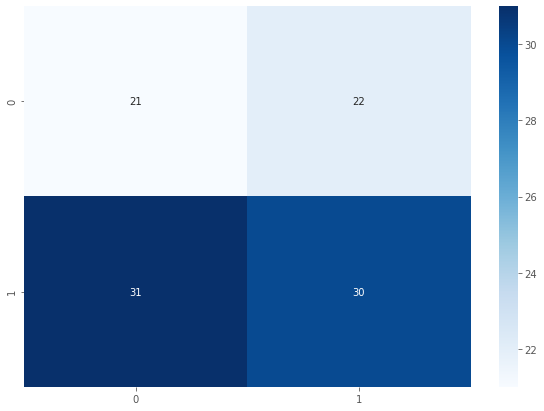

In [42]:
confusion=metrics.confusion_matrix(Y_test,knn_predicho) ##matríz confusión bonita 0=
ax1=plt.axes()

sb.heatmap(confusion, square=False, annot=True,fmt="d",cbar=True,cmap="Blues", ax=ax1)
plt.show()

In [43]:
print("############## DOWN: #######################" )
precision = precision_score(Y_test, knn_predicho, average='binary',pos_label='Down') #La #precisión para down
print('Precision: %.3f' % precision)

recall = recall_score(Y_test, knn_predicho, average='binary',pos_label='Down') ## recall para down
print('Recall: %.3f' % recall)

############## DOWN: #######################
Precision: 0.404
Recall: 0.488


In [44]:
print("############## UP: #######################" )
precision = precision_score(Y_test, knn_predicho, average='binary',pos_label='Up') #La #precisión para up
print('Precision: %.3f' % precision)

recall = recall_score(Y_test, knn_predicho, average='binary',pos_label='Up') ## recall paraup
print('Recall: %.3f' % recall)

############## UP: #######################
Precision: 0.577
Recall: 0.492


### <font color=green> Análisis matríz de confusión KNN K=1: </font> 

### <font color=red> -- </font> La matríz de confusión arroja los siguientes resultados:

### Predicciones correctas = 51

### <font color=red> -- </font> Con este algoritmo, el modelo por un lado gano puntos, pero por otro lado perdió. Se puede notar claramente que el número de predicciones correctas bajo con respecto a las otras implementaciones hechas. Por el lado de la clase Down, gano puntos, ya que se puede notar que ahora la reconoce mejor, y eso lo evidencia el respectio recall que subió y el número de FN que disminuyó.

###  <font color="blue"> H. Which of these methods appears to provide the best results on this data?<font>
    
### <font color=red> -- </font> La respuesta a esta pregunta podría ser muy subjetiva, ya que depende de lo que busca la persona con el modelo. Si se busca un modelo que detecte de buena manera una buena clase, sin importar que tan mal detecte la otra, la regresión logistica podría ser una buena opción. Si se busca un modelo que detecte a la perfección una clase y la otra no la detecte, el QDa podría ser una buena opción. Si se busca un modelo que tenga buen rate de detección de ambas clases, Knn podría ser buena opción. Valga aclarar que ninguno de los modelos anteriormente presentados parece ser lo suficientemente poderoso como para ser tenido en cuenta.

### <font color="blue"> I. Experiment with different combinations of predictors, including possible transformations and interactions, for each of the methods. Report the variables, method, and associated confusion matrix that appears to provide the best results on the held out data. Note that you should also experiment with values for K in the KNN classifier.
    
###  <font color=red> -- </font> Como primer acercamiento a este ejercicio, se tomarán primero las 2 o 3 variables que estén menos correlacionadas con Lag2 (por el peso que demostró tener al principio), según el estudio de correlaciones que se hizo al inicio del documento. Se probará para cada elección de variables en diferentes modelos: Regresión logistica, QDA y Knn ( variando la cantidad de vecinos entre 1 y 5). Recordar que entre más cerca de 0 se encuentra el coeficiente de correlación, menos correlación tienen las variables. Se procede:

### Se tomarán entonces: 
#### <font color=blue> -- </font> Today
#### <font color=blue> -- </font> Lag2
#### <font color=blue> -- </font> Lag4

### <font color=red> -- </font> Como todas las variables están expresadas en las mismas unidades, no parece necesario hacer un escalamiento.


In [45]:
## obteniendo variables de interés:
##Extraer los datos
X_filtrado=df[df.Year<=2008] ##Solo muestras de 1990-2008
X_train=X_filtrado[["Lag2","Lag4","Today"]] ##X_train
Y_train=X_filtrado.Direction

##Test
X_filtrado2=df[df.Year>2008] ##Conjunto de prueba >2008
X_test=X_filtrado2[["Lag2","Lag4","Today"]] 
Y_test=X_filtrado2.Direction

### <font color=green> Regresión Logistica: </font> 

In [46]:
regresion=LogisticRegression(random_state=0, solver="liblinear") #Se crea el objeto regresión logistica
regresion.fit(X_train, Y_train) ##Se ajusta a los conjuntos X,Y de entrenaminento

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=0, solver='liblinear', tol=0.0001, verbose=0,
                   warm_start=False)

In [47]:
y_predicho=regresion.predict(X_test) ##Predicción para x de prueba
confusion_matrix(Y_test,y_predicho, labels=["Down","Up"]) ## Matríz confusión fea
cm = ConfusionMatrix(Y_test.to_numpy(), y_predicho,digit=5) ##Matriz confusión bonita

In [48]:
cm.print_matrix() ##Aclara la clase directamente

Predict    Down       Up         
Actual
Down       43         0          

Up         0          61         




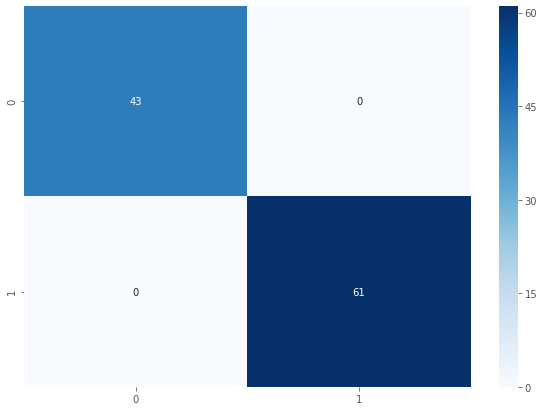

In [49]:
confusion=metrics.confusion_matrix(Y_test,y_predicho) ##matríz confusión bonita 0=
ax1=plt.axes()

sb.heatmap(confusion, square=False, annot=True,fmt="d",cbar=True,cmap="Blues", ax=ax1)
plt.show()

In [50]:
print("############## DOWN: #######################" )
precision = precision_score(Y_test, y_predicho, average='binary',pos_label='Down') #La #precisión para down
print('Precision: %.3f' % precision)

recall = recall_score(Y_test, y_predicho, average='binary',pos_label='Down') ## recall para down
print('Recall: %.3f' % recall)


############## DOWN: #######################
Precision: 1.000
Recall: 1.000


In [51]:
print("############## UP: #######################" )
precision = precision_score(Y_test, y_predicho, average='binary',pos_label='Up') #La #precisión para up
print('Precision: %.3f' % precision)

recall = recall_score(Y_test, y_predicho, average='binary',pos_label='Up') ## recall paraup
print('Recall: %.3f' % recall)

############## UP: #######################
Precision: 1.000
Recall: 1.000


### <font color=green> Análisis matríz de confusión Regresión logistica: </font> 

### <font color=red> -- </font> La matríz de confusión arroja los siguientes resultados:

### Predicciones correctas = <font color=red> 104</font>

### <font color=red> -- </font> Se logra tener un precision y un recall de 1.0 para ambas clases, lo cual es un modelo "perfecto", ya que reconoció perfectamente todas las muestras, pero claramente podría tratarse de un caso de un alto sobreajuste del modelo. Al no haber un cunjunto de validación extra, es complicado verificar la hipotesis.

### <font color=green> QDA: </font> 

In [52]:
qda=QuadraticDiscriminantAnalysis() #Se crea el objeto qda
qda.fit(X_train,Y_train) # Se ajusta a x,y de prueba

QuadraticDiscriminantAnalysis(priors=None, reg_param=0.0,
                              store_covariance=False, tol=0.0001)

In [53]:
qda_predicho=qda.predict(X_test) ##Predicciones para x de prueba 
confusion_matrix(Y_test,qda_predicho, labels=["Down","Up"]) ## Matríz confusión fea
cm = ConfusionMatrix(Y_test.to_numpy(), qda_predicho,digit=5) ##Matriz confusión bonita

In [54]:
cm.print_matrix() ##Aclara la clase directamente

Predict    Down       Up         
Actual
Down       40         3          

Up         1          60         




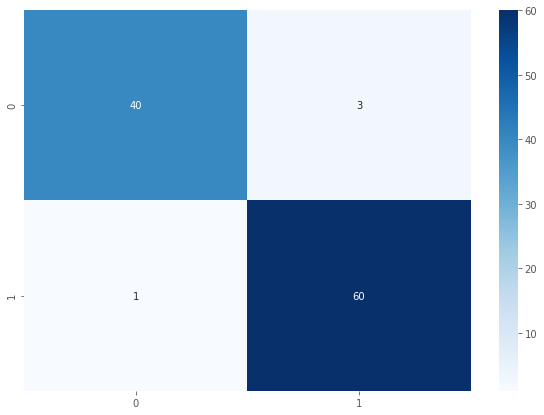

In [55]:
confusion=metrics.confusion_matrix(Y_test,qda_predicho) ##matríz confusión bonita 0=
ax1=plt.axes()

sb.heatmap(confusion, square=False, annot=True,fmt="d",cbar=True,cmap="Blues", ax=ax1)
plt.show()

In [56]:
print("############## DOWN: #######################" )
precision = precision_score(Y_test, qda_predicho, average='binary',pos_label='Down') #La #precisión para down
print('Precision: %.3f' % precision)

recall = recall_score(Y_test, qda_predicho, average='binary',pos_label='Down') ## recall para down
print('Recall: %.3f' % recall)


############## DOWN: #######################
Precision: 0.976
Recall: 0.930


In [57]:
print("############## UP: #######################" )
precision = precision_score(Y_test, qda_predicho, average='binary',pos_label='Up') #La #precisión para up
print('Precision: %.3f' % precision)

recall = recall_score(Y_test, qda_predicho, average='binary',pos_label='Up') ## recall paraup
print('Recall: %.3f' % recall)

############## UP: #######################
Precision: 0.952
Recall: 0.984


### <font color=green> Análisis matríz de confusión QDA: </font> 

### <font color=red> -- </font> La matríz de confusión arroja los siguientes resultados:

### Predicciones correctas = <font color=red> 100</font>

### <font color=red> -- </font> Nuevamente se tiene un modelo que se comporta extremadamente bien, reconociendo los verdaderos positivos casi que perfectamente en ambas clases. Las predicciones erroneas se notan más para la clase Down. Se vuelve a sospechar de un alto sobreajuste del modelo.

### <font color=green>KNN, variando el número de vecinos: </font> 
### <font color=red> --</font> El número de vecinos se pondra a iterar entre 1 y 5, buscando el que mejor precision y recall arroje, para analizarlo más a fondo.

In [58]:
for i in range(1,6):
    knn=KNeighborsClassifier(n_neighbors=i) #Se crea el objeto knn con 1 vecino 
    knn.fit(X_train,Y_train) # Se ajusta a x,y de prueba
    knn_predicho=knn.predict(X_test)
    print("---------------- K= ",i,"-------------")
    print("############## DOWN: #######################" )
    precision = precision_score(Y_test, knn_predicho, average='binary',pos_label='Down') #La #precisión para down
    print('Precision: %.3f' % precision)
    
    recall = recall_score(Y_test, knn_predicho, average='binary',pos_label='Down') ## recall para down
    print('Recall: %.3f' % recall)
    
    print("############## UP: #######################" )
    precision = precision_score(Y_test, knn_predicho, average='binary',pos_label='Up') #La #precisión para up
    print('Precision: %.3f' % precision)
    
    recall = recall_score(Y_test, knn_predicho, average='binary',pos_label='Up') ## recall paraup
    print('Recall: %.3f' % recall)


---------------- K=  1 -------------
############## DOWN: #######################
Precision: 0.976
Recall: 0.953
############## UP: #######################
Precision: 0.968
Recall: 0.984
---------------- K=  2 -------------
############## DOWN: #######################
Precision: 0.913
Recall: 0.977
############## UP: #######################
Precision: 0.983
Recall: 0.934
---------------- K=  3 -------------
############## DOWN: #######################
Precision: 0.976
Recall: 0.930
############## UP: #######################
Precision: 0.952
Recall: 0.984
---------------- K=  4 -------------
############## DOWN: #######################
Precision: 0.915
Recall: 1.000
############## UP: #######################
Precision: 1.000
Recall: 0.934
---------------- K=  5 -------------
############## DOWN: #######################
Precision: 0.933
Recall: 0.977
############## UP: #######################
Precision: 0.983
Recall: 0.951


### <font color=red> --</font> Aparentemente con K=1 vecino, se logra el mayor balance entre las métricas de ambas clases, por lo que se selecciona este valor de k para la matríz de confusión.

In [59]:
knn=KNeighborsClassifier(n_neighbors=1) #Se crea el objeto knn con 1 vecino 
knn.fit(X_train,Y_train) # Se ajusta a x,y de prueba
knn_predicho=knn.predict(X_test)

In [60]:
cm = ConfusionMatrix(Y_test.to_numpy(), knn_predicho,digit=5) ##Matriz confusión bonita
cm.print_matrix() ##Aclara la clase directamente

Predict    Down       Up         
Actual
Down       41         2          

Up         1          60         




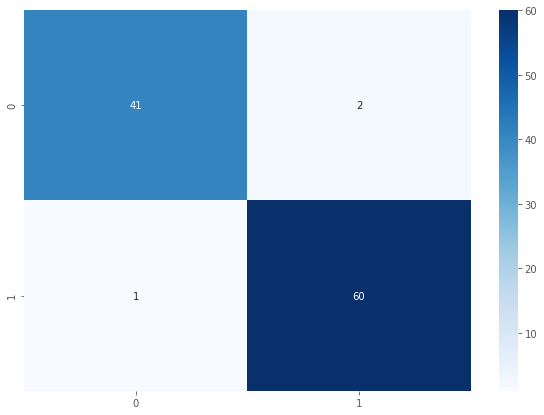

In [61]:
confusion=metrics.confusion_matrix(Y_test,knn_predicho) ##matríz confusión bonita 0=
ax1=plt.axes()

sb.heatmap(confusion, square=False, annot=True,fmt="d",cbar=True,cmap="Blues", ax=ax1)
plt.show()

### <font color=green> Análisis matríz de confusión KNN K=1: </font> 

### <font color=red> -- </font> La matríz de confusión arroja los siguientes resultados:

### Predicciones correctas = <font color=red> 101</font>

### <font color=red> -- </font> Con el método de KNN, también se logra un modelo altamente eficiente, en el que solo se cometieron 3 errores en las predicciones. De nuevo, se sospecha de alto sobreajuste.

### <font color=Blue>11. In this problem, you will develop a model to predict whether a given car gets high or low gas mileage based on the Auto data set. </font> 
### <font color=red> -- </font> Se obtiene desde R el dataset mencionado y se carga en el proyecto:.

In [63]:
autos=pd.read_csv("auto.csv")

In [64]:
autos.shape ##392 registros para 9 variables
autos.head()

,mpg,cylinders,displacement,horsepower,weight,acceleration,year,origin,name
0,18.0,8,307.0,130,3504,12.0,70,1,chevrolet chevelle malibu
1,15.0,8,350.0,165,3693,11.5,70,1,buick skylark 320
2,18.0,8,318.0,150,3436,11.0,70,1,plymouth satellite
3,16.0,8,304.0,150,3433,12.0,70,1,amc rebel sst
4,17.0,8,302.0,140,3449,10.5,70,1,ford torino


### <font color=green> Significado columnas: </font>
### <font color=red> mpg: </font>miles per gallon
### <font color=red> cylinders: </font>Number of cylinders between 4 and 8
### <font color=red> displacement: </font>Engine displacement (cu. inches) equivalente a los cc de un motor, que se usan como convención en Colombia.
### <font color=red>horsepower: </font>Engine horsepower
### <font color=red>weight: </font>Vehicle weight (lbs.)
### <font color=red>acceleration: </font>Time to accelerate from 0 to 60 mph (sec.)
### <font color=red>year: </font>Model year (modulo 100)
### <font color=red>origin: </font>Origin of car (1. American, 2. European, 3. Japanese)
### <font color=red>name: </font>Vehicle name


### <font color=red>-- </font>Según la descripción del dataset, cylinder es una variable que está entre 4 y 8, explorando se encuentra que hay valores de 3. Se podrían considerar errores y borrarse, pero se dejarán asumiendo que en realidad la variable está entre 3-8

In [65]:
autos.cylinders.value_counts()



4    199
8    103
6     83
3      4
5      3
Name: cylinders, dtype: int64

### <font color=blue>A. Create a binary variable, mpg01, that contains a 1 if mpg contains a value above its median, and a 0 if mpg contains a value below its median. You can compute the median using the median() function. Note you may find it helpful to use the data.frame() function to create a single data set containing both mpg01 and the other Auto variables. </font> 

### <font color=red>-- </font> Se debe crear una nueva columna, derivada de la columna mgp, tomando como base su mediana. Para esto lo primero es obtener la mediana de la columna y luego generar el nuevo feature. Adicionalmente se comprueba que no hay valores faltantes en el conjunto de datos:

In [66]:
autos.describe()

,mpg,cylinders,displacement,horsepower,weight,acceleration,year,origin
count,392.000000,392.000000,392.000000,392.000000,392.000000,392.000000,392.000000,392.000000
mean,23.445918,5.471939,194.411990,104.469388,2977.584184,15.541327,75.979592,1.576531
std,7.805007,1.705783,104.644004,38.491160,849.402560,2.758864,3.683737,0.805518
min,9.000000,3.000000,68.000000,46.000000,1613.000000,8.000000,70.000000,1.000000
25%,17.000000,4.000000,105.000000,75.000000,2225.250000,13.775000,73.000000,1.000000
50%,22.750000,4.000000,151.000000,93.500000,2803.500000,15.500000,76.000000,1.000000
75%,29.000000,8.000000,275.750000,126.000000,3614.750000,17.025000,79.000000,2.000000
max,46.600000,8.000000,455.000000,230.000000,5140.000000,24.800000,82.000000,3.000000


In [67]:
mediana=autos["mpg"].median() ##Obtengo la media

In [68]:
autos["mpg01"]=np.where(autos['mpg']>=mediana, 1, 0) ##Computo la nueva columna

### <font color=blue> B. Explore the data graphically in order to investigate the association between mpg01 and the other features. Which of the other features seem most likely to be useful in predicting mpg01? Scatterplots and boxplots may be useful tools to answer this question. Describe your findings.

### <font color=red>-- </font> Se visualizarán los scatterplots y matríz de pearson para encontrar relaciones entre variables, con el fin de indagar cual/es features podrían ser más útiles a la hora de predecir mpg01. Vale aclarar que en este análisis también es importante tener en cuenta  mpg que es la variable que mapepo a mpg01. 

### <font color=red>-- </font>  En este análisis no se tendrá en cuenta la variable name, la cual no parece muy importante en las relaciones, igualmente origin.

C:\Users\sgonzalezq\AppData\Local\Continuum\anaconda3\lib\site-packages\seaborn\axisgrid.py:2065: UserWarning: The `size` parameter has been renamed to `height`; pleaes update your code.
  warnings.warn(msg, UserWarning)
C:\Users\sgonzalezq\AppData\Local\Continuum\anaconda3\lib\site-packages\statsmodels\nonparametric\kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
C:\Users\sgonzalezq\AppData\Local\Continuum\anaconda3\lib\site-packages\statsmodels\nonparametric\kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2
C:\Users\sgonzalezq\AppData\Local\Continuum\anaconda3\lib\site-packages\statsmodels\nonparametric\kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
C:\Users\sgonzalezq\AppData\Local\Continuum\anaconda3\lib\site-packages\statsmodels\nonparametric\kdetools.py:34: RuntimeW

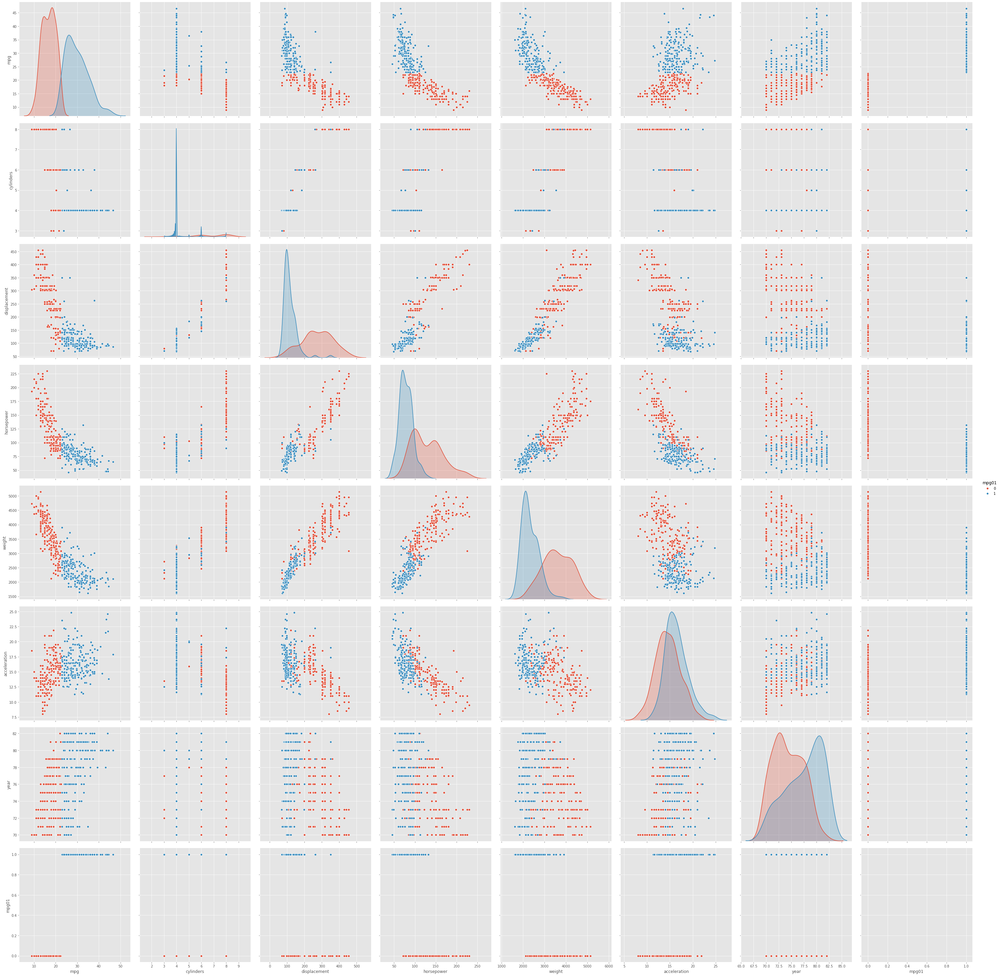

In [69]:
plt.rcParams['figure.figsize'] = (20, 10)
sb.pairplot(autos,size=5,vars=autos.drop(["name","origin"],axis=1).columns,kind='scatter', hue="mpg01") ##Grafica con base en 3 variables.
plt.show()

### <font color=red>-- </font> Recordando que<font color=red> MPG </font>   significa millas/galon, lo que se buscaría predecir es en que categoría se ubica un garro (0 --> pocas millas/galon , 1 --> muchas millas/galon), con base en sus demás variables de rendimiento.

### <font color=red>-- </font> Mpg muestra fuerte correlación gráfica con: 
### <font color=blue> * </font> weight: A más millas/galon, menor peso.  mpg sube, weithg baja. -> correlación negativa
### <font color=blue> * </font> Con horsepower también se ve algo de correlación negativa, pero menos marcada. A mayor mpg menos caballos de fuerza.
### <font color=blue> * </font>También está correlacionada con displacement, pues a mayor mpg, menor displacement. Recordar que displacement se refiere a la potencia del motor, que en Colombia se conoce como 1600cc y similares.
### <font color=red>-- </font> Las anteriores hipotesis se pueden confirmar con la matríz de pearson que se presenta posteriormente.

### <font color=red>-- </font> Para<font color=red> MPG01 </font>   Es útil mirar que variables son las que mejor separan los valores 0,1 en que se mapearon los valoes. Dichas variables son:

### <font color=blue> * </font>Aceleration
### <font color=blue>* </font> weight
### <font color=blue>* </font> Horsepower
### <font color=blue>* </font>Year




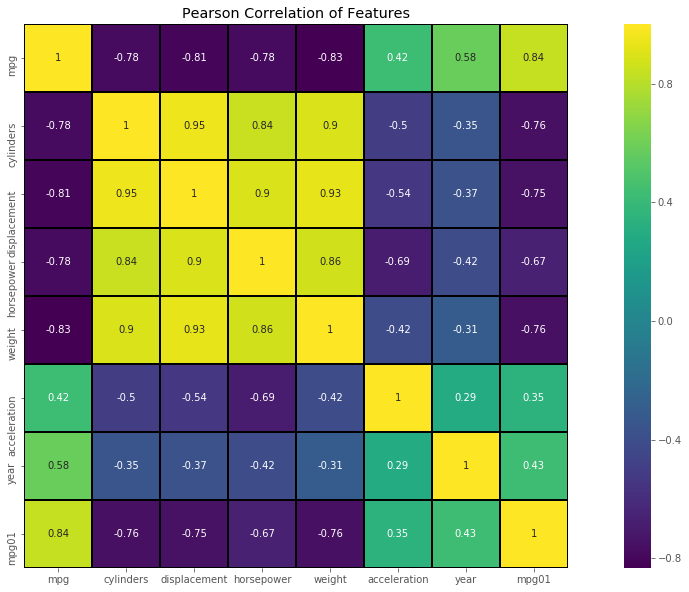

In [70]:
colormap = plt.cm.viridis  #Correlación de Pearson
#plt.figure(figsize=(13,13))
plt.title('Pearson Correlation of Features')
sb.heatmap(autos.drop(["name","origin"],axis=1).corr(),
           vmax=1.0,
           cmap=colormap,
           annot=True,
           linewidths=0.8,
           linecolor='black',
           square=True)

### <font color=red>-- </font>  La matríz de pearson comprueba lo que se tenía pensado, hay una serie de variables que están fuertemente correlacionadas, de las cuales lo ideal sería solo tomar 1 y tomar otras que no estén tan correlacioanadas.

### <font color=red>  Se decide entoncer tomar como mejores predictores de mpg01, las variables: Displacement, acceleration,year y weight.</font>

### <font color=blue> C. Split the data into a training set and a test set </font>
### <font color=red >-</font> Para particionar los datos entre entramiento y prueba, se usa la función incorporada dentro de la librería sklearn. Se tomara 80% para entrenar y 20% para prueba </font>
### <font color=red >-</font> Se prepara el conjunto de datos con las variables de interés. Se evidencia que no hay desbalanceo en los datos. </font>

In [71]:
## Obtener variables de interes:
X=autos[["displacement","acceleration","year", "weight"]] #Explicativas
Y=autos.mpg01 #respuesta
print(Y.value_counts())

1    196
0    196
Name: mpg01, dtype: int64


In [72]:
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.20, random_state=422) ## Se particionan los datos.

### <font color=blue> D. Perform LDA on the training data in order to predict mpg01 using the variables that seemed most associated with mpg01 in (b). What is the test error of the model obtained?</font>

### <font color=red >-</font>Se ajustara un análisis de discriminante lineal al conjunto de entrenamiento, para medir la efectividad con el conjunto de prueba. Se usa el LDA que propociona la librería sklearn.
### <font color=red >-</font> Para conocer estadisticos importantes sobre el desempeño, se usa la librería pycm




In [73]:
lda=LinearDiscriminantAnalysis() ##Crear objeto lDA
lda.fit(X_train,y_train) #Ajustar al conjunto de prueba


LinearDiscriminantAnalysis(n_components=None, priors=None, shrinkage=None,
                           solver='svd', store_covariance=False, tol=0.0001)

In [74]:
y_predicho=lda.predict(X_test) ##Predecir para conjunto de prueba

In [75]:
cm = ConfusionMatrix(y_test.to_numpy(), y_predicho,digit=5) ##Matriz confusión bonita
cm.print_matrix() ##Aclara la clase directamente

Predict  0        1        
Actual
0        31       5        

1        0        43       




### <font color=red >-</font> El modelo implementando LDA logró un error de un 6.3% aproximadamente, en el conjunto de test:


In [76]:
print("El % de error es: ", (1-cm.Overall_ACC)*100)

El % de error es:  6.329113924050633


### <font color=blue> E. Perform QDA on the training data in order to predict mpg01 using the variables that seemed most associated with mpg01 in (b). What is the test error of the model obtained?
    
### <font color=red >-</font>Se ajustara un análisis de discriminante cuadratico al conjunto de entrenamiento, para medir la efectividad con el conjunto de prueba. Se usa el QDA que propociona la librería sklearn.
### <font color=red >-</font> Para conocer estadisticos importantes sobre el desempeño, se usa la librería pycm

In [77]:
qda=QuadraticDiscriminantAnalysis() ##Crear objeto qda
qda.fit(X_train,y_train) #Ajustar al conjunto de prueba

QuadraticDiscriminantAnalysis(priors=None, reg_param=0.0,
                              store_covariance=False, tol=0.0001)

In [78]:
qda_predicho=qda.predict(X_test) ##Predecir para conjunto de prueba

In [79]:
cm = ConfusionMatrix(y_test.to_numpy(), qda_predicho,digit=5) ##Matriz confusión bonita
cm.print_matrix() ##Aclara la clase directamente

Predict  0        1        
Actual
0        33       3        

1        0        43       




### <font color=red >-</font> El modelo implementando QDA logró un error de un 3.79% aproximadamente, en el conjunto de test:

In [80]:
print("El % de error es: ", (1-cm.Overall_ACC)*100)

El % de error es:  3.797468354430378


### <font color=blue> F. Perform logistic regression on the training data in order to predict mpg01 using the variables that seemed most associated with mpg01 in (b). What is the test error of the model obtained?</font>
### <font color=red >-</font>Se ajustará una regresión logistica al conjunto de entrenamiento, para medir la efectividad con el conjunto de prueba. Se usa la regresión logistica que propociona la librería sklearn.

### <font color=red >-</font> Para conocer estadisticos importantes sobre el desempeño, se usa la librería pycm

In [81]:
regresion=LogisticRegression(random_state=42, solver="liblinear") #Se crea el objeto regresión logistica
regresion.fit(X_train, y_train) ##Se ajusta a los conjuntos X,Y de entrenaminento

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=42, solver='liblinear', tol=0.0001, verbose=0,
                   warm_start=False)

In [82]:
regre_predicho=regresion.predict(X_test) ##Predecir para conjunto de prueba

In [83]:
cm = ConfusionMatrix(y_test.to_numpy(), regre_predicho,digit=5) ##Matriz confusión bonita
cm.print_matrix() ##Aclara la clase directamente

Predict  0        1        
Actual
0        33       3        

1        0        43       




### <font color=red >-</font> El modelo implementando regresión logistica logró un error de un 3.79% aproximadamente, en el conjunto de test:

In [84]:
print("El % de error es: ", (1-cm.Overall_ACC)*100)

El % de error es:  3.797468354430378


### <font color=blue> H. Perform KNN on the training data, with several values of K, in order to predict mpg01. Use only the variables that seemed most associated with mpg01 in (b). What test errors do you obtain? Which value of K seems to perform the best on this data set? </font>

### <font color=red >-</font>Se ajustará el método de los KNN con variaciones de K=1 hasta 24, observando cada vez el precision y recall del modelo, para extraer el mejor K. Se usará el método KNN incorporado en Sklearn.

### <font color=red >-</font> Para conocer estadisticos importantes sobre el desempeño, se usa la librería pycm

In [85]:
for vecinos in range(1,25):
    knn=KNeighborsClassifier(n_neighbors=vecinos) #Se crea el objeto knn con x número de vecinos 
    knn.fit(X_train,y_train) # Se ajusta a x,y de prueba
    knn_predicho=knn.predict(X_test) ##se predice para test
    print("---------------- K= ",vecinos,"-------------")
    precision = precision_score(y_test, knn_predicho) #La #precisión 
    print('Precision: %.3f' % precision)
    recall = recall_score(y_test, knn_predicho) ## recall 
    print('Recall: %.3f' % recall)
    

---------------- K=  1 -------------
Precision: 0.884
Recall: 0.884
---------------- K=  2 -------------
Precision: 0.900
Recall: 0.837
---------------- K=  3 -------------
Precision: 0.891
Recall: 0.953
---------------- K=  4 -------------
Precision: 0.923
Recall: 0.837
---------------- K=  5 -------------
Precision: 0.886
Recall: 0.907
---------------- K=  6 -------------
Precision: 0.929
Recall: 0.907
---------------- K=  7 -------------
Precision: 0.872
Recall: 0.953
---------------- K=  8 -------------
Precision: 0.952
Recall: 0.930
---------------- K=  9 -------------
Precision: 0.913
Recall: 0.977
---------------- K=  10 -------------
Precision: 0.932
Recall: 0.953
---------------- K=  11 -------------
Precision: 0.933
Recall: 0.977
---------------- K=  12 -------------
Precision: 0.932
Recall: 0.953
---------------- K=  13 -------------
Precision: 0.933
Recall: 0.977
---------------- K=  14 -------------
Precision: 0.932
Recall: 0.953
---------------- K=  15 -------------
Preci

### <font color=red >--</font> Con K=11 se encuentra el mejor balance entre precision y recall, por lo que es el que mejor ajusta el modelo y se selecciona este valor para análizar el modelo más a fondo.

In [86]:
knn=KNeighborsClassifier(n_neighbors=11) #Se crea el objeto knn con 11 vecinos
knn.fit(X_train,y_train) # Se ajusta a x,y de prueba
knn_predicho=knn.predict(X_test) ##se predice para test

In [87]:
cm = ConfusionMatrix(y_test.to_numpy(), knn_predicho,digit=5) ##Matriz confusión bonita
cm.print_matrix() ##Aclara la clase directamente

Predict  0        1        
Actual
0        33       3        

1        1        42       




### <font color=red >-</font> El modelo implementando KNN con k=11 logró un error de un 5% aproximadamente, en el conjunto de test:

In [88]:
print("El % de error es: ", (1-cm.Overall_ACC)*100)

El % de error es:  5.063291139240511


### <font color=Blue>12. This problem involves writing functions. </font> 


### <font color=blue> A. Write a function, Power(), that prints out the result of raising 2 to the 3rd power. In other words, your function should compute 2^3 and print out the results.</font>


In [89]:
def power():
    print(2**3)

### <font color=blue>B. Create a new function, Power2(), that allows you to pass any two numbers, x and a, and prints out the value of x^a. You can do this by beginning your function with the line Power2=function (x,a){ You should be able to call your function by entering, for instance, Power2 (3,8) </font>

In [90]:
def power2(x,a):
    print(x**a)

### <font color=blue>C. Using the Power2() function that you just wrote, compute 10^3, 8^17, and 131^3.

In [91]:
power2(10,3)
power2(8,17)
power2(131,3)

1000
2251799813685248
2248091


### <font color=blue> D. Now create a new function, Power3(), that actually returns the result x^a as an R object, rather than simply printing it to the screen. That is, if you store the value x^a in an object called result within your function, then you can simply return() this return() result, using the following line: return(result) The line above should be the last line in your function, before the } symbol.

In [92]:
def power3(x,a):
    resultado=x**a
    return resultado

### <font color=blue> E. Now using the Power3() function, create a plot of f(x) = x^2. The x-axis should display a range of integers from 1 to 10, and the y-axis should display x^2. Label the axes appropriately, and use an appropriate title for the figure. Consider displaying either the x-axis, the y-axis, or both on the log-scale. You can do this by using log=‘‘x’’, log=‘‘y’’, or log=‘‘xy’’ as arguments to the plot() function

In [93]:
x=[1,2,3,4,5,6,7,8,9,10]
y=[]
for i in x:
    y.append(power3(i,2))

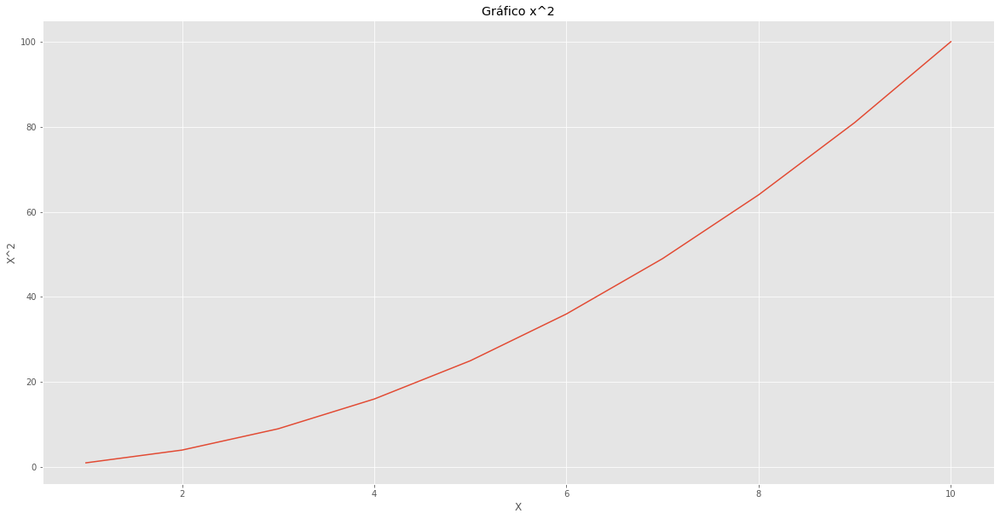

In [94]:
ax = sb.lineplot(x=x, y=y).set(title = 'Gráfico x^2', xlabel = 'X', ylabel = 'X^2' )




### <font color=blue>F. Create a function, PlotPower(), that allows you to create a plot of x against x^a for a fixed a and for a range of values of x. For instance, if you call  PlotPower (1:10,3) then a plot should be created with an x-axis taking on ovalues 1, 2,..., 10, and a y-axis taking on values 1^3, 2^3,..., 10^3.

In [95]:
def plotpower(x,a):
    eje=[]
    y=[]
    for i in range(1,x):
        eje.append(i)
        y.append(i**a)
        ax = sb.lineplot(x=eje, y=y).set(title = 'Gráfico x^'+str(a), xlabel = 'X', ylabel = 'X^'+str(a) )
    plt.show()
    return True
    
    

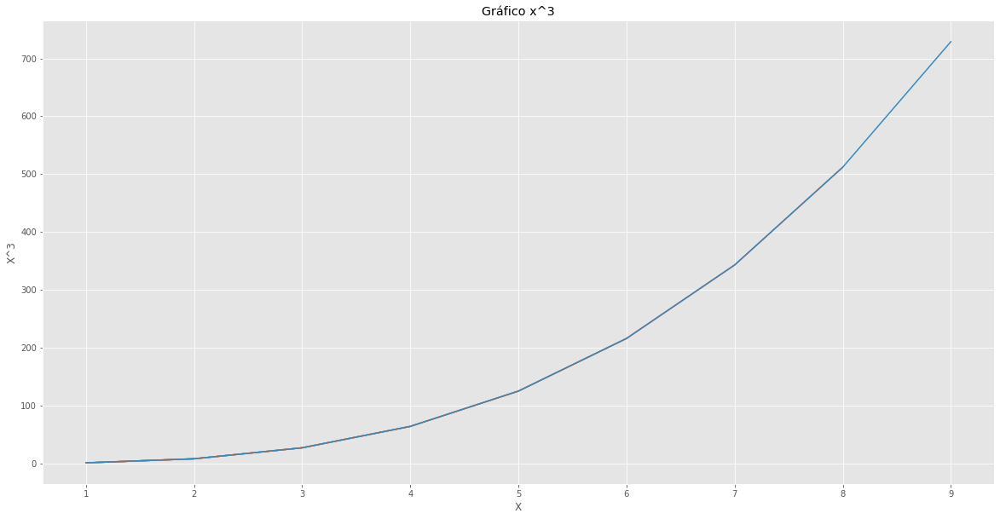

True

In [96]:
plotpower(10,3)

### <font color=Blue>13. Using the Boston data set, fit classification models in order to predict whether a given suburb has a crime rate above or below the median. Explore logistic regression, LDA, and KNN models using various subsets of the predictors. Describe your findings. </font> 

### <font color=red> --</font> Se obtendrá el dataset a través de R e inicilamente se va a entender a qué corresponden las columas, para entender los datos y así poder desarrollar los respectivos modelos.


In [97]:
boston=pd.read_csv("boston.csv")
boston.shape ##14 variables

(506, 14)

### <font color=red> --</font> Se tiene un dataset con 506 registros, en 14 variables.

In [98]:
boston.head()

,crim,zn,indus,chas,nox,rm,age,dis,rad,tax,ptratio,black,lstat,medv
0,0.00632,18.0,2.31,0,0.538,6.575,65.2,4.0900,1,296,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0,0.469,6.421,78.9,4.9671,2,242,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0,0.469,7.185,61.1,4.9671,2,242,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0,0.458,6.998,45.8,6.0622,3,222,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0,0.458,7.147,54.2,6.0622,3,222,18.7,396.90,5.33,36.2


### <font color= blue> * crim: </font> Tasa de criminalidad per capita por ciudad.

### <font color= blue> * zn: </font>  proporción de tierra residencial dividida en zonas para lotes de más de 25,000 pies cuadrados.

### <font color= blue> * indus: </font>  proporción de acres de negocios no minoristas por ciudad.

### <font color= blue> * chas: </font>  Charles River (= 1 si el tramo limita con el río; 0 en caso contrario).

### <font color= blue> * nox: </font>  concentración de óxidos de nitrógeno (partes por 10 millones).

### <font color= blue> * rm: </font>  número promedio de habitaciones por vivienda.

### <font color= blue> * age: </font> proporción de unidades ocupadas por sus propietarios construidas antes de 1940.

### <font color= blue> * dis: </font>media ponderada de distancias a cinco centros de empleo de Boston.

### <font color= blue> * rad: </font> índice de accesibilidad a carreteras radiales.

### <font color= blue> * tax: </font> tasa de impuesto a la propiedad de valor total por \ $ 10,000.

### <font color= blue> * ptratio: </font>  relación alumno-profesor por localidad.

### <font color= blue> * black: </font>  1000 (Bk - 0.63) ^ 2 donde Bk es la proporción de negros por ciudad.

### <font color= blue> * lstat: </font> menor estado de la población (porcentaje).

### <font color= blue> * medv: </font>  valor medio de viviendas ocupadas por sus propietarios en \ 1000s.

### <font color=red> --</font>Se necesitan ajustar modelos de clasificación, para determinar si un suburbio dado, tendrá una tasa de criminalidad por arriba o por abajo de la mediana. Para esto es necesario crear una nueva columna, mapeada a traves de la variable crim, donde 1 significa que está arriba de la mediana y 0 que está por debajo.
### <font color=red> --</font> Se crear la nueva variable, llamada median_crime:

In [99]:
mediana=boston["crim"].median() #hallo la mediana
boston["median_crime"]=np.where(boston['crim']>=mediana, 1, 0) ##Computo la nueva columna

In [100]:
boston.head() # se verifica

,crim,zn,indus,chas,nox,rm,age,dis,rad,tax,ptratio,black,lstat,medv,median_crime
0,0.00632,18.0,2.31,0,0.538,6.575,65.2,4.0900,1,296,15.3,396.90,4.98,24.0,0
1,0.02731,0.0,7.07,0,0.469,6.421,78.9,4.9671,2,242,17.8,396.90,9.14,21.6,0
2,0.02729,0.0,7.07,0,0.469,7.185,61.1,4.9671,2,242,17.8,392.83,4.03,34.7,0
3,0.03237,0.0,2.18,0,0.458,6.998,45.8,6.0622,3,222,18.7,394.63,2.94,33.4,0
4,0.06905,0.0,2.18,0,0.458,7.147,54.2,6.0622,3,222,18.7,396.90,5.33,36.2,0


### <font color=green> Busqueda de faltantes y de relaciones entre variables: </font>
### <font color=red> --</font> Se buscan datos faltantes:

In [101]:
boston.describe()

,crim,zn,indus,chas,nox,rm,age,dis,rad,tax,ptratio,black,lstat,medv,median_crime
count,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000
mean,3.613524,11.363636,11.136779,0.069170,0.554695,6.284634,68.574901,3.795043,9.549407,408.237154,18.455534,356.674032,12.653063,22.532806,0.500000
std,8.601545,23.322453,6.860353,0.253994,0.115878,0.702617,28.148861,2.105710,8.707259,168.537116,2.164946,91.294864,7.141062,9.197104,0.500495
min,0.006320,0.000000,0.460000,0.000000,0.385000,3.561000,2.900000,1.129600,1.000000,187.000000,12.600000,0.320000,1.730000,5.000000,0.000000
25%,0.082045,0.000000,5.190000,0.000000,0.449000,5.885500,45.025000,2.100175,4.000000,279.000000,17.400000,375.377500,6.950000,17.025000,0.000000
50%,0.256510,0.000000,9.690000,0.000000,0.538000,6.208500,77.500000,3.207450,5.000000,330.000000,19.050000,391.440000,11.360000,21.200000,0.500000
75%,3.677082,12.500000,18.100000,0.000000,0.624000,6.623500,94.075000,5.188425,24.000000,666.000000,20.200000,396.225000,16.955000,25.000000,1.000000
max,88.976200,100.000000,27.740000,1.000000,0.871000,8.780000,100.000000,12.126500,24.000000,711.000000,22.000000,396.900000,37.970000,50.000000,1.000000


### <font color=red> --</font>No hay datos faltantes, no se debe preocupar por NA entonces.
### <font color=red> --</font>  Los datos a clasificar están balanceados?

In [102]:
boston.median_crime.value_counts()

1    253
0    253
Name: median_crime, dtype: int64

### <font color=red> --</font> No hay problemas con datos desbalanceados, se procede a analizar gráficas: 
### <font color=red> --</font> Tener presente que la variable chas es más categorica.

### <font color=red> --</font> Se analizará el scatterplot y la matríz de person, para encontrar correlaciones entre variables, especialemnte con las variables crime y median_crime, que son las que forman la varaible que se busca predecir:

C:\Users\sgonzalezq\AppData\Local\Continuum\anaconda3\lib\site-packages\seaborn\axisgrid.py:2065: UserWarning: The `size` parameter has been renamed to `height`; pleaes update your code.
  warnings.warn(msg, UserWarning)


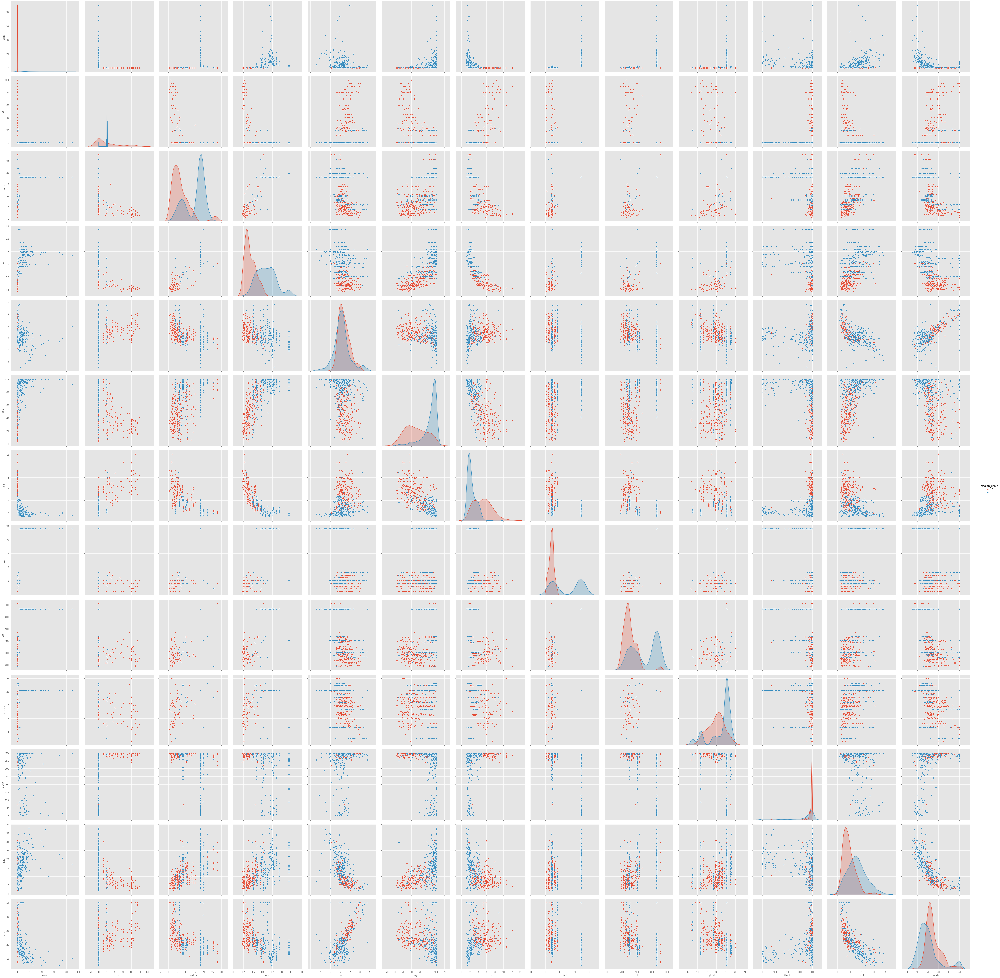

In [103]:
plt.rcParams['figure.figsize'] = (20, 10)
sb.pairplot(boston,size=5,vars=boston.drop(["chas","median_crime"],axis=1).columns,kind='scatter', hue="median_crime") ##Grafica con base en 3 variables.
plt.show()

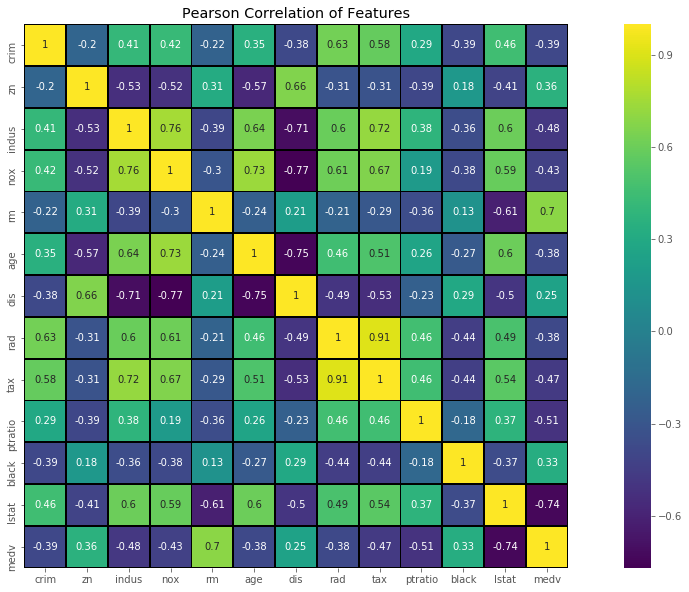

In [104]:
colormap = plt.cm.viridis  #Correlación de Pearson
#plt.figure(figsize=(13,13))
plt.title('Pearson Correlation of Features')
sb.heatmap(boston.drop(["median_crime","chas"],axis=1).corr(),
           vmax=1.0,
           cmap=colormap,
           annot=True,
           linewidths=0.8,
           linecolor='black',square=True)


### <font color=red> --</font> Para un primer intento de selección de features, se tomarán las variables que estén menos correlacionadas con crime y que logren separar bien la categoria median_crime: 

### <font color=red> --</font> No se tomará nox por tener correlación fuerte con dist, y se toma dist, ya que dist es una de los features que separa bien a median_crime, junto con black

### <font color=red> --</font> Se tomará medv, que tiene correlación fuerte con lstat y con rm (que no se tomarán) y poca correlación con crim.

### <font color=red> --</font> tax y rad son las dos variables más correlacionadas, se toma tax, que presenta más correlaciones con otras variables y menos correlación con crime.

### <font color=red> --</font> zn y black separan de buena forma median_crime, también se toma zn.





## <font color=green>Intento #1</font>
### <font color=red> --</font> Se tomaran 7 features para ajustar los modelos.Tomadas:  dist, black,medv,tax,zn,age,indus

### <font color=red> --</font> Se separa el conjunto explicativo y de respuesta. Posteriormente se saca conjunto de train y test. Se usará el 20% para test.

In [105]:
X=boston[["dis","black","medv","tax","zn","age","indus"]] ##Explicativo
Y=boston.median_crime ##Respuesta


In [106]:
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.20, random_state=42222) ## Se particionan los datos.

## <font color=green>Regresión Logistica: </font>

In [107]:
regresion=LogisticRegression(random_state=10, solver="liblinear") #Se crea el objeto regresión logistica
regresion.fit(X_train, y_train) ##Se ajusta a los conjuntos X,Y de entrenaminento

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=10, solver='liblinear', tol=0.0001, verbose=0,
                   warm_start=False)

In [108]:
regre_predicho=regresion.predict(X_test) ##Predecir para X de test

In [109]:
cm = ConfusionMatrix(y_test.to_numpy(), regre_predicho,digit=5) ##Matriz confusión bonita
cm.print_matrix() ##Aclara la clase directamente

Predict  0        1        
Actual
0        39       10       

1        11       42       




### <font color=red >-</font> El modelo implementando regresión logistica, con los 7 features seleccionados, logró un error de un 20.5% aproximadamente en el conjunto de test. Se Adjunta precision y recall:

In [110]:
precision = precision_score(y_test, regre_predicho) #La #precisión 
print('Precision: %.3f' % precision)
recall = recall_score(y_test, regre_predicho) ## recall 
print('Recall: %.3f' % recall)

print("El % de error es: ", (1-cm.Overall_ACC)*100)

Precision: 0.808
Recall: 0.792
El % de error es:  20.588235294117652


## <font color=green>LDA: </font>

In [111]:
lda = LinearDiscriminantAnalysis() #Se crea objeto lDA
lda.fit(X_train,y_train) # Se ajusta a x,y de train

LinearDiscriminantAnalysis(n_components=None, priors=None, shrinkage=None,
                           solver='svd', store_covariance=False, tol=0.0001)

In [112]:
lda_predicho=lda.predict(X_test) #Se predice x_test

In [113]:
cm = ConfusionMatrix(y_test.to_numpy(), lda_predicho,digit=5) ##Matriz confusión bonita
cm.print_matrix() ##Aclara la clase directamente

Predict  0        1        
Actual
0        39       10       

1        12       41       




### <font color=red >-</font> El modelo implementando LDA, con los 7 features seleccionados, logró un error de un 21.5% aproximadamente en el conjunto de test. Se Adjunta precision y recall:

In [114]:
precision = precision_score(y_test, lda_predicho) #La #precisión 
print('Precision: %.3f' % precision)
recall = recall_score(y_test, lda_predicho) ## recall 
print('Recall: %.3f' % recall)

print("El % de error es: ", (1-cm.Overall_ACC)*100)

Precision: 0.804
Recall: 0.774
El % de error es:  21.568627450980394


## <font color=green>KNN con variaciones de número de vecinos </font>

In [115]:
for vecinos in range(1,25):
    knn=KNeighborsClassifier(n_neighbors=vecinos) #Se crea el objeto knn con x número de vecinos 
    knn.fit(X_train,y_train) # Se ajusta a x,y de prueba
    knn_predicho=knn.predict(X_test) ##se predice para test
    print("---------------- K= ",vecinos,"-------------")
    precision = precision_score(y_test, knn_predicho) #La #precisión 
    print('Precision: %.3f' % precision)
    recall = recall_score(y_test, knn_predicho) ## recall 
    print('Recall: %.3f' % recall)
    

---------------- K=  1 -------------
Precision: 0.909
Recall: 0.943
---------------- K=  2 -------------
Precision: 0.925
Recall: 0.925
---------------- K=  3 -------------
Precision: 0.911
Recall: 0.962
---------------- K=  4 -------------
Precision: 0.943
Recall: 0.943
---------------- K=  5 -------------
Precision: 0.943
Recall: 0.943
---------------- K=  6 -------------
Precision: 0.942
Recall: 0.925
---------------- K=  7 -------------
Precision: 0.925
Recall: 0.925
---------------- K=  8 -------------
Precision: 0.942
Recall: 0.925
---------------- K=  9 -------------
Precision: 0.893
Recall: 0.943
---------------- K=  10 -------------
Precision: 0.907
Recall: 0.925
---------------- K=  11 -------------
Precision: 0.875
Recall: 0.925
---------------- K=  12 -------------
Precision: 0.873
Recall: 0.906
---------------- K=  13 -------------
Precision: 0.873
Recall: 0.906
---------------- K=  14 -------------
Precision: 0.873
Recall: 0.906
---------------- K=  15 -------------
Preci

### <font color=red >-</font> Con K=4 se encuentra el mejor balance entre precision y recall, se análiza:

In [116]:
knn=KNeighborsClassifier(n_neighbors=4) #Se crea el objeto knn con x número de vecinos 
knn.fit(X_train,y_train) # Se ajusta a x,y de prueba
knn_predicho=knn.predict(X_test) ##se predice para test
 

In [117]:
cm = ConfusionMatrix(y_test.to_numpy(), knn_predicho,digit=5) ##Matriz confusión bonita
cm.print_matrix() ##Aclara la clase directamente

Predict  0        1        
Actual
0        46       3        

1        3        50       




### <font color=red >-</font> El modelo implementando KNN con k=4, con los 7 features seleccionados, logró un error de un 5.88% aproximadamente en el conjunto de test. Se Adjunta precision y recall:

In [118]:
print("El % de error es: ", (1-cm.Overall_ACC)*100)
precision = precision_score(y_test, knn_predicho) #La #precisión 
print('Precision: %.3f' % precision)
recall = recall_score(y_test, knn_predicho) ## recall 
print('Recall: %.3f' % recall)

El % de error es:  5.882352941176472
Precision: 0.943
Recall: 0.943


## <font color=green>Intento #2</font>
### <font color=red> --</font> Se tomará otro conjunto de features, para tratar de lograr un mejor rendimiento del modelo. En la primera selección se  logró: 
### <font color=blue> --</font>20.5% error con regresión logistica.
### <font color=blue> --</font>21.5% error con LDA
### <font color=blue> --</font>5.88% error con knn.
    
### <font color=red> --</font>  El nuevo conjunto de variables que se tomara, se busca que sean menos features. Se seleccionan: zn,rad,black,pratio,rm


### <font color=red> --</font> Se separa el conjunto explicativo y de respuesta. Posteriormente se saca conjunto de train y test. Se usará el 20% para test.

In [119]:
X=boston[["zn","rad","black","ptratio","rm"]] ##Explicativo
Y=boston.median_crime ##Respuesta


In [120]:
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.20, random_state=42222) ## Se particionan los datos.

## <font color=green>Regresión Logistica: </font>

In [121]:
regresion=LogisticRegression(random_state=10, solver="liblinear") #Se crea el objeto regresión logistica
regresion.fit(X_train, y_train) ##Se ajusta a los conjuntos X,Y de entrenaminento

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=10, solver='liblinear', tol=0.0001, verbose=0,
                   warm_start=False)

In [122]:
regre_predicho=regresion.predict(X_test) ##Predecir para X de test

In [123]:
cm = ConfusionMatrix(y_test.to_numpy(), regre_predicho,digit=5) ##Matriz confusión bonita
cm.print_matrix() ##Aclara la clase directamente

Predict  0        1        
Actual
0        44       5        

1        13       40       




### <font color=red >-</font> El modelo implementando regresión logistica, con los 5 features seleccionados, logró un error de un 17.6% aproximadamente en el conjunto de test. Se Adjunta precision y recall:

In [124]:
precision = precision_score(y_test, regre_predicho) #La #precisión 
print('Precision: %.3f' % precision)
recall = recall_score(y_test, regre_predicho) ## recall 
print('Recall: %.3f' % recall)

print("El % de error es: ", (1-cm.Overall_ACC)*100)

Precision: 0.889
Recall: 0.755
El % de error es:  17.647058823529417


## <font color=green>LDA: </font>

In [125]:
lda = LinearDiscriminantAnalysis() #Se crea objeto lDA
lda.fit(X_train,y_train) # Se ajusta a x,y de train

LinearDiscriminantAnalysis(n_components=None, priors=None, shrinkage=None,
                           solver='svd', store_covariance=False, tol=0.0001)

In [126]:
lda_predicho=lda.predict(X_test) #Se predice x_test

In [127]:
cm = ConfusionMatrix(y_test.to_numpy(), lda_predicho,digit=5) ##Matriz confusión bonita
cm.print_matrix() ##Aclara la clase directamente

Predict  0        1        
Actual
0        49       0        

1        16       37       




### <font color=red >-</font> El modelo implementando LDA, con los 5 features seleccionados, logró un error de un 15.68% aproximadamente en el conjunto de test. Se Adjunta precision y recall:

In [128]:
precision = precision_score(y_test, lda_predicho) #La #precisión 
print('Precision: %.3f' % precision)
recall = recall_score(y_test, lda_predicho) ## recall 
print('Recall: %.3f' % recall)

print("El % de error es: ", (1-cm.Overall_ACC)*100)

Precision: 1.000
Recall: 0.698
El % de error es:  15.686274509803921


## <font color=green>KNN con variaciones de número de vecinos </font>

In [129]:
for vecinos in range(1,25):
    knn=KNeighborsClassifier(n_neighbors=vecinos) #Se crea el objeto knn con x número de vecinos 
    knn.fit(X_train,y_train) # Se ajusta a x,y de prueba
    knn_predicho=knn.predict(X_test) ##se predice para test
    print("---------------- K= ",vecinos,"-------------")
    precision = precision_score(y_test, knn_predicho) #La #precisión 
    print('Precision: %.3f' % precision)
    recall = recall_score(y_test, knn_predicho) ## recall 
    print('Recall: %.3f' % recall)
    

---------------- K=  1 -------------
Precision: 0.915
Recall: 0.811
---------------- K=  2 -------------
Precision: 0.930
Recall: 0.755
---------------- K=  3 -------------
Precision: 0.915
Recall: 0.811
---------------- K=  4 -------------
Precision: 0.952
Recall: 0.755
---------------- K=  5 -------------
Precision: 0.896
Recall: 0.811
---------------- K=  6 -------------
Precision: 0.930
Recall: 0.755
---------------- K=  7 -------------
Precision: 0.915
Recall: 0.811
---------------- K=  8 -------------
Precision: 0.930
Recall: 0.755
---------------- K=  9 -------------
Precision: 0.911
Recall: 0.774
---------------- K=  10 -------------
Precision: 0.929
Recall: 0.736
---------------- K=  11 -------------
Precision: 0.907
Recall: 0.736
---------------- K=  12 -------------
Precision: 0.950
Recall: 0.717
---------------- K=  13 -------------
Precision: 0.927
Recall: 0.717
---------------- K=  14 -------------
Precision: 0.974
Recall: 0.698
---------------- K=  15 -------------
Preci

### <font color=red >-</font> Con K=3 se encuentra el mejor balance entre precision y recall, se análiza:

In [130]:
knn=KNeighborsClassifier(n_neighbors=3) #Se crea el objeto knn con x número de vecinos 
knn.fit(X_train,y_train) # Se ajusta a x,y de prueba
knn_predicho=knn.predict(X_test) ##se predice para test
 

In [131]:
cm = ConfusionMatrix(y_test.to_numpy(), knn_predicho,digit=5) ##Matriz confusión bonita
cm.print_matrix() ##Aclara la clase directamente

Predict  0        1        
Actual
0        45       4        

1        10       43       




### <font color=red >-</font> El modelo implementando KNN con k=3, con los 5 features seleccionados, logró un error de un 13.72% aproximadamente en el conjunto de test. Se Adjunta precision y recall:

In [132]:
print("El % de error es: ", (1-cm.Overall_ACC)*100)
precision = precision_score(y_test, knn_predicho) #La #precisión 
print('Precision: %.3f' % precision)
recall = recall_score(y_test, knn_predicho) ## recall 
print('Recall: %.3f' % recall)

El % de error es:  13.725490196078427
Precision: 0.915
Recall: 0.811


## <font color=green>Conclusión:</font>

### <font color=red >-</font> La selección de features que se hicieron en ambos ejercicios, tuvieron resultados variados. Los algoritmo dieron mejores o peores resultados con las selecciones hechas, pero claramente hubo una mejor aproximación. Se adjunta tabla comparativa:






<table>

  <tr>
<td> # Features</td>
   <td><font color=red>ALGORITMO</font></td>

   <td><font color=red>% Error</font></td>


  </tr>

  <tr>
<td>7</td>
<td>REGRESIÓN LOGISTICA</td>

<td>20.5%</td>

  </tr>
  <tr>
<td>7</td>
    <td>LDA</td>
<td>21.5% </td>


  </tr>
  <tr>
<td>7</td>
    <td>KNN</td>
<td>5.88%</td>


  </tr>

</table>


<table>

  <tr>
<td> # Features</td>
   <td><font color=red>ALGORITMO</font></td>

   <td><font color=red>% Error</font></td>


  </tr>

  <tr>
<td>5</td>
<td>REGRESIÓN LOGISTICA</td>

<td> 17.6%</td>



  </tr>
  <tr>
<td>5</td>
    <td>LDA</td>
<td>15.68%</td>


  </tr>
  <tr>
<td>5</td>
    <td>KNN</td>
<td>13.72%</td>


  </tr>

</table>

### <font color=red>--</font> El mejor resultado se obtuvo con KNN y 7 features.

## <font color=red> 8.4 del 7 al 12. </font>

### <font color=blue>7.  In the lab, we applied random forests to the Boston data using mtry=6 and using ntree=25 and ntree=500. Create a plot displaying the test error resulting from random forests on this data set for a more comprehensive range of values for mtry and ntree. You can model your plot after Figure 8.10. Describe the results obtained.</font>

### <font color=red>--</font> Para ajustar el conjunto de datos de Boston a un random forest, se usará la implementación de random forest que trae la librería sklearn.

### <font color=red>--</font> En el ejercicio se hacía el ajuste sobre el dataset completo, tratando de predecir la variable medv. En este ejercicio se tomará de esa misma forma. Se usará un 80% para train y 20% para test


In [133]:
boston2=pd.read_csv("boston.csv") ##Se carga de nuevo el data set original

In [134]:
boston2.head() ##Se tienen 13 variables predictoras.

,crim,zn,indus,chas,nox,rm,age,dis,rad,tax,ptratio,black,lstat,medv
0,0.00632,18.0,2.31,0,0.538,6.575,65.2,4.0900,1,296,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0,0.469,6.421,78.9,4.9671,2,242,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0,0.469,7.185,61.1,4.9671,2,242,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0,0.458,6.998,45.8,6.0622,3,222,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0,0.458,7.147,54.2,6.0622,3,222,18.7,396.90,5.33,36.2


### <font color=red>--</font> Considerando que se tienen 13 variables predictoras, y que normalmente el random forest se realiza con p^(1/2) mtry; en este ejercicio se variará mtry desde 3 hasta 13. El número de arboles, se hará empezando con 25 hasta 200 arboles. Posteriormente, se hará con 225 hasta 500 arboles; finalmente se hará con 500 hasta 750 árboles. Se guardarán el número de arboles y el mtry, para reportar los resultados.

### <font color=red>--</font> Se crea una función para crear los random forest y no repetir demasiado código.


In [135]:
def forest(arboles,predictores,X_train,y_train,X_test,y_test): ##Función dinamica que ajusta un random forest a n,l arboles y predictores 
    randomf=RandomForestRegressor(n_estimators=arboles,max_features=predictores, random_state=0)
    randomf.fit(X_train,y_train)
    random_predicho=randomf.predict(X_test)
    return random_predicho

### <font color=red>--</font> Se preparan las variables predictoras y de respuesta, así como los conjuntos de train y test.

In [136]:
Y=boston2.medv  ##Variable de respuesta
X=boston2[boston2.drop("medv",axis=1).columns] #predictoras

In [137]:
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.20, random_state=1002) ## Se particionan los datos.

### <font color=red>--</font> Se operará con un ciclo externo que itere sobre el número de arboles del modelo y un ciclo interno que itere sobre el número de predictores.

### <font color=red>--</font> Desde 25 hasta 200 arboles.

In [138]:
predictor=[]
arbol=[]
mseaux=[]
for arboles in range (25,225,25):
    for predictores in range(3,14):
        resultado=forest(arboles,predictores,X_train,y_train,X_test,y_test)
        mse=mean_squared_error(y_test, resultado)
        predictor.append(predictores)
        arbol.append(arboles)
        mseaux.append(mse)
        #print("# de arboles: ",arboles)
        #print("# predictores: ",predictores)
        #print("MSE: ",mse)
        ###Guardar en un
        #print("---------------------------------------------------------------")
minimo=mseaux.index(min(mseaux))
print("El mejor resultado se obtuvo con:",arbol[minimo], "Arboles, ",predictor[minimo]," Predictores, el MSE fue de: ",mseaux[minimo])


El mejor resultado se obtuvo con: 25 Arboles,  13  Predictores, el MSE fue de:  9.751839058823535


### <font color=red>--</font> Mejor resultado: se obtuvo con: 25 Arboles,  13  Predictores, el MSE fue de:  9.751839058823535

### <font color=red>--</font> Desde 225 hasta 500 arboles:

In [139]:
predictor=[]
arbol=[]
mseaux=[]
for arboles in range (225,525,25):
    for predictores in range(3,14):
        resultado=forest(arboles,predictores,X_train,y_train,X_test,y_test)
        mse=mean_squared_error(y_test, resultado)
        predictor.append(predictores)
        arbol.append(arboles)
        mseaux.append(mse)
        #print("# de arboles: ",arboles)
        #print("# predictores: ",predictores)
        #print("MSE: ",mse)
        ###Guardar en un
        #print("---------------------------------------------------------------")
minimo=mseaux.index(min(mseaux))
print("El mejor resultado se obtuvo con:",arbol[minimo], "Arboles, ",predictor[minimo]," Predictores, el MSE fue de: ",mseaux[minimo])

El mejor resultado se obtuvo con: 325 Arboles,  11  Predictores, el MSE fue de:  10.51051700754149


### <font color=red>--</font> Mejor resultado: se obtuvo con: 325 Arboles,  11  Predictores, el MSE fue de:  10.51051700754149

### <font color=red>--</font> Desde 550 hasta 700 arboles:

In [140]:
predictor=[]
arbol=[]
mseaux=[]
for arboles in range (550,725,25):
    for predictores in range(3,14):
        resultado=forest(arboles,predictores,X_train,y_train,X_test,y_test)
        mse=mean_squared_error(y_test, resultado)
        predictor.append(predictores)
        arbol.append(arboles)
        mseaux.append(mse)
        #print("# de arboles: ",arboles)
        #print("# predictores: ",predictores)
        #print("MSE: ",mse)
        ###Guardar en un
        #print("---------------------------------------------------------------")
minimo=mseaux.index(min(mseaux))
print("El mejor resultado se obtuvo con:",arbol[minimo], "Arboles, ",predictor[minimo]," Predictores, el MSE fue de: ",mseaux[minimo])

El mejor resultado se obtuvo con: 650 Arboles,  11  Predictores, el MSE fue de:  10.719528474300994


### <font color=red>--</font> Mejor resultado: se obtuvo con: 650 Arboles,  11  Predictores, el MSE fue de:  10.719528474300994

### <font color=blue>Conclusión: </font> Entre todas las corridas, los mejores resultados se presentaron con 25 arboles y 13 predictores. 

### <font color=red>-- </font> Se presentan dos gráficos:
### <font color=blue>* </font>  Se fijan 25 arboles y se muestra el cambio del MSE, con el cambio de predictores
### <font color=blue>* </font> Se fijan 13 predictores y se muestra el cambio del MSE, con el cambio de número de árboles.

In [141]:
##Grafico fijando 25 arboles y variando predictores

predictores=[]
mseaux=[]
for predictor in range(3,14):
    resultado=forest(25,predictor,X_train,y_train,X_test,y_test)
    predictores.append(predictor)
    mse=mean_squared_error(y_test, resultado)
    mseaux.append(mse)
    

In [142]:
data = {'# predictores':predictores, 'MSE':mseaux}
arboles25 =pd.DataFrame(data)


### <font color=red>--</font> Gráfico de cambio del MSE, según el cambio en el número de predictores, para un random forest con 25 arboles:

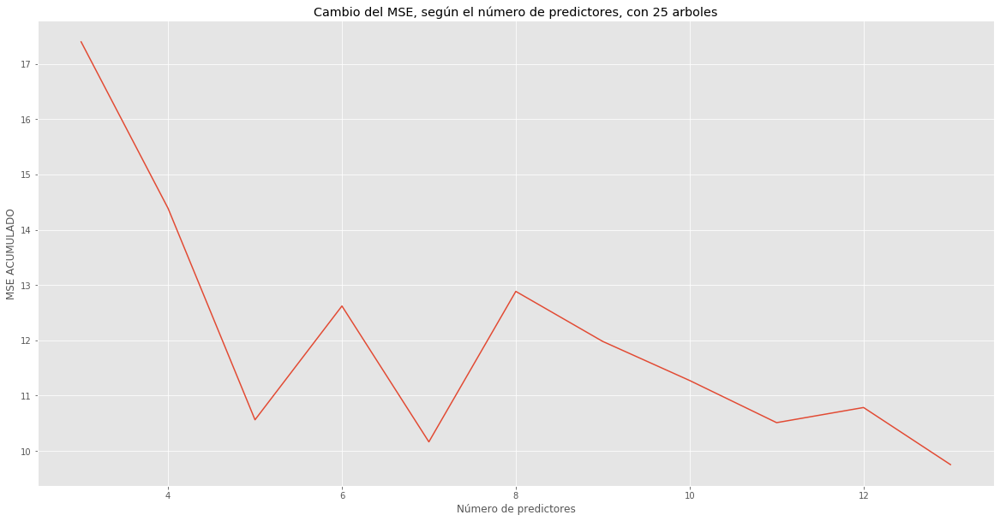

In [143]:
ax = sb.lineplot(x="# predictores", y="MSE",markers=True,dashes=True, data=arboles25).set(title = 'Cambio del MSE, según el número de predictores, con 25 arboles', 
xlabel ='Número de predictores' , ylabel ='MSE ACUMULADO'  )
plt.show()

In [144]:
##Grafico fijando 13 predictores y de 25 a 200 arboles
arbol=[]
mseaux=[]
for arboles in range(25,225,25):
    resultado=forest(arboles,13,X_train,y_train,X_test,y_test)
    arbol.append(arboles)
    mse=mean_squared_error(y_test, resultado)
    mseaux.append(mse)
data = {'# arboles':arbol, 'MSE':mseaux}
predictores13 =pd.DataFrame(data)

### <font color=red>--</font> Gráfico de cambio del MSE, según el cambio en el número de arboles, para un random forest con13 predictores:

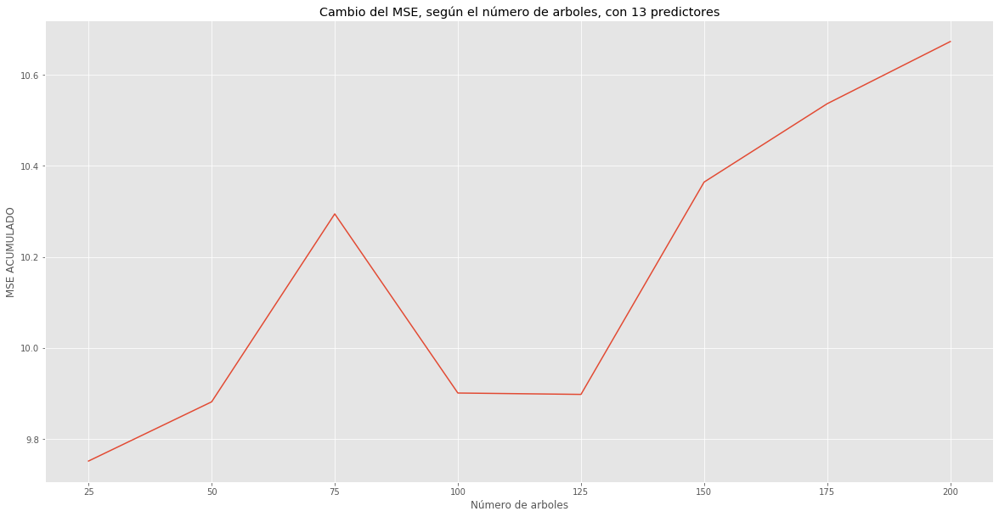

In [145]:
ax = sb.lineplot(x="# arboles", y="MSE",markers=True,dashes=True, data=predictores13).set(title = 'Cambio del MSE, según el número de arboles, con 13 predictores', 
xlabel ='Número de arboles' , ylabel ='MSE ACUMULADO'  )
plt.show()

### <font color=red>Conclusíon: </font> 
### <font color=red>--</font> Del ejericicio anterior, se pudo constatar que para este conjunto de datos, no es necesario incluir demasiados arboles en el random forest, pues con 25 se obtubo el mínimo MSE. Se evidenció que entre más arboles se añadieran, el MSE no mejoraba y muchas veces aumentaba. 
### <font color=red>--</font> Así mismo se vio que para este modelo, el uso completo de los 13 features fue la mejor alternativa, pues usando menos, el MSE generalmente se elevaba mucho.

### <font color=blue >8. In the lab, a classification tree was applied to the Carseats data set after converting Sales into a qualitative response variable. Now we will seek to predict Sales using regression trees and related approaches, treating the response as a quantitative variable </font>
.</font>

### <font color=red>--</font> Se obtiene el dataframe mencionado desde R. Para ajustar las regresiones se usarán los métodos incluidos en sklearn.

### <font color=red>--</font> Se ajustaran los datos a un arbol de regresión y a un random forest

In [146]:
## cargar los datos
seats=pd.read_csv("seats.csv")
seats.shape ### 400 registros para 11 variables

(400, 11)

In [147]:
seats.head()

,Sales,CompPrice,Income,Advertising,Population,Price,ShelveLoc,Age,Education,Urban,US
0,9.50,138,73,11,276,120,Bad,42,17,Yes,Yes
1,11.22,111,48,16,260,83,Good,65,10,Yes,Yes
2,10.06,113,35,10,269,80,Medium,59,12,Yes,Yes
3,7.40,117,100,4,466,97,Medium,55,14,Yes,Yes
4,4.15,141,64,3,340,128,Bad,38,13,Yes,No


In [148]:
seats.ShelveLoc.value_counts() #3
seats.Urban.value_counts()#2
seats.US.value_counts()#2

Yes    258
No     142
Name: US, dtype: int64

### <font color=red>--</font> Se debe hacer un encoding de las variables categoricas, ya que se deben llevar a una representación en enteros. Para esto se usa el labelencoder de sklearn.

In [149]:
label_encoder = LabelEncoder() ##Objeto enconder
seats["ShelveLoc"]=label_encoder.fit_transform(seats["ShelveLoc"])
seats["Urban"]=label_encoder.fit_transform(seats["Urban"])
seats["US"]=label_encoder.fit_transform(seats["US"])

In [150]:
seats.head() ##Listo el encoding

,Sales,CompPrice,Income,Advertising,Population,Price,ShelveLoc,Age,Education,Urban,US
0,9.50,138,73,11,276,120,0,42,17,1,1
1,11.22,111,48,16,260,83,1,65,10,1,1
2,10.06,113,35,10,269,80,2,59,12,1,1
3,7.40,117,100,4,466,97,2,55,14,1,1
4,4.15,141,64,3,340,128,0,38,13,1,0


### <font color=red>--</font> Se separan variables explicativas y de respuesta:

In [151]:
X=seats[seats.drop("Sales",axis=1).columns]
Y=seats.Sales


### <font color=blue>A. Split the data set into a training set and a test set.</font>
### <font color=red>--</font>80% para entrenar y 20% para test

In [152]:
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.20, random_state=1002) ## Se particionan los datos.

### <font color=blue>B. Fit a regression tree to the training set. Plot the tree, and interpret the results. What test MSE do you obtain?.</font>

In [153]:
arbol=DecisionTreeRegressor(random_state=32) ##Se crear objeto arbol de regresión
arbol.fit(X_train,y_train)

DecisionTreeRegressor(criterion='mse', max_depth=None, max_features=None,
                      max_leaf_nodes=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      presort=False, random_state=32, splitter='best')

In [154]:
columnas=X_train.columns
arbol.feature_importances_ ##ShelveLoc la de mayor peso

array([1.03938175e-01, 6.51266841e-02, 4.91565838e-02, 3.95780222e-02,
       2.90579909e-01, 2.97599647e-01, 9.97649013e-02, 5.04679835e-02,
       3.27793895e-05, 3.75531488e-03])

### <font color=red>--</font>Gráfico del árbol. Se hizo usando pydotplus.

### <font color=red>--</font>Se puede notar que SheleveLoc es el nodo raíz desde el cual se empiezan a partir las ramas. Lo cual tiene concordancia con la exploración de los pesos de los features en el árbol, donde ShelveLoc tiene el mayor peso.

In [155]:
##Plot del árbol:

dot_data = StringIO()
export_graphviz(arbol, max_depth=100, out_file=dot_data,  
                filled=True, rounded=True,impurity = True,
                special_characters=True,feature_names = columnas)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [156]:
arbol_predicho=arbol.predict(X_test)


### <font color=red>--</font>Con este árbol se obtiene un 5.65% de MSE en el conjunto de test.

In [157]:
mse=mean_squared_error(y_test, arbol_predicho)
print("EL MSE DEL ÁRBOL DE ES: ",mse)

EL MSE DEL ÁRBOL DE ES:  5.65499375


### <font color=blue>C. Use cross-validation in order to determine the optimal level of tree complexity. Does pruning the tree improve the test MSE?
    
### <font color=red>--</font> Se utilizará la técnica de Kfold que implementa la librería sklearn. Se probará con 5 splits de los datos. Adicionalmente, se comprobará como cambiando la profundidad máxima del árbol mejora el MSE en test.

In [158]:
##Iterar sobre la profundidad,haciendo validaciones cruzadas de 5 splits cada vez:
profundidades=[]
prommse=[]
for profundidad in range(1,200):
    arbol=DecisionTreeRegressor(random_state=232331,max_depth=profundidad) ##Se crear objeto arbol de regresión
    resultados=cross_val_score(arbol, X, Y, cv = 5,scoring='neg_mean_squared_error')
    profundidades.append(profundidad)
    prommse.append(statistics.mean(resultados))


In [161]:
print("La profundidad que mejor resultado arrojó en CV fue: ", profundidades[prommse.index(max(prommse))])
print("El promedio del neg mean squared error fue: ",prommse[prommse.index(max(prommse))])

La profundidad que mejor resultado arrojó en CV fue:  6
El promedio del neg mean squared error fue:  -4.4796644344743175


### <font color=red>--</font> Según la validación cruzada, con una profundidad de 6, el árbol de los mejores resultados. Se observa lo que ocurre ajustando el modelo a dicha profundidad, con conjunto de train y test, observando el mse en test: 

In [162]:
arbol=DecisionTreeRegressor(random_state=232331,max_depth=6) ##Se crea el arbol con profunidad establecida
arbol.fit(X_train,y_train) ##Se ajusta el árbol


DecisionTreeRegressor(criterion='mse', max_depth=6, max_features=None,
                      max_leaf_nodes=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      presort=False, random_state=232331, splitter='best')

In [163]:
arbol_predicho=arbol.predict(X_test)

### <font color=red>--</font> Gracias al análisis hecho por validación cruzada, se pudo podar el árbol y se mejoró el MSE en el conjunto de test. Ahora se tiene en 4.13 , a diferencia del 5.65 que se había alcanzado anteriormente, sin hacer validación cruzada.

In [164]:
mse=mean_squared_error(y_test, arbol_predicho)
print("EL MSE DEL ÁRBOL DE ES: ",mse)

EL MSE DEL ÁRBOL DE ES:  4.139928135937019


### <font color=blue>D. Use the bagging approach in order to analyze this data. What test MSE do you obtain? Use the importance() function to determine which variables are most important</font>
### <font color=red>--</font> El bagging es un caso especial del random forest, donde m=p, se consideran todas las variables para cada nodo. Se usará la implementación de bagging que tiene la librería sklearn.

In [165]:
bagging= BaggingRegressor(n_estimators=10, random_state=0)
bagging.fit(X_train,y_train)


BaggingRegressor(base_estimator=None, bootstrap=True, bootstrap_features=False,
                 max_features=1.0, max_samples=1.0, n_estimators=10,
                 n_jobs=None, oob_score=False, random_state=0, verbose=0,
                 warm_start=False)

In [166]:
bagging_predicho=bagging.predict(X_test)


### <font color=red>--</font> El MSE en el conjuto de test es de 2.8. Se explora la importancia de los features en el modelo:

In [167]:
mse=mean_squared_error(y_test, bagging_predicho)
print("EL MSE DEL ÁRBOL DE ES: ",mse)

EL MSE DEL ÁRBOL DE ES:  2.829412575


### <font color=red>--</font> Para explorar la importancia de los features, se observa la importancia que se tuvo en cada uno de los árboles estimadores y se obtienen los promedio por cada variables.
### <font color=red>--</font> Según el estudio, Price es la variable más importante para el modelo.

In [168]:
feature_importances = np.mean([
    tree.feature_importances_ for tree in bagging.estimators_
], axis=0)
feature_importances

array([0.12060362, 0.08679761, 0.09308049, 0.03579193, 0.3008883 ,
       0.220028  , 0.1062645 , 0.02496082, 0.00601416, 0.00557058])

### <font color=blue>E. Use random forests to analyze this data. What test MSE do you obtain? Use the importance() function to determine which variables are most important. Describe the effect of m, the number of variables considered at each split, on the error rate obtained. </font>

### <font color=red>--</font> Para este ejercicio, primero se establecerá cuál es el número de arboles y número de features a considerar en cada nodo, que dan mejor resultado. Para esto se usará una de las funciones creadas en literales anteriores, probando desde 25 hasta 700 arboles, en cada uno se probarán desde 3 hasta 10 features.





In [169]:
predictor=[]
arbol=[]
mseaux=[]
for arboles in range (25,725,25):
    for predictores in range(3,11):
        resultado=forest(arboles,predictores,X_train,y_train,X_test,y_test)
        mse=mean_squared_error(y_test, resultado)
        predictor.append(predictores)
        arbol.append(arboles)
        mseaux.append(mse)
        #print("# de arboles: ",arboles)
        #print("# predictores: ",predictores)
        #print("MSE: ",mse)
        ###Guardar en un
        #print("---------------------------------------------------------------")
minimo=mseaux.index(min(mseaux))
print("El mejor resultado se obtuvo con:",arbol[minimo], "Arboles, ",predictor[minimo]," Predictores, el MSE fue de: ",mseaux[minimo])

El mejor resultado se obtuvo con: 250 Arboles,  9  Predictores, el MSE fue de:  2.189237912800002



### <font color=red>--</font> Ya se sabe que con 250 arboles y 9 predictores a probar por nodo, se tiene el mejor MSE. Se observará el efecto de tener más o menos nodos en este random forest con 250 arboles:

In [170]:
predictores=[]
mseaux=[]
for predictor in range(1,11):
    resultado=forest(250,predictor,X_train,y_train,X_test,y_test)
    predictores.append(predictor)
    mse=mean_squared_error(y_test, resultado)
    mseaux.append(mse)

### <font color=red>--</font> El gráfico posterior muestra el efecto que tiene en el modelo el añadir más o menos predictores a probar por nodo. Claramente en este caso entre menos features se prueben en cada nodo, más aumenta el SME. Cuando se llega a 9 predictores, se obtiene el mínimo MSE, cuando se pasa a 10 incrementa. Entonces en 9 está el óptimo.

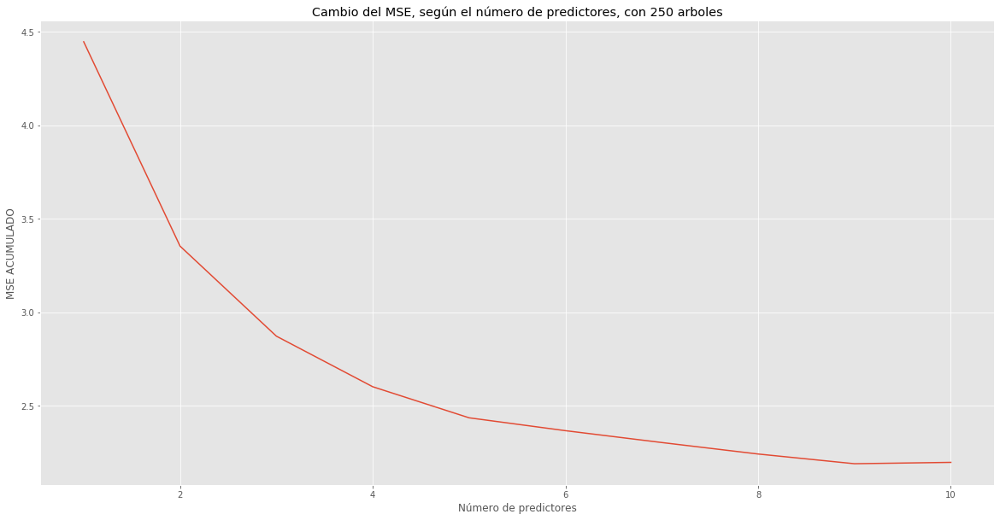

In [172]:
data = {'# predictores':predictores, 'MSE':mseaux}
arboles250 =pd.DataFrame(data)
ax = sb.lineplot(x="# predictores", y="MSE",markers=True,dashes=True, data=arboles250).set(title = 'Cambio del MSE, según el número de predictores, con 250 arboles', 
xlabel ='Número de predictores' , ylabel ='MSE ACUMULADO'  )
plt.show()

 ### <font color=blue>9. This problem involves the OJ data set which is part of the ISLR package.</font>
 ### <font color=red>--</font> Se obtiene el dataset mencionado desde R. Se muestra descripción de las variables:

In [173]:
orange=pd.read_csv("OJ.csv")
orange.shape ## 1070 registros de 18 variables

(1070, 18)

In [174]:
orange.head()

,Purchase,WeekofPurchase,StoreID,PriceCH,PriceMM,DiscCH,DiscMM,SpecialCH,SpecialMM,LoyalCH,SalePriceMM,SalePriceCH,PriceDiff,Store7,PctDiscMM,PctDiscCH,ListPriceDiff,STORE
0,CH,237,1,1.75,1.99,0.00,0.0,0,0,0.500000,1.99,1.75,0.24,No,0.000000,0.000000,0.24,1
1,CH,239,1,1.75,1.99,0.00,0.3,0,1,0.600000,1.69,1.75,-0.06,No,0.150754,0.000000,0.24,1
2,CH,245,1,1.86,2.09,0.17,0.0,0,0,0.680000,2.09,1.69,0.40,No,0.000000,0.091398,0.23,1
3,MM,227,1,1.69,1.69,0.00,0.0,0,0,0.400000,1.69,1.69,0.00,No,0.000000,0.000000,0.00,1
4,CH,228,7,1.69,1.69,0.00,0.0,0,0,0.956535,1.69,1.69,0.00,Yes,0.000000,0.000000,0.00,0


In [175]:
orange.describe()

,WeekofPurchase,StoreID,PriceCH,PriceMM,DiscCH,DiscMM,SpecialCH,SpecialMM,LoyalCH,SalePriceMM,SalePriceCH,PriceDiff,PctDiscMM,PctDiscCH,ListPriceDiff,STORE
count,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000
mean,254.381308,3.959813,1.867421,2.085411,0.051860,0.123364,0.147664,0.161682,0.565782,1.962047,1.815561,0.146486,0.059298,0.027314,0.217991,1.630841
std,15.558286,2.308984,0.101970,0.134386,0.117474,0.213834,0.354932,0.368331,0.307843,0.252697,0.143384,0.271563,0.101760,0.062232,0.107535,1.430387
min,227.000000,1.000000,1.690000,1.690000,0.000000,0.000000,0.000000,0.000000,0.000011,1.190000,1.390000,-0.670000,0.000000,0.000000,0.000000,0.000000
25%,240.000000,2.000000,1.790000,1.990000,0.000000,0.000000,0.000000,0.000000,0.325257,1.690000,1.750000,0.000000,0.000000,0.000000,0.140000,0.000000
50%,257.000000,3.000000,1.860000,2.090000,0.000000,0.000000,0.000000,0.000000,0.600000,2.090000,1.860000,0.230000,0.000000,0.000000,0.240000,2.000000
75%,268.000000,7.000000,1.990000,2.180000,0.000000,0.230000,0.000000,0.000000,0.850873,2.130000,1.890000,0.320000,0.112676,0.000000,0.300000,3.000000
max,278.000000,7.000000,2.090000,2.290000,0.500000,0.800000,1.000000,1.000000,0.999947,2.290000,2.090000,0.640000,0.402010,0.252688,0.440000,4.000000



### <font color =blue> * </font>Purchase
   ### A factor with levels CH and MM indicating whether the customer purchased Citrus Hill or Minute Maid Orange Juice

### <font color =blue> * </font>WeekofPurchase
   ### Week of purchase

### <font color =blue> * </font>StoreID
   ### Store ID

### <font color =blue> * </font>PriceCH
   ### Price charged for CH

### <font color =blue> * </font>PriceMM
   ### Price charged for MM

### <font color =blue> * </font>DiscCH
   ### Discount offered for CH

### <font color =blue> * </font>DiscMM
   ### Discount offered for MM

### <font color =blue> * </font>SpecialCH
   ### Indicator of special on CH

### <font color =blue> * </font>SpecialMM
   ### Indicator of special on MM

### <font color =blue> * </font>LoyalCH
   ### Customer brand loyalty for CH

### <font color =blue> * </font>SalePriceMM
   ### Sale price for MM

### <font color =blue> * </font>SalePriceCH
   ### Sale price for CH

### <font color =blue> * </font>PriceDiff
   ### Sale price of MM less sale price of CH

### <font color =blue> * </font>Store7
   ### A factor with levels No and Yes indicating whether the sale is at Store 7

### <font color =blue> * </font>PctDiscMM
   ### Percentage discount for MM

### <font color =blue> * </font>PctDiscCH
   ### Percentage discount for CH

### <font color =blue> * </font>ListPriceDiff
   ### List price of MM less list price of CH

### <font color =blue> * </font>STORE
   ### Which of 5 possible stores the sale occured at

### <font color =blue> A. Create a training set containing a random sample of 800 observations, and a test set containing the remaining observations.  </font>

### <font color=red>--</font> Considerando que se tiene un dataset de 1070 registros, se debe sacar un conjunto de entrenamiento de 800, lo cual corresponde al 75% aproximadamente de la muestra. Por esto, se particionan los datos dejando un 25.2% para test .
### <font color=red>--</font> Se realiza en el próximo literal, cuando se sepa cual es la variable de respuesta.

### <font color =blue> B. Fit a tree to the training data, with Purchase as the response and the other variables as predictors. Use the summary() function to produce summary statistics about the tree, and describe the results obtained. What is the training error rate? How many terminal nodes does the tree have? </font>

### <font color=red>--</font> Sabiendo que purchase es la variable de respuesta, se evidencia que se trata de un problema de clasificación. Se van a separar los conjuntos de predicción y de respuesta, para posteriormente particionar.

### <font color=red>--</font> Primero es vital hacer el label encoder a las variables categoricas, para llevarlas a una representación de enteros.

In [176]:
label_encoder = LabelEncoder() ##Objeto enconder
orange["Store7"]=label_encoder.fit_transform(orange["Store7"])


In [177]:
Y=orange.Purchase #Obtengo respuesta
X=orange[orange.drop("Purchase",axis=1).columns] ##Saco variable de respuesta


In [178]:
#Partición de datos:
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.252, random_state=1002) ## Se particionan los datos.

In [179]:
len(X_train) ## 800 muestras de train

800

In [180]:
arbol=DecisionTreeClassifier(random_state=2323)
arbol.fit(X_train,y_train)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=2323, splitter='best')

### <font color=red>--</font> La variable con más significancia para el modelo es loyalCh.
### <font color=red>--</font> Se obtuvieron en total 329 nodos

In [181]:
print("Importancia variables: ",arbol.feature_importances_)
print("Númer de nodos: ",arbol.tree_.node_count)

Importancia variables:  [0.07552405 0.01332176 0.0046391  0.01272588 0.00377254 0.00226013
 0.01266457 0.01234542 0.621774   0.01875779 0.0134831  0.13876292
 0.00459559 0.0018081  0.00090405 0.02829236 0.03436865]
Númer de nodos:  329


### <font color=red>--</font> El % de error en el conjunto de entrenamiento es de 1.12%

In [182]:
train_predicho=arbol.predict(X_train)
cm = ConfusionMatrix(y_train.to_numpy(), train_predicho,digit=5) ##Matriz confusión bonita
print("El % de error en conjunto de entrenamiento es: ", (1-cm.Overall_ACC)*100)

El % de error en conjunto de entrenamiento es:  1.1249999999999982


### <font color =blue> C. Type in the name of the tree object in order to get a detailed text output. Pick one of the terminal nodes, and interpret the information displayed.</font>
### <font color =blue> D. Create a plot of the tree, and interpret the results.

### <font color =red>--</font> Ambos literales se pueden trabajar unidos.

### <font color =red>--</font> Gráfico del Árbol:

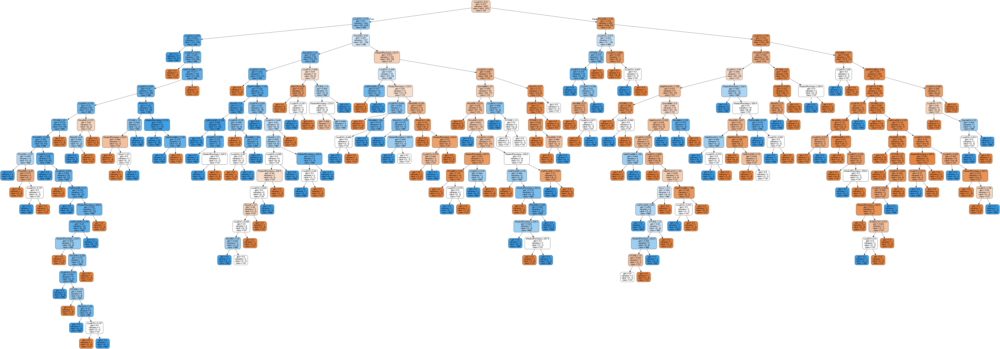

In [183]:
columnas=X.columns  ###Gráfica del arbol

dot_data = StringIO()
export_graphviz(arbol, max_depth=100, out_file=dot_data,  
                filled=True, rounded=True,impurity = True,
                special_characters=True,feature_names = columnas,class_names=["CH","MM"])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

### <font color =red>--</font> Se puede observar que el nodo raíz es LoyalCh, lo cual se esperaba, pues desde el punto anterior se descubrió que era la variable con mayor significancia. Su punto de partición está en el valor <= 0.51, de donde salen las dos ramas principales del arbol.

### <font color =red>--</font> Se extrae un nodo terminal del árbol para darle un análisis de la información que arroja:
<img src="tree.jpg">

### <font color =red>--</font>El nodo muestra que la variable que usa para particionar es WeekofPurchase, tomando como base para sus ramas el valor de 257.5. En este punto, el nodo tiene 2 muestras para clasificar. Si el WeekofPurchase es <=257.5, la muestra toma la clase "CH", en caso contrario toma la clase "MM".


### <font color =blue>E. Predict the response on the test data, and produce a confusion matrix comparing the test labels to the predicted test labels. What is the test error rate? </font> 

In [184]:
arbol_predicho=arbol.predict(X_test) ##Ajustar a test

### <font color =red>--</font>En el conjunto de test se presenta un porcentaje de error de 26.6%


In [185]:
cm = ConfusionMatrix(y_test.to_numpy(), arbol_predicho,digit=5) ##Matriz confusión bonita
print("El % de error en conjunto de entrenamiento es: ", (1-cm.Overall_ACC)*100)

El % de error en conjunto de entrenamiento es:  26.66666666666667


In [186]:
cm.print_matrix()

Predict   CH        MM        
Actual
CH        125       35        

MM        37        73        




### <font color =blue>F. Apply the cv.tree() function to the training set in order to determine the optimal tree size.
### <font color =red>--</font>En este contexto se buscará el tamaño optimo del árbol, probando varias implementaciones variando el size y eligiendo el que produzca el mínimo error. Para esto se usa un ciclo que itere sobre las diferentes profundidades y se guarda el %de error de cada uno de los arboles. Se prueba con una profundidad desde 1 hasta 200.

In [187]:
profundo=[]
error=[]
for size in range(1,200):
    arbol=DecisionTreeClassifier(random_state=5, max_depth=size)
    arbol.fit(X_train,y_train)
    arbol_predicho=arbol.predict(X_test) ##Ajustar a test
    cm = ConfusionMatrix(y_test.to_numpy(), arbol_predicho,digit=5) ##Matriz confusión bonita
    error2=(1-cm.Overall_ACC)*100
    profundo.append(size)
    error.append(error2)
    

### <font color =red>--</font>Se encuentra que el size óptimo para el arbol es con una profundidad de 2.

In [188]:
indice=error.index(min(error))
print("Profundidad óptima: ", profundo[indice])
print("% de error: ",error[indice])

Profundidad óptima:  2
% de error:  18.88888888888889


### <font color =blue> G. Produce a plot with tree size on the x-axis and cross-validated classification error rate on the y-axis.
### <font color =blue>H. Which tree size corresponds to the lowest cross-validated classification error rate? </font>
### <font color =red>--</font>Se pueden trabajar ambos literales unidos. Para la validación cruzada se harán 5 splits de los datos.

In [189]:
##Iterar sobre la profundidad,haciendo validaciones cruzadas de 5 splits cada vez:
profundidades=[]
prommse=[]
for size in range(1,200):
    arbol=DecisionTreeClassifier(random_state=3325, max_depth=size) ##Se crear objeto arbol de regresión
    resultados=cross_val_score(arbol, X,Y, cv =5,scoring='accuracy')
    profundidades.append(size)
    prommse.append(statistics.mean(resultados))
##metrics.SCORERS.keys()

In [190]:
fixed=[]
for i in prommse:
    fixed.append(1-i)

### <font color =red>--</font>El gráfico muestra como entre menos profundidad tenga este arbol, menos % de error obtiene en la validación cruzada. La menor se obtiene con una profundidad de entre 2 y 3. Aparentemente el modelo tiene muchas variables innecesarias que poca información aportan.

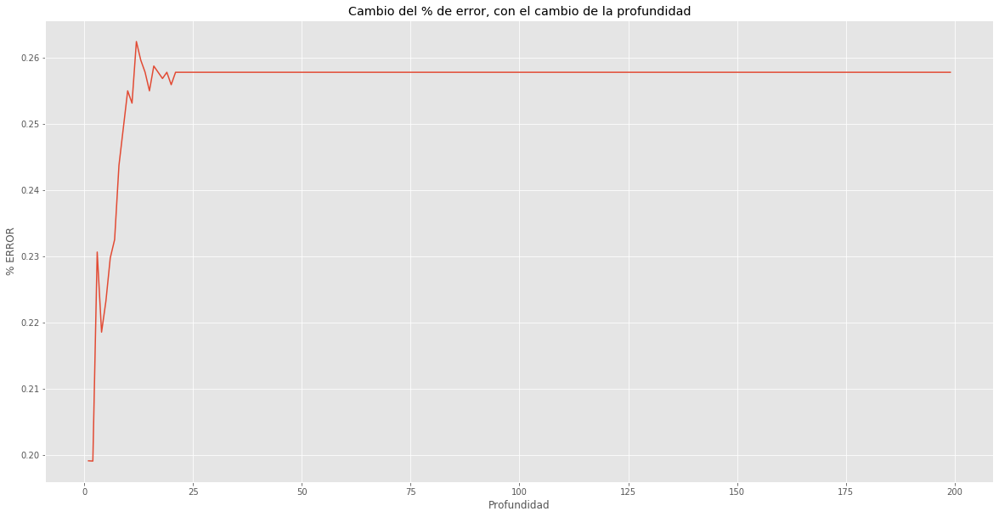

In [191]:
data = {'profundidad':profundidades, '% error':fixed}
errorfinal =pd.DataFrame(data)
ax = sb.lineplot(x="profundidad", y="% error",markers=True,dashes=True, data=errorfinal).set(title = 'Cambio del % de error, con el cambio de la profundidad', 
xlabel ='Profundidad' , ylabel ='% ERROR'  )
plt.show()

### <font color =blue>I. Produce a pruned tree corresponding to the optimal tree size obtained using cross-validation. If cross-validation does not lead to selection of a pruned tree, then create a pruned tree with five terminal nodes.</font>

### <font color =red>--</font> El árbol óptimo con validación cruzada arrojó una profundidad de 2. Se creára entonces un árbol con esta caracteristica:



In [192]:
arbol=DecisionTreeClassifier(random_state=5, max_depth=2) ##Se crear objeto arbol de regresión

### <font color =blue> J. Compare the training error rates between the pruned and unpruned trees. Which is higher?
### <font color =red>--</font> Se ajusta el árbol podado al conjunto de entrenamiento para obtener su % de error y compararlo con el del árbol no podado, que ya se sabe que % de error es de: 1.12%

In [193]:
arbol.fit(X_train,y_train) ##Sobre el conjunto de entrenamineto
podado_predicho=arbol.predict(X_train) ##Predicción en train

In [194]:
cm = ConfusionMatrix(y_train.to_numpy(), podado_predicho,digit=5) ##Matriz confusión bonita
print("El % de error en conjunto de entrenamiento del árbol podado es de: ", (1-cm.Overall_ACC)*100)

El % de error en conjunto de entrenamiento del árbol podado es de:  19.499999999999996


### <font color =red>--</font> El % de error en conjunto de entrenamiento fue más alto en el árbol podado. Esto era de esperarse, ya que es sabido que el árbol sin podar podría presentar alto sobreajuste.

### <font color =blue> K. Compare the test error rates between the pruned and unpruned trees. Which is higher?
### <font color =red>--</font> El % de error en conjunto en el conjunto de test del árbol sin podar fue de 26.6%. Se obtienen los resultados para el árbol podado:

In [195]:
test_predicho=arbol.predict(X_test)
cm = ConfusionMatrix(y_test.to_numpy(), test_predicho,digit=5) ##Matriz confusión bonita
print("El % de error en conjunto de test del árbol podado es de: ", (1-cm.Overall_ACC)*100)


El % de error en conjunto de test del árbol podado es de:  18.88888888888889


### <font color =red>--</font> El porcentaje de error en el conjunto de test para el árbol podado es de 18.8. Se puede notar que es mucho más bajito que el del árbol sin podar (26.6%) por el mismo motivo, este árbol podado tiene mucho menos sobreajuste.

<table>

  <tr>
<td> Tipo Arbol</td>
   <td><font color=red>% Error Train</font></td>

   <td><font color=red>% Error test</font></td>


  </tr>

  <tr>
<td>Podado</td>
<td>19.4%</td>

<td>18.8%</td>

  </tr>
  <tr>
<td>Sin podar</td>
    <td>1.12%</td>
<td>26.6% </td>


 

</table>


### <font color =blue> 10. We now use boosting to predict Salary in the Hitters data set
### <font color =red>--</font> Se obtiene el dataset necesario desde R.


In [196]:
##cargar csv 
hitter=pd.read_csv("hitters.csv")
hitter.shape
## 322 registros de 20 variables

(322, 20)

In [197]:
hitter.head()

,AtBat,Hits,HmRun,Runs,RBI,Walks,Years,CAtBat,CHits,CHmRun,CRuns,CRBI,CWalks,League,Division,PutOuts,Assists,Errors,Salary,NewLeague
0,293,66,1,30,29,14,1,293,66,1,30,29,14,A,E,446,33,20,NaN,A
1,315,81,7,24,38,39,14,3449,835,69,321,414,375,N,W,632,43,10,475.0,N
2,479,130,18,66,72,76,3,1624,457,63,224,266,263,A,W,880,82,14,480.0,A
3,496,141,20,65,78,37,11,5628,1575,225,828,838,354,N,E,200,11,3,500.0,N
4,321,87,10,39,42,30,2,396,101,12,48,46,33,N,E,805,40,4,91.5,N


In [198]:
hitter.describe() ##Muchos faltantes en salario

,AtBat,Hits,HmRun,Runs,RBI,Walks,Years,CAtBat,CHits,CHmRun,CRuns,CRBI,CWalks,PutOuts,Assists,Errors,Salary
count,322.000000,322.000000,322.000000,322.000000,322.000000,322.000000,322.000000,322.00000,322.000000,322.000000,322.000000,322.000000,322.000000,322.000000,322.000000,322.000000,263.000000
mean,380.928571,101.024845,10.770186,50.909938,48.027950,38.742236,7.444099,2648.68323,717.571429,69.490683,358.795031,330.118012,260.239130,288.937888,106.913043,8.040373,535.925882
std,153.404981,46.454741,8.709037,26.024095,26.166895,21.639327,4.926087,2324.20587,654.472627,86.266061,334.105886,333.219617,267.058085,280.704614,136.854876,6.368359,451.118681
min,16.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,19.00000,4.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,67.500000
25%,255.250000,64.000000,4.000000,30.250000,28.000000,22.000000,4.000000,816.75000,209.000000,14.000000,100.250000,88.750000,67.250000,109.250000,7.000000,3.000000,190.000000
50%,379.500000,96.000000,8.000000,48.000000,44.000000,35.000000,6.000000,1928.00000,508.000000,37.500000,247.000000,220.500000,170.500000,212.000000,39.500000,6.000000,425.000000
75%,512.000000,137.000000,16.000000,69.000000,64.750000,53.000000,11.000000,3924.25000,1059.250000,90.000000,526.250000,426.250000,339.250000,325.000000,166.000000,11.000000,750.000000
max,687.000000,238.000000,40.000000,130.000000,121.000000,105.000000,24.000000,14053.00000,4256.000000,548.000000,2165.000000,1659.000000,1566.000000,1378.000000,492.000000,32.000000,2460.000000


### <font color =blue>A. Remove the observations for whom the salary information is unknown, and then log-transform the salaries.
### <font color =red>--</font> Se eliminan 59 registros que tienen NaN en el salario, posteriormente se aplica la log transformación a la variable Salary

In [199]:
hitter = hitter.dropna() ## Eliminar los registros con NaN 
print("Tamaño del dataset ahora: ",len(hitter))

Tamaño del dataset ahora:  263


In [200]:
##Tranformación log
hitter['Salary'] = np.log(hitter['Salary'])

In [201]:
hitter.head() ##Transformación OK. 

,AtBat,Hits,HmRun,Runs,RBI,Walks,Years,CAtBat,CHits,CHmRun,CRuns,CRBI,CWalks,League,Division,PutOuts,Assists,Errors,Salary,NewLeague
1,315,81,7,24,38,39,14,3449,835,69,321,414,375,N,W,632,43,10,6.163315,N
2,479,130,18,66,72,76,3,1624,457,63,224,266,263,A,W,880,82,14,6.173786,A
3,496,141,20,65,78,37,11,5628,1575,225,828,838,354,N,E,200,11,3,6.214608,N
4,321,87,10,39,42,30,2,396,101,12,48,46,33,N,E,805,40,4,4.516339,N
5,594,169,4,74,51,35,11,4408,1133,19,501,336,194,A,W,282,421,25,6.620073,A


### <font color =red>--</font> Se transforman las variables categoricas usando el labelencoder anteriormente usado:

In [202]:
hitter['League']=label_encoder.fit_transform(hitter['League']) ##Tranformar las variables:
hitter['Division']=label_encoder.fit_transform(hitter['Division'])
hitter['NewLeague']=label_encoder.fit_transform(hitter['NewLeague'])

### <font color =blue> B. Create a training set consisting of the first 200 observations, and a test set consisting of the remaining observations.

In [203]:
train=hitter[0:200] ##200 primeras observaciones para train
test=hitter[200:] #resto para test

In [204]:
##Separar los x e y de train and test
X_train=train.drop("Salary",axis=1)
y_train=train.Salary
X_test=test.drop("Salary",axis=1)
y_test=test.Salary

### <font color =blue> C. Perform boosting on the training set with 1,000 trees for a range of values of the shrinkage parameter λ. Produce a plot with different shrinkage values on the x-axis and the corresponding training set MSE on the y-axis.
### <font color =red>--</font> Para la implementar boosting se usará el método que trae la librería Sklearn
### <font color =red>--</font> Para el parametro de aprendizaje, se usaran valores entre 0.1 y 1. Se guardarán los valores del MSE en cada uno, para presentar la grafica.


In [205]:
parametros=[]
mse=[]
for aprendizaje in range(1,11):
    boosting=GradientBoostingRegressor(learning_rate=aprendizaje/10,n_estimators=1000)
    boosting.fit(X_train,y_train)
    train_predicho=boosting.predict(X_train)
    mseaux=mean_squared_error(y_train, train_predicho)
    parametros.append(aprendizaje/10)
    mse.append(mseaux)
    


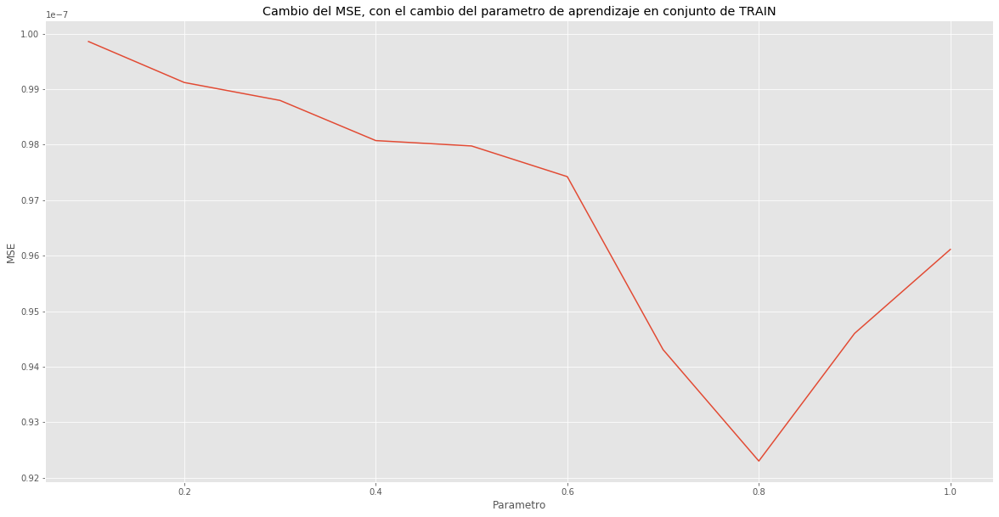

In [206]:
data = {'parametro':parametros, 'MSE':mse}
errorfinal =pd.DataFrame(data)
ax = sb.lineplot(x="parametro", y="MSE",markers=True,dashes=True, data=errorfinal).set(title = 'Cambio del MSE, con el cambio del parametro de aprendizaje en conjunto de TRAIN', 
xlabel ='Parametro' , ylabel ='MSE'  )
plt.show()

### <font color =blue>D. Produce a plot with different shrinkage values on the x-axis and the corresponding test set MSE on the y-axis.

In [207]:
parametros=[]  ##Mismo enfoque anterior, pero haciendo predicciones para X_test
mse=[]
for aprendizaje in range(1,11):
    boosting=GradientBoostingRegressor(learning_rate=aprendizaje/10,n_estimators=1000)
    boosting.fit(X_train,y_train)
    test_predicho=boosting.predict(X_test)
    mseaux=mean_squared_error(y_test, test_predicho)
    parametros.append(aprendizaje/10)
    mse.append(mseaux)
    

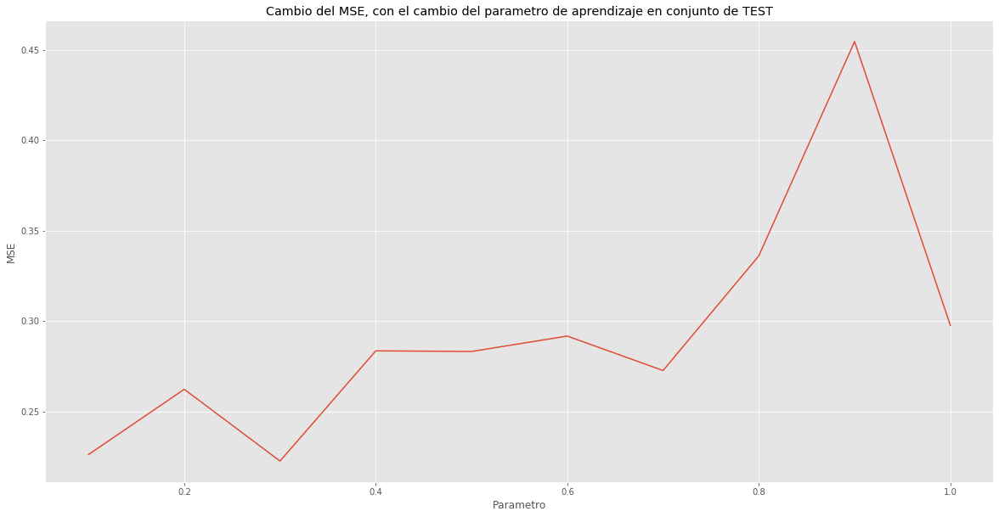

In [208]:
data = {'parametro':parametros, 'MSE':mse}
errorfinal =pd.DataFrame(data)
ax = sb.lineplot(x="parametro", y="MSE",markers=True,dashes=True, data=errorfinal).set(title = 'Cambio del MSE, con el cambio del parametro de aprendizaje en conjunto de TEST', 
xlabel ='Parametro' , ylabel ='MSE'  )
plt.show()

### <font color =blue> E. Compare the test MSE of boosting to the test MSE that results from applying two of the regression approaches seen in Chapters 3 and 6.

### <font color =red>--</font> Se aplicará una regresión Ridge y una regresión lineal al dataset, para comparar con boosting.

### <font color =green> Regresión lineal:

In [209]:
regresion_lineal=LinearRegression()
regresion_lineal.fit(X_train,y_train)


LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [210]:
y_predicho=regresion_lineal.predict(X_test)

In [211]:
mseaux=mean_squared_error(y_test, y_predicho)
mseaux

0.49179593754549333


### <font color =green> Regresión Ridge:

In [212]:
regresion_ridge=Ridge()
regresion_ridge.fit(X_train,y_train)

Ridge(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=None,
      normalize=False, random_state=None, solver='auto', tol=0.001)

In [213]:
ridge_predicho=regresion_ridge.predict(X_test)

In [214]:
mseaux=mean_squared_error(y_test, ridge_predicho)
mseaux

0.49277626094574484

### <font color =green> Resultados:
<table>

  <tr>
<td> Algoritmo</td>
   

   <td><font color=red>% Error test</font></td>


  </tr>

  <tr>
<td>Boosting</td>
<td>0.22</td>



  </tr>
  
   <tr>
<td>Ridge</td>
<td>0.49</td>



  </tr>
  <tr>
<td>Regresión lineal</td>
    <td>0.49</td>



 

</table>

### <font color =blue>F. Which variables appear to be the most important predictors in the boosted model?

In [215]:
boosting=GradientBoostingRegressor(learning_rate=0.3,n_estimators=1000)
boosting.fit(X_train,y_train)

GradientBoostingRegressor(alpha=0.9, criterion='friedman_mse', init=None,
                          learning_rate=0.3, loss='ls', max_depth=3,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=1000,
                          n_iter_no_change=None, presort='auto',
                          random_state=None, subsample=1.0, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False)

In [216]:
##CAtBat Cruns
boosting.feature_importances_


array([3.26695664e-02, 2.40842319e-02, 5.54700057e-03, 1.33175341e-03,
       1.24727671e-02, 4.70956331e-02, 2.12927687e-02, 5.67660174e-01,
       4.46356253e-02, 3.50015831e-02, 4.20301218e-02, 8.02744621e-02,
       5.27766769e-02, 5.88531312e-07, 6.20688477e-05, 1.59994477e-02,
       7.65554125e-03, 8.19873532e-03, 1.21125352e-03])

### <font color =red>--</font> Los predictores más importantes para el modelo son: CatBat y Cruns

### <font color =blue> G. Now apply bagging to the training set. What is the test set MSE for this approach?

In [217]:
baggin=BaggingRegressor()
baggin.fit(X_train,y_train)

BaggingRegressor(base_estimator=None, bootstrap=True, bootstrap_features=False,
                 max_features=1.0, max_samples=1.0, n_estimators=10,
                 n_jobs=None, oob_score=False, random_state=None, verbose=0,
                 warm_start=False)

In [218]:
baggin_predicho=baggin.predict(X_test)
mseaux=mean_squared_error(y_test, baggin_predicho)
mseaux

0.2520496831553251

### <font color =red>--</font> Con la técnica de bagging se alcanza un MSE de 0.24 en el conjunto de test.

### <font color =blue> 11. This question uses the Caravan data set.
### <font color =red>--</font> Se obtiene el dataset necesario usando R.
### <font color =red>--</font> No hay variables categóricas


In [219]:
caravana=pd.read_csv("caravan.csv")
caravana.shape
##5822 registros para 86 variables

(5822, 86)

In [220]:
caravana.head()

,MOSTYPE,MAANTHUI,MGEMOMV,MGEMLEEF,MOSHOOFD,MGODRK,MGODPR,MGODOV,MGODGE,MRELGE,MRELSA,MRELOV,MFALLEEN,MFGEKIND,MFWEKIND,MOPLHOOG,MOPLMIDD,MOPLLAAG,MBERHOOG,MBERZELF,MBERBOER,MBERMIDD,MBERARBG,MBERARBO,MSKA,MSKB1,MSKB2,MSKC,MSKD,MHHUUR,MHKOOP,MAUT1,MAUT2,MAUT0,MZFONDS,MZPART,MINKM30,MINK3045,MINK4575,MINK7512,MINK123M,MINKGEM,MKOOPKLA,PWAPART,PWABEDR,PWALAND,PPERSAUT,PBESAUT,PMOTSCO,PVRAAUT,PAANHANG,PTRACTOR,PWERKT,PBROM,PLEVEN,PPERSONG,PGEZONG,PWAOREG,PBRAND,PZEILPL,PPLEZIER,PFIETS,PINBOED,PBYSTAND,AWAPART,AWABEDR,AWALAND,APERSAUT,ABESAUT,AMOTSCO,AVRAAUT,AAANHANG,ATRACTOR,AWERKT,ABROM,ALEVEN,APERSONG,AGEZONG,AWAOREG,ABRAND,AZEILPL,APLEZIER,AFIETS,AINBOED,ABYSTAND,Purchase
0,33,1,3,2,8,0,5,1,3,7,0,2,1,2,6,1,2,7,1,0,1,2,5,2,1,1,2,6,1,1,8,8,0,1,8,1,0,4,5,0,0,4,3,0,0,0,6,0,0,0,0,0,0,0,0,0,0,0,5,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,No
1,37,1,2,2,8,1,4,1,4,6,2,2,0,4,5,0,5,4,0,0,0,5,0,4,0,2,3,5,0,2,7,7,1,2,6,3,2,0,5,2,0,5,4,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,No
2,37,1,2,2,8,0,4,2,4,3,2,4,4,4,2,0,5,4,0,0,0,7,0,2,0,5,0,4,0,7,2,7,0,2,9,0,4,5,0,0,0,3,4,2,0,0,6,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,No
3,9,1,3,3,3,2,3,2,4,5,2,2,2,3,4,3,4,2,4,0,0,3,1,2,3,2,1,4,0,5,4,9,0,0,7,2,1,5,3,0,0,4,4,0,0,0,6,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,No
4,40,1,4,2,10,1,4,1,4,7,1,2,2,4,4,5,4,0,0,5,4,0,0,0,9,0,0,0,0,4,5,6,2,1,5,4,0,0,9,0,0,6,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,6,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,No


### <font color =blue> A. Create a training set consisting of the first 1,000 observations, and a test set consisting of the remaining observations.

In [221]:
train=caravana[0:1000] ##200 primeras observaciones para train
test=caravana[1001:] #resto para test

### <font color =blue> B. Fit a boosting model to the training set with Purchase as the response and the other variables as predictors. Use 1,000 trees, and a shrinkage value of 0.01. Which predictors appear to be the most important?
### <font color =red>--</font> Se usa la implementación de boosting de clasificación que tiene Sklearn.

In [222]:
##Separar los x e y de train and test
X_train=train.drop("Purchase",axis=1)
y_train=train.Purchase
X_test=test.drop("Purchase",axis=1)
y_test=test.Purchase

In [223]:
boosting=GradientBoostingClassifier(n_estimators=1000,learning_rate=0.01 ) ##Crear el objeto de boosting con los parametros indicados
boosting.fit(X_train,y_train)

GradientBoostingClassifier(criterion='friedman_mse', init=None,
                           learning_rate=0.01, loss='deviance', max_depth=3,
                           max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_impurity_split=None,
                           min_samples_leaf=1, min_samples_split=2,
                           min_weight_fraction_leaf=0.0, n_estimators=1000,
                           n_iter_no_change=None, presort='auto',
                           random_state=None, subsample=1.0, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)

In [224]:
result = numpy.where(boosting.feature_importances_ == numpy.amax(boosting.feature_importances_)) ##Obtener el indice del predictor con más peso
print(boosting.feature_importances_[46]) ##Importancia del top
X_train.columns[46] ##Nombre del top 

0.07504490930060836


'PPERSAUT'

### <font color =red>--</font> El predictor más importante parecer ser PPERSAUT

### <font color =blue> C. Use the boosting model to predict the response on the test data. Predict that a person will make a purchase if the estimated probability of purchase is greater than 20 %. Form a confusion matrix. What fraction of the people predicted to make a purchase do in fact make one? How does this compare with the results obtained from applying KNN or logistic regression to this data set?</font>

### <font color =red>--</font> Se debe encontrar en la matríz de confusión la fracción de personas que se predijo harían una compra y en realidad la hacen, o sea los verdaderos positivos de la clase Yes.

In [225]:
boosting_predicho=boosting.predict(X_test)
cm = ConfusionMatrix(y_test.to_numpy(), boosting_predicho,digit=5) ##Matriz confusión bonita
cm.print_matrix() ##Aclara la clase directamente

Predict    No         Yes        
Actual
No         4486       46         

Yes        273        16         




### <font color =red>--</font> Se logró predecir con éxito solo un 25.3% de las personas que comprarían.

### <font color =green> Probando con regresión logistica:

In [226]:
regresion=LogisticRegression(solver="liblinear")
regresion.fit(X_train,y_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='liblinear', tol=0.0001, verbose=0,
                   warm_start=False)

In [227]:
y_regresion=regresion.predict(X_test)
cm = ConfusionMatrix(y_test.to_numpy(), y_regresion,digit=5) ##Matriz confusión bonita
cm.print_matrix() ##Aclara la clase directamente

Predict    No         Yes        
Actual
No         4494       38         

Yes        278        11         




### <font color =red>--</font>Con regresión logistica se obtuvo un resultado aún peor, solo se logró predecir un 22% de las personas que comprarían.

### <font color=blue>12. Apply boosting, bagging, and random forests to a data set of your choice. Be sure to fit the models on a training set and to evaluate their performance on a test set. How accurate are the results compared to simple methods like linear or logistic regression? Which of these approaches yields the best performance?</font>

### <font color =red>--</font>Se usará el dataset college de R, para crear una variable binaria con base en la mediana de su variable Grad.Rate. Se asignará un 1 si está arriba de la mediana y 0 en caso contrario. Después se ajustarán los modelos de clasificación respectivos. 

### <font color =red>--</font>Por simplicidad se usarán todos los features en los modelos, así como no se tratará de ajustar los parametros óptimos. La variable categórica se transformara.

In [228]:
college=pd.read_csv("college.csv")
college.shape

(777, 18)

In [229]:
college.head()

,Private,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate
0,Yes,1660,1232,721,23,52,2885,537,7440,3300,450,2200,70,78,18.1,12,7041,60
1,Yes,2186,1924,512,16,29,2683,1227,12280,6450,750,1500,29,30,12.2,16,10527,56
2,Yes,1428,1097,336,22,50,1036,99,11250,3750,400,1165,53,66,12.9,30,8735,54
3,Yes,417,349,137,60,89,510,63,12960,5450,450,875,92,97,7.7,37,19016,59
4,Yes,193,146,55,16,44,249,869,7560,4120,800,1500,76,72,11.9,2,10922,15


In [230]:
college["MedianRate"]=np.where(college['Grad.Rate']>=college["Grad.Rate"].median(), 1, 0) ##Computo la nueva columna

In [231]:
college=college.drop("Grad.Rate",axis=1) ##Borro varaible que ya no usaré

In [232]:
label_encoder = LabelEncoder() ##Objeto enconder
college["Private"]=label_encoder.fit_transform(college["Private"]) ##tranformar variable

In [233]:
X=college[college.drop("MedianRate",axis=1).columns]
Y=college.MedianRate

In [234]:
#Partición de datos:
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.25, random_state=1002) ## Se particionan los datos.

### <font color=green> Boostin: </font>

In [235]:
boosting=GradientBoostingClassifier() ##Objeto boosting
boosting.fit(X_train,y_train) ##Ajuste en train
boosting_predicho=boosting.predict(X_test)##Preecir test
cm = ConfusionMatrix(y_test.to_numpy(), boosting_predicho,digit=5) ##Matriz confusión bonita
cm.print_matrix() ##Aclara la clase directamente


Predict  0        1        
Actual
0        73       25       

1        24       73       




In [236]:
print("El % de error es: ", (1-cm.Overall_ACC)*100)

El % de error es:  25.128205128205128


### <font color =red>--</font>Con Boosting se obtuvo un error de 25.6% en el conjunto de test.
### <font color=green> Random Forest: </font>

In [237]:

forest=RandomForestClassifier() ##Objeto boosting
forest.fit(X_train,y_train) ##Ajuste en train
forest_predicho=forest.predict(X_test)##Preecir test
cm = ConfusionMatrix(y_test.to_numpy(), forest_predicho,digit=5) ##Matriz confusión bonita
cm.print_matrix() ##Aclara la clase directamente

Predict  0        1        
Actual
0        82       16       

1        28       69       




C:\Users\sgonzalezq\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


In [238]:
print("El % de error es: ", (1-cm.Overall_ACC)*100)

El % de error es:  22.564102564102562


### <font color =red>--</font>Con random forest se obtuvo un error de 25.1% en el conjunto de test.
### <font color=green> Bagging: </font>

In [239]:
bagging=BaggingClassifier() ##Objeto boosting
bagging.fit(X_train,y_train) ##Ajuste en train
bagging_predicho=bagging.predict(X_test)##Preecir test
cm = ConfusionMatrix(y_test.to_numpy(), bagging_predicho,digit=5) ##Matriz confusión bonita
cm.print_matrix() ##Aclara la clase directamente

Predict  0        1        
Actual
0        81       17       

1        33       64       




In [240]:
print("El % de error es: ", (1-cm.Overall_ACC)*100)

El % de error es:  25.64102564102564


### <font color =red>--</font>Con bagging se obtuvo un error de 24.6% en el conjunto de test; siendo este el mejor resultado de los métodos avanzados.

### <font color =red>--</font>De los métodos simples se usará una regresión logistica.
### <font color=green> Regresión logistica: </font>

In [241]:
logistic=LogisticRegression(solver="lbfgs",max_iter=180) ##Objeto boosting
logistic.fit(X_train,y_train) ##Ajuste en train
logistic_predicho=logistic.predict(X_test)##Preecir test
cm = ConfusionMatrix(y_test.to_numpy(), logistic_predicho,digit=5) ##Matriz confusión bonita
cm.print_matrix() ##Aclara la clase directamente

Predict  0        1        
Actual
0        64       34       

1        19       78       




C:\Users\sgonzalezq\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:947: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)


In [242]:
print("El % de error es: ", (1-cm.Overall_ACC)*100)

El % de error es:  27.179487179487182


### <font color =red>--</font>Con regresión logistica se obtuvo un error de 27.1% en el conjunto de test. Siendo el menor desempeño de todos los modelos:

<table>

  <tr>
<td> Algoritmo</td>
   

   <td><font color=red>% Error test</font></td>


  </tr>

  <tr>
<td>Boosting</td>
<td>25.6</td>



  </tr>
  
   <tr>
<td>Random Forest</td>
<td>25.1</td>



  </tr>
  <tr>
<td>Bagging</td>
    <td>24.6</td>
<tr>
<td>Regresión logistica</td>
<td>27.1</td>



  </tr>


 

</table>


### <font color=red>  9.7.2 del 4 al 8. </font>

### <font color=blue>4. Generate a simulated two-class data set with 100 observations and two features in which there is a visible but non-linear separation between the two classes. Show that in this setting, a support vector machine with a polynomial kernel (with degree greater than 1) or a radial kernel will outperform a support vector classifier on the training data. Which technique performs best on the test data? Make plots and report training and test error rates in order to back up your assertions
    
### <font color=red>-- </font>Se deben simular un dataset de 100 observaciones, con dos features y 2 clases. En otras palabras, simular un problema de clasificación, para aplicar SVM. Para este proceso, se hace uso de la función make_classification de la librería Sklearn. Finalmente los datos se añaden a un dataframe para tener mejor manejo y visualización. Finalmente se usará 20% para test y 80% para train:

In [243]:
from sklearn.datasets import make_moons, make_circles, make_classification
X, y = make_classification(n_features=2, n_redundant=0, n_informative=2,
                           random_state=2332321, n_clusters_per_class=1) ##Se crean las muestras con los parametros indicados.

In [244]:
##Separar los datos para llevarlos a un dataset.
feature1=X[:,0]
feature2=X[:,1]
datos={"X1":feature1,"X2":feature2,"Clase":y}
dataframe=pd.DataFrame(datos)

### <font color=red>-- </font> Se muestra que es difícil poder separar los datos por medio de una linea:

C:\Users\sgonzalezq\AppData\Local\Continuum\anaconda3\lib\site-packages\seaborn\axisgrid.py:2065: UserWarning: The `size` parameter has been renamed to `height`; pleaes update your code.
  warnings.warn(msg, UserWarning)


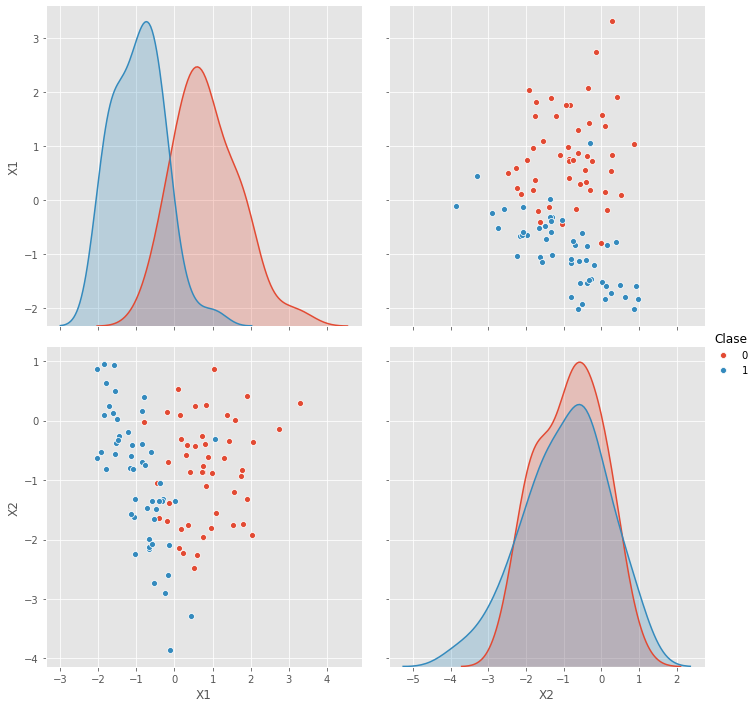

In [245]:
plt.rcParams['figure.figsize'] = (10,5)
sb.pairplot(dataframe,size=5,vars=dataframe.drop("Clase",axis=1).columns,kind='scatter', hue="Clase") ##Grafica con base en 3 variables.
plt.show()

In [246]:
##Separar datos train y test
X=dataframe[dataframe.drop("Clase",axis=1).columns]
Y=dataframe.Clase


In [247]:
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.20, random_state=32302) ## Se particionan los datos.

### <font color=green> SVM Polynomial kernel, grado 3: </font>

In [248]:
svm= SVC(C=1.0, kernel='poly', degree=3) ##SVM de clasificación,kernel poly, grado 3.
svm.fit(X_train,y_train) ##Se ajusta

C:\Users\sgonzalezq\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:193: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)


SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='auto_deprecated',
    kernel='poly', max_iter=-1, probability=False, random_state=None,
    shrinking=True, tol=0.001, verbose=False)

In [249]:
svm_predicho=svm.predict(X_train) ##Predecir en test
cm = ConfusionMatrix(y_train.to_numpy(),svm_predicho,digit=5) ##Matriz confusión bonita
cm.print_matrix() ##Aclara la clase directamente
print("El % de error en train es: ", (1-cm.Overall_ACC)*100)

Predict  0        1        
Actual
0        42       1        

1        6        31       


El % de error en train es:  8.750000000000002


In [250]:
svm_predicho=svm.predict(X_test) ##Predecir en test
cm = ConfusionMatrix(y_test.to_numpy(), svm_predicho,digit=5) ##Matriz confusión bonita
cm.print_matrix() ##Aclara la clase directamente
print("El % de error en test es: ", (1-cm.Overall_ACC)*100)

Predict  0        1        
Actual
0        5        1        

1        2        12       


El % de error en test es:  15.000000000000002


### <font color=blue> Para el gráfico se usó la librería mlextend:</font>

Text(0.5, 1.0, 'PLOT SVM CON KERNEL POLY GRADO 3:')

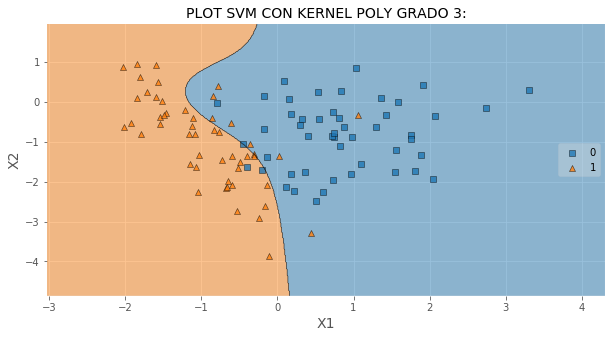

In [251]:

plot_decision_regions(X=X.values, 
                      y=Y.values,
                      clf=svm, 
                      legend=5)

# Update plot object with X/Y axis labels and Figure Title
plt.xlabel(X.columns[0], size=14)
plt.ylabel(X.columns[1], size=14)
plt.title('PLOT SVM CON KERNEL POLY GRADO 3:', size=14)

### <font color=green> SVM Radial Kernel: </font>

In [252]:
svm= SVC(C=1.0, kernel='rbf') ##SVM de clasificación,kernel poly, grado 3.
svm.fit(X_train,y_train) ##Se ajusta

C:\Users\sgonzalezq\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:193: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)


SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='auto_deprecated',
    kernel='rbf', max_iter=-1, probability=False, random_state=None,
    shrinking=True, tol=0.001, verbose=False)

In [253]:
svm_predicho=svm.predict(X_train) ##Predecir en test
cm = ConfusionMatrix(y_train.to_numpy(),svm_predicho,digit=5) ##Matriz confusión bonita
cm.print_matrix() ##Aclara la clase directamente
print("El % de error en train es: ", (1-cm.Overall_ACC)*100)

Predict  0        1        
Actual
0        39       4        

1        1        36       


El % de error en train es:  6.25


In [254]:
svm_predicho=svm.predict(X_test) ##Predecir en test
cm = ConfusionMatrix(y_test.to_numpy(), svm_predicho,digit=5) ##Matriz confusión bonita
cm.print_matrix() ##Aclara la clase directamente
print("El % de error en test es: ", (1-cm.Overall_ACC)*100)

Predict  0        1        
Actual
0        5        1        

1        1        13       


El % de error en test es:  9.999999999999998


### <font color=blue> Para el gráfico se usó la librería mlextend:</font>

Text(0.5, 1.0, 'PLOT SVM CON KERNEL RADIAL:')

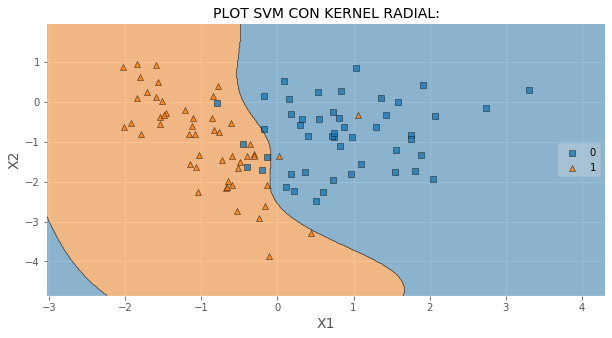

In [255]:

plot_decision_regions(X=X.values, 
                      y=Y.values,
                      clf=svm, 
                      legend=5)

# Update plot object with X/Y axis labels and Figure Title
plt.xlabel(X.columns[0], size=14)
plt.ylabel(X.columns[1], size=14)
plt.title('PLOT SVM CON KERNEL RADIAL:', size=14)

### <font color=red>-- </font> Se observa como el kernel radial tuvo mejor desempeño en este conjunto de datos: 
<table>

  
<td> Kernel</td>
   

   <td><font color=red>% Error test</font></td>
    <td><font color=red>% Error train</font></td>



  </tr>

  <tr>
<td>Poly grado 3</td>
<td>6.25</td>
    <td>15</td>



  </tr>
  
  
   
<td>Radial </td>
<td>6.25</td>
    <td>9.9</td>



  </tr>
  
  

 

</table>


### <font color=blue> 5. We have seen that we can fit an SVM with a non-linear kernel in order to perform classification using a non-linear decision boundary. We will now see that we can also obtain a non-linear decision boundary by performing logistic regression using non-linear transformations of the features. </font>

### <font color=red>-- </font> Se quiere hacer la comparación con la regresión logistica, la cual se sabe que también logra diferenciar clases con limites no lineales, sin tener que aplicar transformaciones en sus features. 

### <font color=blue> A. Generate a data set with n = 500 and p = 2, such that the observations belong to two classes with a quadratic decision boundary between them. For instance, you can do this as follows:
### x1=runif (500) -0.5
### x2=runif (500) -0.5
### y=1*(x1^2-x2^2 > 0)

In [256]:
x1=np.random.uniform(1,5,500) -0.9 ##generar muestras de una uniforme para x1 y x2
x2=np.random.uniform(1,5,500) -0.9


In [257]:
y =(x1**2 - x2**2 >0) ##crear y
##crear dataframe
datos={"X1":x1,"X2":x2,"Clase":y}
dataframe=pd.DataFrame(datos)
dataframe["Clase"]=np.where(dataframe["Clase"]==True, 1, 0) ##Computo la nueva columna

In [258]:
dataframe.head()

,X1,X2,Clase
0,2.026292,2.801142,0
1,1.420558,2.827453,0
2,2.823211,3.890392,0
3,0.408506,1.627339,0
4,3.333458,1.052408,1


### <font color=blue> B. Plot the observations, colored according to their class labels. Your plot should display X1 on the x-axis, and X2 on the yaxis.

C:\Users\sgonzalezq\AppData\Local\Continuum\anaconda3\lib\site-packages\seaborn\axisgrid.py:2065: UserWarning: The `size` parameter has been renamed to `height`; pleaes update your code.
  warnings.warn(msg, UserWarning)


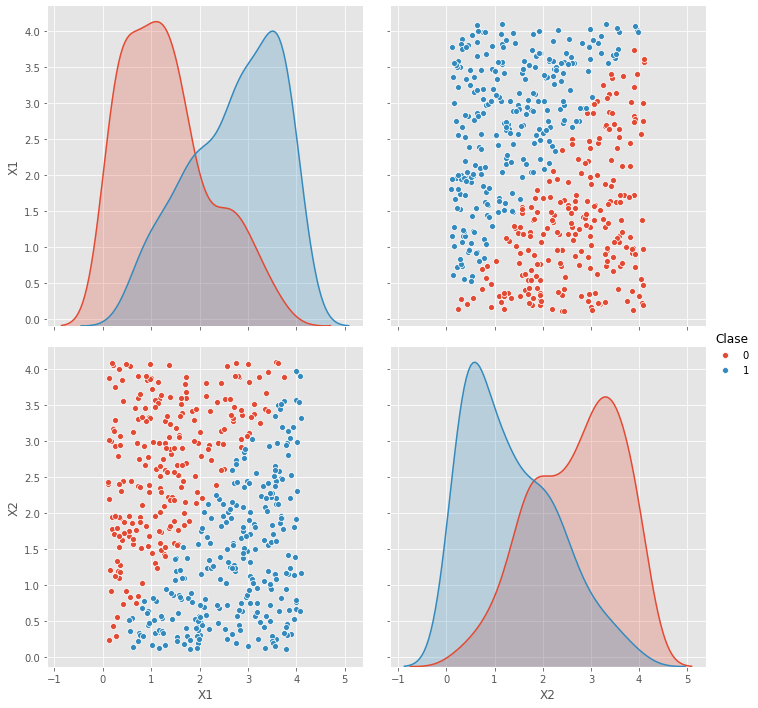

In [259]:
plt.rcParams['figure.figsize'] = (10,5)
sb.pairplot(dataframe,size=5,vars=dataframe.drop("Clase",axis=1).columns,kind='scatter', hue="Clase") ##Grafica con base en 3 variables.
plt.show()

### <font color=blue> C. Fit a logistic regression model to the data, using X1 and X2 as predictors.

In [260]:
##Separar datos train y test
X=dataframe[dataframe.drop("Clase",axis=1).columns]
Y=dataframe.Clase
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.20, random_state=32302) ## Se particionan los datos.

In [261]:
logistic=LogisticRegression(solver="liblinear")  ##entrenar el modelo con todos los datos
logistic.fit(X,Y)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='liblinear', tol=0.0001, verbose=0,
                   warm_start=False)

### <font color=blue>D. Apply this model to the training data in order to obtain a predicted class label for each training observation. Plot the observations, colored according to the predicted class labels. The decision boundary should be linear

In [262]:
entrenamiento=logistic.predict(X_train) ##Predecir el conjunto de train
aux=X_train.copy()


In [263]:
aux["Predicho"]=entrenamiento
aux["Real"]=y_train  ##añadir predicho y real al dataset

### <font color=red>-- </font> Efectivamente se puede observar como la linea de decisión es una recta sin problema alguno:


C:\Users\sgonzalezq\AppData\Local\Continuum\anaconda3\lib\site-packages\seaborn\axisgrid.py:2065: UserWarning: The `size` parameter has been renamed to `height`; pleaes update your code.
  warnings.warn(msg, UserWarning)


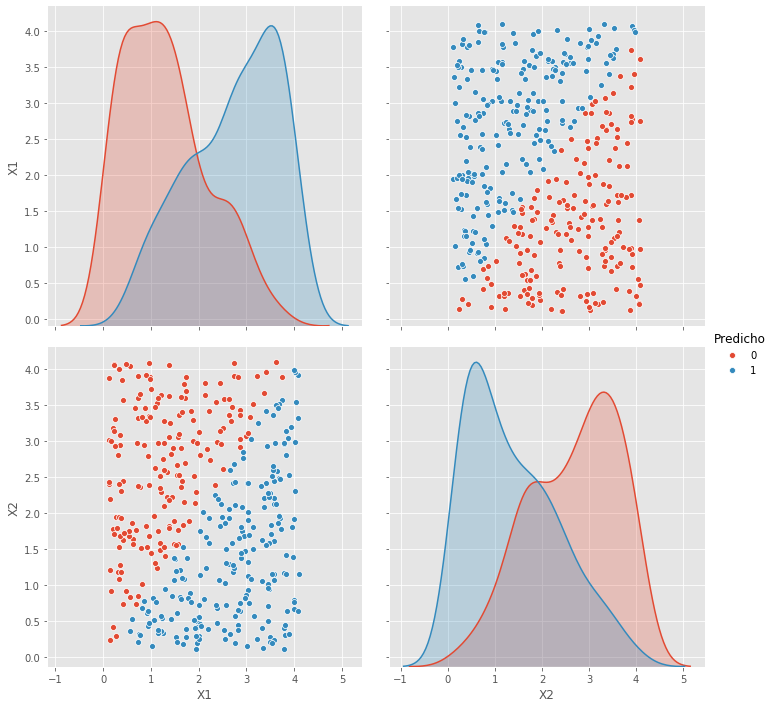

In [264]:
plt.rcParams['figure.figsize'] = (10,5)
sb.pairplot(aux,size=5,vars=aux.drop(["Predicho","Real"],axis=1).columns,kind='scatter', hue="Predicho") ##Grafica con base en 3 variables.
plt.show()

In [265]:
cm = ConfusionMatrix(y_train.to_numpy(), entrenamiento,digit=5) ##Matriz confusión bonita
print("El % de error en train es: ", (1-cm.Overall_ACC)*100)

El % de error en train es:  0.5000000000000004


### <font color=blue>E. Now fit a logistic regression model to the data using non-linear functions of X1 and X2 as predictors (e.g. X1^2 , X1*X2, log(X2), and so forth). </font>
### <font color=red>-- </font> Se usarán los siguientes features:  X1^2, X2^2 , X1*X2, (X1+X2)^(1/2). Es necesario preparar los features transformados:

In [266]:
x1cuadrado=x1**2
x2cuadrado=x2**2
x1x2=(np.multiply(x1,x2))**3
raizsuma=(x1+x2)**(1/2)

In [267]:
data={"x1cuadrado":x1cuadrado,"x2cuadrado":x2cuadrado,"x1x2":x1x2,'raizsuma':raizsuma,"Clase":y}
dataframe=pd.DataFrame(data)
dataframe["Clase"]=np.where(dataframe["Clase"]==True, 1, 0) ##Computo la nueva columna

In [268]:
dataframe.head()

,x1cuadrado,x2cuadrado,x1x2,raizsuma,Clase
0,4.105859,7.846398,182.857027,2.197142,0
1,2.017986,7.994490,64.798253,2.061070,0
2,7.970521,15.135148,1324.982339,2.591062,0
3,0.166877,2.648232,0.293785,1.426830,0
4,11.111943,1.107562,43.175495,2.094246,1


In [269]:
X=dataframe[dataframe.drop("Clase",axis=1).columns]
Y=dataframe.Clase
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.20, random_state=32302) ## Se particionan los datos.

In [270]:
logistic=LogisticRegression(solver="liblinear")  ##entrenar el modelo con todos los datos
logistic.fit(X,Y)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='liblinear', tol=0.0001, verbose=0,
                   warm_start=False)

### <font color=blue> F. Apply this model to the training data in order to obtain a predicted class label for each training observation. Plot the observations, colored according to the predicted class labels. The decision boundary should be obviously non-linear. If it is not, then repeat (a)-(e) until you come up with an example in which the predicted class labels are obviously non-linear.

In [271]:
entrenamiento=logistic.predict(X_train) ##Predecir el conjunto de train
aux=X_train.copy()
aux["Predicho"]=entrenamiento
aux["Real"]=y_train  ##añadir predicho y real al dataset

### <font color=red>-- </font> Se puede observar en la gráfica como los límites de decisión no son lineales, son claramente curvas, como era de esperarse:

C:\Users\sgonzalezq\AppData\Local\Continuum\anaconda3\lib\site-packages\seaborn\axisgrid.py:2065: UserWarning: The `size` parameter has been renamed to `height`; pleaes update your code.
  warnings.warn(msg, UserWarning)


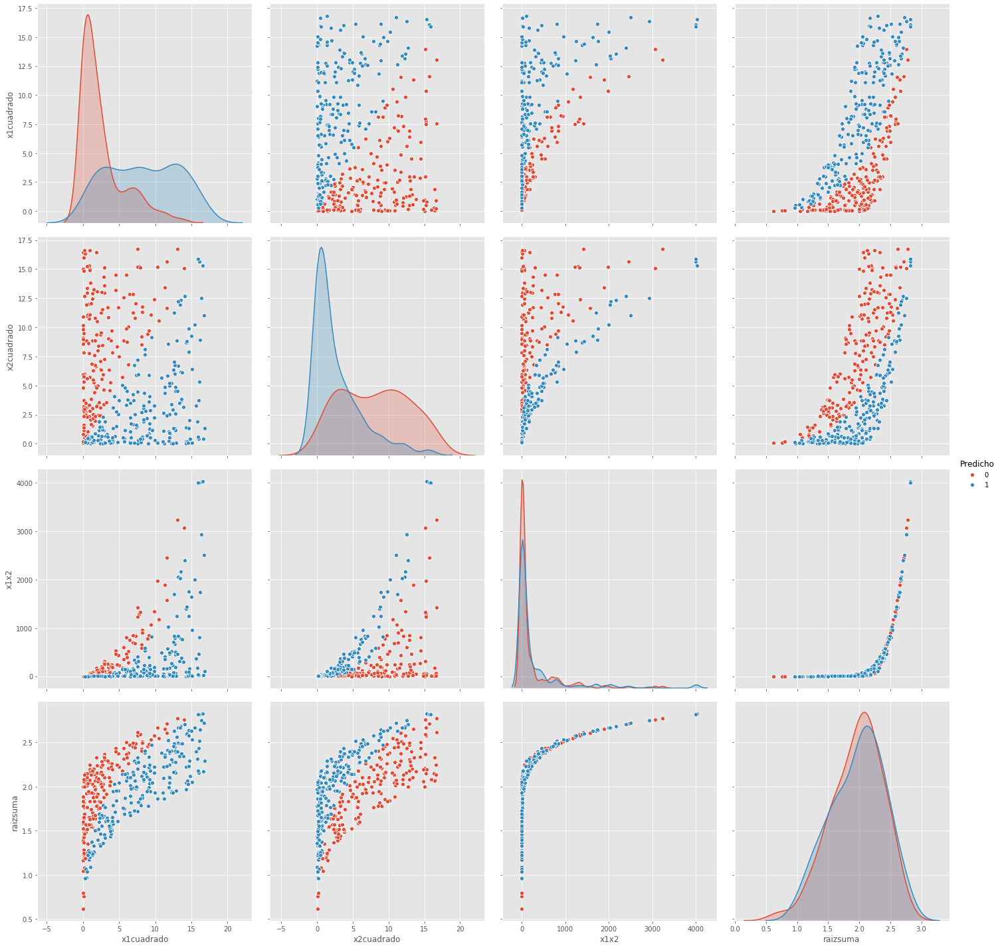

In [272]:
plt.rcParams['figure.figsize'] = (10,5)
sb.pairplot(aux,size=5,vars=aux.drop(["Predicho","Real"],axis=1).columns,kind='scatter', hue="Predicho") ##Grafica con base en 3 variables.
plt.show()

In [273]:
cm = ConfusionMatrix(y_train.to_numpy(), entrenamiento,digit=5) ##Matriz confusión bonita
print("El % de error en train es: ", (1-cm.Overall_ACC)*100)

El % de error en train es:  0.0


### <font color=blue> G. Fit a support vector classifier to the data with X1 and X2 as predictors. Obtain a class prediction for each training observation. Plot the observations, colored according to the predicted class labels.
    
### <font color=red>-- </font> Se refiere a hacer el ajuste del modelo sobre las variables X1 y X2 originales, se vuelven a construir:    
    


In [274]:
##crear dataframe
datos={"X1":x1,"X2":x2,"Clase":y}
dataframe=pd.DataFrame(datos)
dataframe["Clase"]=np.where(dataframe["Clase"]==True, 1, 0) ##Computo la nueva columna

In [275]:
##Separar datos train y test
X=dataframe[dataframe.drop("Clase",axis=1).columns]
Y=dataframe.Clase
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.20, random_state=32302) ## Se particionan los datos.

In [276]:
svm= SVC(C=1.0, kernel='linear') ##SVM de clasificación,kernel lineal
svm.fit(X,Y) ##Se ajusta


SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='auto_deprecated',
    kernel='linear', max_iter=-1, probability=False, random_state=None,
    shrinking=True, tol=0.001, verbose=False)

In [277]:
entrenamiento=svm.predict(X_train) ##Predecir el conjunto de train
aux=X_train.copy()
aux["Predicho"]=entrenamiento
aux["Real"]=y_train  ##añadir predicho y real al dataset

### <font color=red>-- </font> Se observa que la gráfica es  bastante parecida, incluso igual a la obtenida con la regresión logistica:    
    

C:\Users\sgonzalezq\AppData\Local\Continuum\anaconda3\lib\site-packages\seaborn\axisgrid.py:2065: UserWarning: The `size` parameter has been renamed to `height`; pleaes update your code.
  warnings.warn(msg, UserWarning)


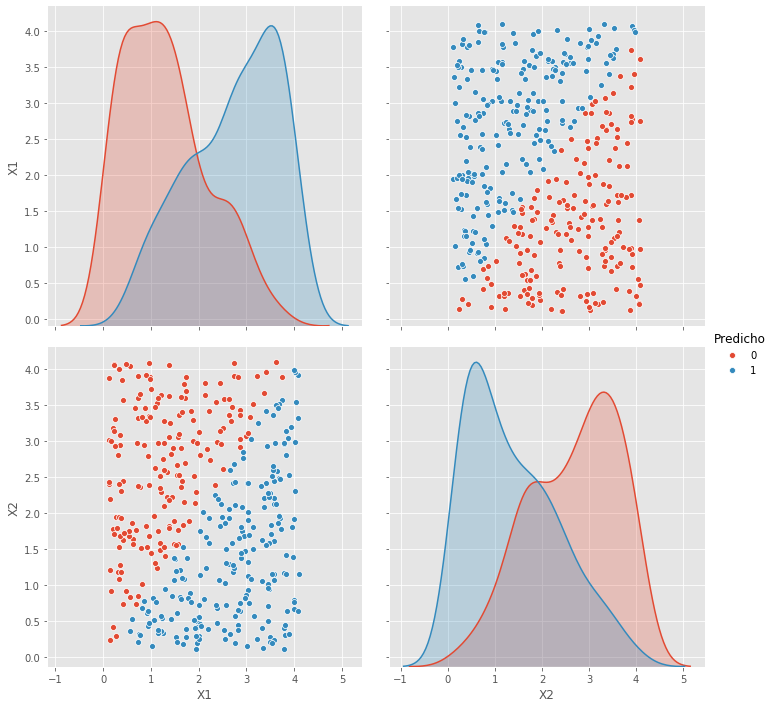

In [278]:
plt.rcParams['figure.figsize'] = (10,5)
sb.pairplot(aux,size=5,vars=aux.drop(["Predicho","Real"],axis=1).columns,kind='scatter', hue="Predicho") ##Grafica con base en 3 variables.
plt.show()

In [279]:
cm = ConfusionMatrix(y_train.to_numpy(), entrenamiento,digit=5) ##Matriz confusión bonita
print("El % de error en train es: ", (1-cm.Overall_ACC)*100)

El % de error en train es:  0.5000000000000004


### <font color=blue> H. Fit a SVM using a non-linear kernel to the data. Obtain a class prediction for each training observation. Plot the observations, colored according to the predicted class labels.
### <font color=red>-- </font> Se usará un kernel polinomico de grado 3, para observar los cambios: 

In [280]:
svm= SVC(C=1.0, kernel='poly',degree=3) ##SVM de clasificación,kernel lineal
svm.fit(X,Y) ##Se ajusta


C:\Users\sgonzalezq\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:193: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)


SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='auto_deprecated',
    kernel='poly', max_iter=-1, probability=False, random_state=None,
    shrinking=True, tol=0.001, verbose=False)

In [281]:
entrenamiento=svm.predict(X_train) ##Predecir el conjunto de train
aux2=X_train.copy()
aux2["Predicho"]=entrenamiento
aux2["Real"]=y_train  ##añadir predicho y real al dataset

### <font color=red>-- </font> Se observa que la gráfica tiene forma muy similar a las anteriores, pero las clases asignadas a los registros varían en unas partes, podría tener más error este kernel, debido a la naturaleza de los datos. 
    

C:\Users\sgonzalezq\AppData\Local\Continuum\anaconda3\lib\site-packages\seaborn\axisgrid.py:2065: UserWarning: The `size` parameter has been renamed to `height`; pleaes update your code.
  warnings.warn(msg, UserWarning)


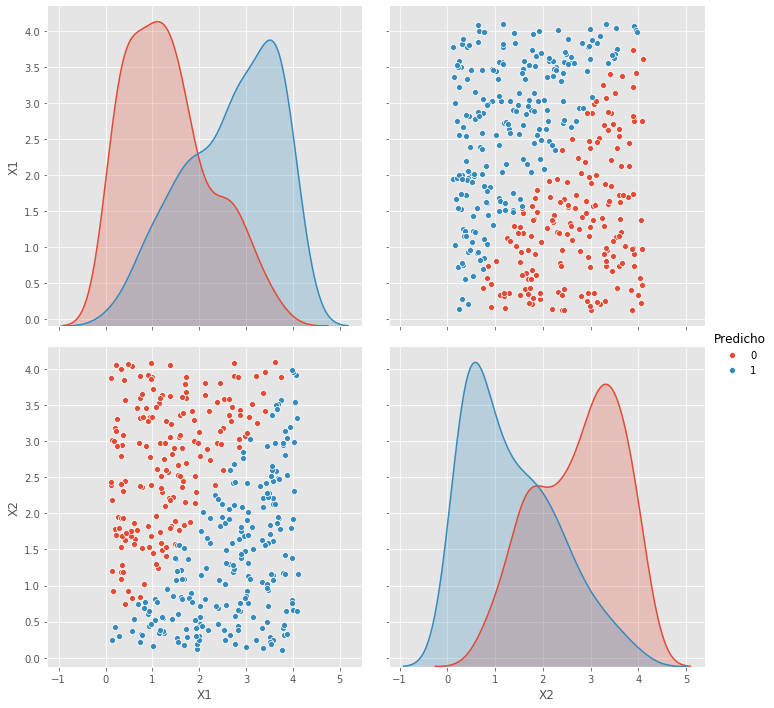

In [282]:
plt.rcParams['figure.figsize'] = (10,5)
sb.pairplot(aux2,size=5,vars=aux2.drop(["Predicho","Real"],axis=1).columns,kind='scatter', hue="Predicho") ##Grafica con base en 3 variables.
plt.show()

In [283]:
cm = ConfusionMatrix(y_train.to_numpy(), entrenamiento,digit=5) ##Matriz confusión bonita
print("El % de error en train es: ", (1-cm.Overall_ACC)*100)

El % de error en train es:  1.2499999999999956


### <font color=blue>I. Comment on your results

### <font color=red>-- </font> Después de identificar y probar todos los diferentes métodos anteriores, se muestra el % de error que tuvo cada uno en el conjunto de entrenamiento, que fue el que se analizó:



<table>
  
<td> Método</td>
 
   <td><font color=red>% Error train</font></td>

  </tr>

  <tr>
<td>Regresión logistica: </td>
<td>0.5</td>
 </tr>
  
  <tr>
<td>Regresión logistica variables modificadas: </td>
<td>0.24</td>

  </tr>
 
  </tr>
  
  <tr>
<td>Kernel lineal: </td>
<td>0.5</td>
</tr>
    <tr>
<td>Kernel grado 3: </td>
<td>1.24</td>

  </tr>

</table>

### <font color=red>-- </font> Se muestra que para este caso, el peor rendimiento lo de el kernel polinomico, pues por la naturaleza de los datos, es normal que no se ajuste tan bien como una simple regresión logistica.
    

### <font color=blue> 6. At the end of Section 9.6.1, it is claimed that in the case of data that is just barely linearly separable, a support vector classifier with a small value of cost that misclassifies a couple of training observations may perform better on test data than one with a huge value of cost that does not misclassify any training observations. You will now investigate this claim.
    
### <font color=blue>A. Generate two-class data with p = 2 in such a way that the classes are just barely linearly separable
    
### <font color=red>-- </font> Del ejercicio anterior ya se tiene un conjunto de datos que es linealmente separable, se aprovecha y se usa ese mismo:
    

In [284]:
x1=np.random.uniform(1,5,500) -0.9 ##generar muestras de una uniforme para x1 y x2
x2=np.random.uniform(1,5,500) -0.9
y =(x1**2 - x2**2 >0) ##crear y
##crear dataframe
datos={"X1":x1,"X2":x2,"Clase":y}
dataframe=pd.DataFrame(datos)
dataframe["Clase"]=np.where(dataframe["Clase"]==True, 1, 0) ##Computo la nueva columna

In [285]:
dataframe.head()

,X1,X2,Clase
0,2.531909,2.308145,1
1,0.369300,4.072836,0
2,2.304493,0.959109,1
3,3.385793,3.888644,0
4,2.472980,2.202166,1


C:\Users\sgonzalezq\AppData\Local\Continuum\anaconda3\lib\site-packages\seaborn\axisgrid.py:2065: UserWarning: The `size` parameter has been renamed to `height`; pleaes update your code.
  warnings.warn(msg, UserWarning)


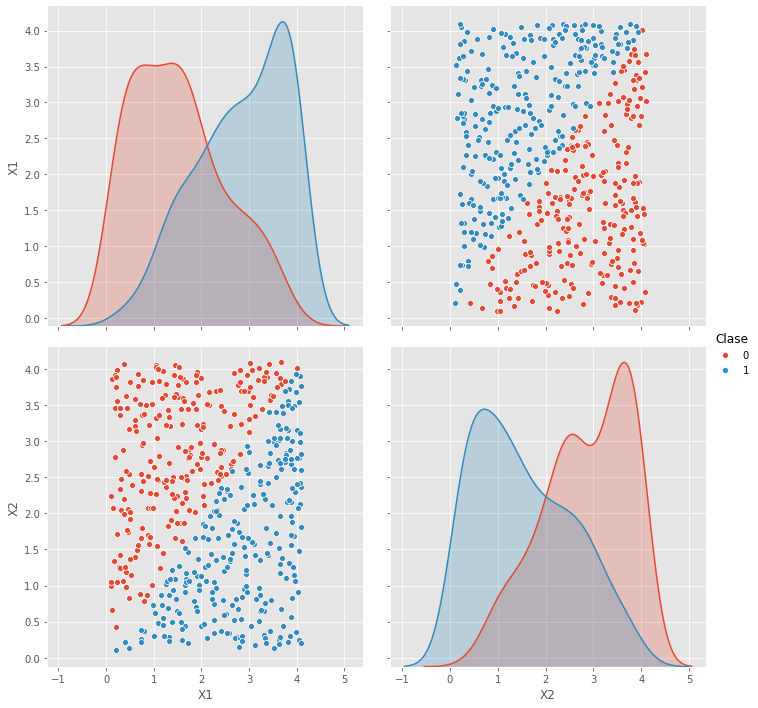

In [286]:
plt.rcParams['figure.figsize'] = (10,5)
sb.pairplot(dataframe,size=5,vars=dataframe.drop("Clase",axis=1).columns,kind='scatter', hue="Clase") ##Grafica con base en 3 variables.
plt.show()

### <font color=blue> 7. In this problem, you will use support vector approaches in order to predict whether a given car gets high or low gas mileage based on the Auto data set.
    
### <font color=blue> A. Create a binary variable that takes on a 1 for cars with gas mileage above the median, and a 0 for cars with gas mileage below the median.
    
        
### <font color=red>-- </font> De ejercicios anteriores ya se tiene el dataset con la modificación necesaria, por lo que no es necesario exportarlo y transformar la variables necesaria:

In [287]:
autos.head()

,mpg,cylinders,displacement,horsepower,weight,acceleration,year,origin,name,mpg01
0,18.0,8,307.0,130,3504,12.0,70,1,chevrolet chevelle malibu,0
1,15.0,8,350.0,165,3693,11.5,70,1,buick skylark 320,0
2,18.0,8,318.0,150,3436,11.0,70,1,plymouth satellite,0
3,16.0,8,304.0,150,3433,12.0,70,1,amc rebel sst,0
4,17.0,8,302.0,140,3449,10.5,70,1,ford torino,0


### <font color=blue> B. Fit a support vector classifier to the data with various values of cost, in order to predict whether a car gets high or low gas mileage. Report the cross-validation errors associated with different values of this parameter. Comment on your results.
        
### <font color=red>-- </font> Se separan los datos en variables explicativas y de respuesta. Se establece que el conjunto de test será del 20%.


In [288]:
X=autos[autos.drop(["mpg01","name"],axis=1).columns]
Y=autos.mpg01
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.20, random_state=32302) ## Se particionan los datos.

### <font color=red>-- </font> Se probarán diferentes valores para el parametro C del costo, a cada uno se le aplicará validación cruzada con 5 splits y se promediarán los errores para ser presentados. Los valores de C se esblecerán desde 2^-10,.... 2^10


In [289]:
valoresc=[]
errores=[]
for costo in range(-10,10):
    svm= SVC(C=2**costo, kernel='linear') ##SVM de clasificación,kernel lineal
    resultados=cross_val_score(svm, X, Y, cv = 5,scoring='accuracy')##5 splits
    errores.append(statistics.mean((1-resultados)*100))
    valoresc.append("2^"+str(costo))
    print("Valor del costo: ","2^",costo, ", % Error: ",statistics.mean((1-resultados)*100))
    

    

Valor del costo:  2^ -10 , % Error:  7.160256410256409
Valor del costo:  2^ -9 , % Error:  5.8782051282051295
Valor del costo:  2^ -8 , % Error:  4.333333333333334
Valor del costo:  2^ -7 , % Error:  3.0641025641025643
Valor del costo:  2^ -6 , % Error:  3.0576923076923057
Valor del costo:  2^ -5 , % Error:  2.2884615384615348
Valor del costo:  2^ -4 , % Error:  2.288461538461537
Valor del costo:  2^ -3 , % Error:  2.0320512820512793
Valor del costo:  2^ -2 , % Error:  0.512820512820511
Valor del costo:  2^ -1 , % Error:  0.512820512820511
Valor del costo:  2^ 0 , % Error:  0.5128205128205132
Valor del costo:  2^ 1 , % Error:  0.7692307692307665
Valor del costo:  2^ 2 , % Error:  0.512820512820511
Valor del costo:  2^ 3 , % Error:  0.512820512820511
Valor del costo:  2^ 4 , % Error:  0.512820512820511
Valor del costo:  2^ 5 , % Error:  0.512820512820511
Valor del costo:  2^ 6 , % Error:  0.512820512820511
Valor del costo:  2^ 7 , % Error:  0.512820512820511
Valor del costo:  2^ 8 , % E

### <font color=red>-- </font> Según los resultados de validación cruzada, se nota que entre más grande sea el valor del costo, menos porcentaje de error se obtiene, pero se llega a un pico donde no baja mucho el error. Se podría decir que con un valor costo de 2^-2 se obtiene el mejor % de error.

### <font color=red>-- </font> Se entrena el modelo con los parametros hallados y se verifica el % de error en el conjunto de test:

In [290]:
svm= SVC(C=2**(-2), kernel='linear') ##SVM de clasificación,kernel lineal
svm.fit(X_train,y_train)
svm_predicho=svm.predict(X_test)
cm = ConfusionMatrix(y_test.to_numpy(), svm_predicho,digit=5) ##Matriz confusión bonita
print("El % de error en test es: ", (1-cm.Overall_ACC)*100)

El % de error en test es:  0.0


### <font color=blue>D. Make some plots to back up your assertions:

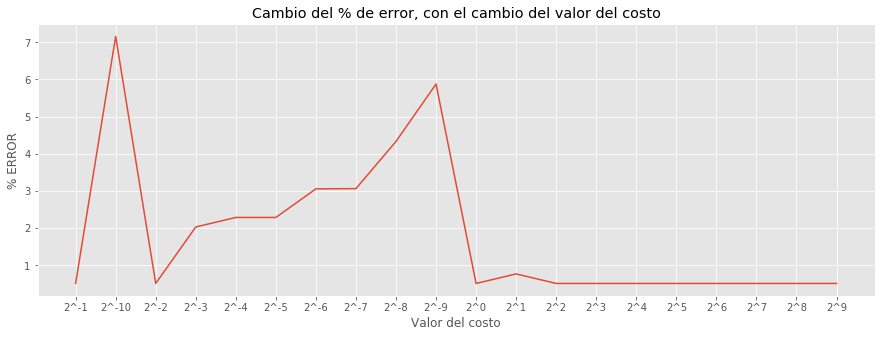

In [291]:
plt.rcParams['figure.figsize'] = (15,5)
data = {'Valor Costo':valoresc, '% error':errores}
errorfinal =pd.DataFrame(data)
ax = sb.lineplot(x="Valor Costo", y="% error",markers=True,dashes=True, data=errorfinal).set(title = 'Cambio del % de error, con el cambio del valor del costo', 
xlabel ='Valor del costo' , ylabel ='% ERROR'  )
plt.show()

### <font color=blue>C.  Now repeat B, this time using SVMs with radial and polynomial basis kernels, with different values of gamma and degree and cost. Comment on your results.
    
### <font color=green> SVM con kernel radial:
### <font color=red>-- </font> En este caso se buscará el valor óptimo para el costo y para gamma. Para el costo se prueba con valores entre 1^-10.... 1^10. Para Gamma se prueban valores entre 0.001 ... 0.01

In [292]:
valoresc=[]
errores=[]
valoresgama=[]
for costo in range(-10,10):
    for gama in range(1,11):
        svm= SVC(C=1**costo, kernel='rbf',gamma=gama/1000) ##SVM de clasificación,kernel lineal
        resultados=cross_val_score(svm, X, Y, cv = 5,scoring='accuracy')##5 splits
        errores.append(statistics.mean((1-resultados)*100))
        valoresc.append("1^"+str(costo))
        valoresgama.append(gama/1000)
        print("Valor del costo: ","1^",costo, ", Valor de gamma: ",gama/1000,", % Error: ",statistics.mean((1-resultados)*100))
    

Valor del costo:  1^ -10 , Valor de gamma:  0.001 , % Error:  9.455128205128208
Valor del costo:  1^ -10 , Valor de gamma:  0.002 , % Error:  13.76923076923077
Valor del costo:  1^ -10 , Valor de gamma:  0.003 , % Error:  16.314102564102566
Valor del costo:  1^ -10 , Valor de gamma:  0.004 , % Error:  19.871794871794872
Valor del costo:  1^ -10 , Valor de gamma:  0.005 , % Error:  21.147435897435898
Valor del costo:  1^ -10 , Valor de gamma:  0.006 , % Error:  22.416666666666668
Valor del costo:  1^ -10 , Valor de gamma:  0.007 , % Error:  24.955128205128204
Valor del costo:  1^ -10 , Valor de gamma:  0.008 , % Error:  25.974358974358974
Valor del costo:  1^ -10 , Valor de gamma:  0.009 , % Error:  26.73717948717949
Valor del costo:  1^ -10 , Valor de gamma:  0.01 , % Error:  28.012820512820515
Valor del costo:  1^ -9 , Valor de gamma:  0.001 , % Error:  9.455128205128208
Valor del costo:  1^ -9 , Valor de gamma:  0.002 , % Error:  13.76923076923077
Valor del costo:  1^ -9 , Valor de g

### <font color=red>-- </font> El mejor % de error encontrado está en los valores de costo= 1^-10 y gamma=0.001
### <font color=red>-- </font> Se entrena el modelo con los parametros hallados y se verifica el % de error en el conjunto de test:

In [293]:
svm= SVC(C=1**(-10), kernel='rbf',gamma=0.001) ##SVM de clasificación,kernel lineal
svm.fit(X_train,y_train)
svm_predicho=svm.predict(X_test)
cm = ConfusionMatrix(y_test.to_numpy(), svm_predicho,digit=5) ##Matriz confusión bonita
print("El % de error en test con kernel radial es: ", (1-cm.Overall_ACC)*100)

El % de error en test con kernel radial es:  11.392405063291145


    
### <font color=green> SVM con kernel polinomico:
### <font color=red>-- </font> En este caso se buscará el valor óptimo para el costo, grado y para gamma. Para el costo se prueba con valores entre 1^-10.... 1^10. Para Gamma se prueban valores entre 0.001 ... 0.01. Para el grado se prueba con valores entre 2 y 4

In [ ]:
valoresc=[]
errores=[]
valoresgama=[]
graditos=[]
for grados in range(2,5):
    for costo in range(-10,10):
        for gama in range(1,11):
            svm= SVC(C=1**costo, kernel='poly', degree=grados,gamma=gama/1000) ##SVM de clasificación,kernel lineal
            resultados=cross_val_score(svm, X, Y, cv = 5,scoring='accuracy')##5 splits
            errores.append(statistics.mean((1-resultados)*100))
            valoresc.append("1^"+str(costo))
            valoresgama.append(gama/1000)
            graditos.append(grados)
            print("Valor del costo: ","1^",costo, ", Valor de gamma: ",gama/1000,",Grado del kernel: ",grados,", % Error: ",statistics.mean((1-resultados)*100))


### <font color=red>-- </font> Por costo computacional se detiene la ejecución cuando se observa un buen valor en grado 2, costo 1^-10 y gamma=0.005
### <font color=red>-- </font> Se entrena el modelo con los parametros hallados y se verifica el % de error en el conjunto de test:

In [294]:
svm= SVC(C=1**(-10), kernel='poly',degree=2,gamma=0.005) ##SVM de clasificación,kernel lineal
svm.fit(X_train,y_train)
svm_predicho=svm.predict(X_test)
cm = ConfusionMatrix(y_test.to_numpy(), svm_predicho,digit=5) ##Matriz confusión bonita
print("El % de error en test con kernel radial es: ", (1-cm.Overall_ACC)*100)

El % de error en test con kernel radial es:  1.2658227848101222


### <font color=blue>8. This problem involves the OJ data set which is part of the ISLR package.
    
### <font color=blue>A. Create a training set containing a random sample of 800 observations, and a test set containing the remaining observations
    
### <font color=red>-- </font> El dataset fue usado anteriormente en otro ejercicio con las mismas indicaciones, por lo que se replica el enfoque:

In [295]:
Y=orange.Purchase #Obtengo respuesta
X=orange[orange.drop("Purchase",axis=1).columns] ##Saco variable de respuesta
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.252, random_state=1002) ## Se particionan los datos.

### <font color=blue>B. Fit a support vector classifier to the training data using cost=0.01, with Purchase as the response and the other variables as predictors. Use the summary() function to produce summary statistics, and describe the results obtained
### <font color=blue>C. What are the training and test error rates?

In [296]:
svm= SVC(C=0.01, kernel='linear') ##SVM de clasificación,kernel lineal
svm.fit(X_train,y_train)
svm_predicho=svm.predict(X_test)
cm = ConfusionMatrix(y_test.to_numpy(), svm_predicho,digit=5) ##Matriz confusión bonita
print("El % de error en test es: ", (1-cm.Overall_ACC)*100)
print("---------------------------------------------------")
svm_predicho=svm.predict(X_train)
cm = ConfusionMatrix(y_train.to_numpy(), svm_predicho,digit=5) ##Matriz confusión bonita
print("El % de error en train es: ", (1-cm.Overall_ACC)*100)
print("--------------------------------------------------")
print("Peso de los features: ",svm.coef_)
print("--------------------------------------------------")
print("Vectores de soporte por clase: ",svm.n_support_ )

El % de error en test es:  30.740740740740748
---------------------------------------------------
El % de error en train es:  27.0
--------------------------------------------------
Peso de los features:  [[-0.00747305 -0.12273552  0.02363977 -0.07666979 -0.01299315  0.16825612
  -0.02714564  0.32144333 -0.97206535 -0.24492592  0.03663292 -0.28155883
  -0.0133599   0.07847482 -0.00698894 -0.10030956 -0.02921622]]
--------------------------------------------------
Vectores de soporte por clase:  [307 306]


### <font color=red>-- </font> Con el kernel lineal, se obtuvo un % de error en el conjunto de test de: 30.7%. En el conjunto de train el error fue de: 27%.  Vale aclarar que no se realizó validación cruzada.
### <font color=red>-- </font>El feature que más peso tuvo fue: SpecialMM
### <font color=red>-- </font>Se encontraron 307 y 306 vectores de soporte para cada clase.

### <font color=blue>D. Use the tune() function to select an optimal cost. Consider values in the range 0.01 to 10.
### <font color=red>-- </font>Se probaran todos los valores para el costo entre 0.01 y 10, dando pasos de 10. Se guardará el %de error en test para determinar el valor más óptimo.

In [297]:
costos=[]
error=[]
for i in range(1,1010,10):
    costo=i/100
    svm= SVC(C=costo, kernel='linear') ##SVM de clasificación,kernel lineal
    svm.fit(X_train,y_train)
    svm_predicho=svm.predict(X_test)
    cm = ConfusionMatrix(y_test.to_numpy(), svm_predicho,digit=5) ##Matriz confusión bonita
    test=(1-cm.Overall_ACC)*100
    costos.append(costo)
    error.append(test)

In [298]:
indice=error.index(min(error))
print("Costo óptimo: ",costos[indice])

Costo óptimo:  4.91


### <font color=red>-- </font>Se encontró que el valor óptimo para el costo es de C=4.91.
### <font color=blue> E. Compute the training and test error rates using this new value for cost: 
### <font color=red>-- </font>Se reentrena el modelo con C=4.91 y se evalua el % de error en train y test:

In [299]:
svm= SVC(C=4.91, kernel='linear') ##SVM de clasificación,kernel lineal
svm.fit(X_train,y_train)
svm_predicho=svm.predict(X_test)
cm = ConfusionMatrix(y_test.to_numpy(), svm_predicho,digit=5) ##Matriz confusión bonita
print("El % de error en test es: ", (1-cm.Overall_ACC)*100)
print("---------------------------------------------------")
svm_predicho=svm.predict(X_train)
cm = ConfusionMatrix(y_train.to_numpy(), svm_predicho,digit=5) ##Matriz confusión bonita
print("El % de error en train es: ", (1-cm.Overall_ACC)*100)
print("--------------------------------------------------")

El % de error en test es:  17.407407407407405
---------------------------------------------------
El % de error en train es:  16.000000000000004
--------------------------------------------------


### <font color=red>-- </font>Se obtienen los siguientes errores:
### <font color=red>*   </font>17.7% en el conjunto de test
### <font color=red>*   </font>16% en el conjunto de train

### <font color=blue>F. Repeat parts B through E using a support vector machine with a radial kernel. Use the default value for gamma.
    
### <font color=red>-- </font>Usando un kernel radial para repetir los pasos anteriores, primero se establece el costo en 0.01 y gamma se deja en su valor por defecto: 

In [300]:
svm= SVC(C=0.01, kernel='rbf') ##SVM de clasificación,kernel radial
svm.fit(X_train,y_train)
svm_predicho=svm.predict(X_test)
cm = ConfusionMatrix(y_test.to_numpy(), svm_predicho,digit=5) ##Matriz confusión bonita
print("El % de error en test es: ", (1-cm.Overall_ACC)*100)
print("---------------------------------------------------")
svm_predicho=svm.predict(X_train)
cm = ConfusionMatrix(y_train.to_numpy(), svm_predicho,digit=5) ##Matriz confusión bonita
print("El % de error en train es: ", (1-cm.Overall_ACC)*100)
print("--------------------------------------------------")

print("Vectores de soporte por clase: ",svm.n_support_ )

El % de error en test es:  40.74074074074075
---------------------------------------------------
El % de error en train es:  38.375
--------------------------------------------------
Vectores de soporte por clase:  [324 307]


C:\Users\sgonzalezq\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:193: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)


### <font color=red>-- </font> Con el kernel radial, se obtuvo un % de error en el conjunto de test de: 40.7%. En el conjunto de train el error fue de: 38.3%.  Vale aclarar que no se realizó validación cruzada.

### <font color=red>-- </font>Se encontraron 324 y 307 vectores de soporte para cada clase.

### <font color=blue> Use the tune() function to select an optimal cost. Consider values in the range 0.01 to 10.
### <font color=red>-- </font>Se probaran todos los valores para el costo entre 0.01 y 10, dando pasos de 10. Se guardará el %de error en test para determinar el valor más óptimo.

In [301]:
costos=[]
error=[]
for i in range(1,1010,10):
    costo=i/100
    svm= SVC(C=costo, kernel='rbf')  ##SVM de clasificación,kernel radial
    svm.fit(X_train,y_train)
    svm_predicho=svm.predict(X_test)
    cm = ConfusionMatrix(y_test.to_numpy(), svm_predicho,digit=5) ##Matriz confusión bonita
    test=(1-cm.Overall_ACC)*100
    costos.append(costo)
    error.append(test)

C:\Users\sgonzalezq\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:193: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)
C:\Users\sgonzalezq\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:193: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)
C:\Users\sgonzalezq\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:193: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureW

In [302]:
indice=error.index(min(error))
print("Costo óptimo: ",costos[indice])

Costo óptimo:  9.41


### <font color=red>-- </font>Se encontró que el valor óptimo para el costo es de C=9.41.
### <font color=blue> E. Compute the training and test error rates using this new value for cost: 
### <font color=red>-- </font>Se reentrena el modelo con C=9.41 y se evalua el % de error en train y test:

In [303]:
svm= SVC(C=9.41, kernel='rbf') ##SVM de clasificación,kernel radial
svm.fit(X_train,y_train)
svm_predicho=svm.predict(X_test)
cm = ConfusionMatrix(y_test.to_numpy(), svm_predicho,digit=5) ##Matriz confusión bonita
print("El % de error en test es: ", (1-cm.Overall_ACC)*100)
print("---------------------------------------------------")
svm_predicho=svm.predict(X_train)
cm = ConfusionMatrix(y_train.to_numpy(), svm_predicho,digit=5) ##Matriz confusión bonita
print("El % de error en train es: ", (1-cm.Overall_ACC)*100)
print("--------------------------------------------------")
print("Vectores de soporte por clase: ",svm.n_support_ )

El % de error en test es:  18.518518518518523
---------------------------------------------------
El % de error en train es:  14.375000000000004
--------------------------------------------------
Vectores de soporte por clase:  [210 199]


C:\Users\sgonzalezq\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:193: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)


### <font color=red>-- </font>Se obtienen los siguientes errores:
### <font color=red>*   </font>18.5% en el conjunto de test
### <font color=red>*   </font>14.3% en el conjunto de train

### <font color=blue> G. Repeat parts (b) through (e) using a support vector machine with a polynomial kernel. Set degree=2.

### <font color=red>-- </font>Usando un kernel polinomial de grado 2 para repetir los pasos anteriores, primero se establece el costo en 0.01 y gamma se deja en su valor por defecto: 

In [304]:
svm= SVC(C=0.01, kernel='poly',degree=2) ##SVM de clasificación,kernel poli grado 2
svm.fit(X_train,y_train)
svm_predicho=svm.predict(X_test)
cm = ConfusionMatrix(y_test.to_numpy(), svm_predicho,digit=5) ##Matriz confusión bonita
print("El % de error en test es: ", (1-cm.Overall_ACC)*100)
print("---------------------------------------------------")
svm_predicho=svm.predict(X_train)
cm = ConfusionMatrix(y_train.to_numpy(), svm_predicho,digit=5) ##Matriz confusión bonita
print("El % de error en train es: ", (1-cm.Overall_ACC)*100)
print("--------------------------------------------------")

print("Vectores de soporte por clase: ",svm.n_support_ )

C:\Users\sgonzalezq\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:193: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)


El % de error en test es:  17.777777777777782
---------------------------------------------------
El % de error en train es:  16.000000000000004
--------------------------------------------------
Vectores de soporte por clase:  [168 166]


### <font color=red>-- </font> Con el kernel polinomico de grado 2, se obtuvo un % de error en el conjunto de test de: 17.7%. En el conjunto de train el error fue de: 16%.  Vale aclarar que no se realizó validación cruzada.

### <font color=red>-- </font>Se encontraron 168 y 166 vectores de soporte para cada clase.

### <font color=blue> Use the tune() function to select an optimal cost. Consider values in the range 0.01 to 10.
### <font color=red>-- </font>Se probaran todos los valores para el costo entre 0.01 y 10, dando pasos de 10. Se guardará el %de error en test para determinar el valor más óptimo.

In [305]:
costos=[]
error=[]
for i in range(1,4):
    costo=i/100
    svm= SVC(C=costo, kernel='poly',degree=2)  ##SVM de clasificación,kernel poly grado 2
    svm.fit(X_train,y_train)
    svm_predicho=svm.predict(X_test)
    cm = ConfusionMatrix(y_test.to_numpy(), svm_predicho,digit=5) ##Matriz confusión bonita
    test=(1-cm.Overall_ACC)*100
    costos.append(costo)
    error.append(test)

C:\Users\sgonzalezq\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:193: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)
C:\Users\sgonzalezq\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:193: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)
C:\Users\sgonzalezq\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:193: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureW

In [306]:
indice=error.index(min(error))
print("Costo óptimo: ",costos[indice])

Costo óptimo:  0.03


### <font color=red>-- </font>Por costo computacional se probaron menos valores.
### <font color=red>-- </font>Se encontró que el valor óptimo para el costo es de C=0.03.
### <font color=blue> E. Compute the training and test error rates using this new value for cost: 
### <font color=red>-- </font>Se reentrena el modelo con C=0.03 y se evalua el % de error en train y test:

In [307]:
svm= SVC(C=0.03, kernel='poly',degree=2)
svm.fit(X_train,y_train)
svm_predicho=svm.predict(X_test)
cm = ConfusionMatrix(y_test.to_numpy(), svm_predicho,digit=5) ##Matriz confusión bonita
print("El % de error en test es: ", (1-cm.Overall_ACC)*100)
print("---------------------------------------------------")
svm_predicho=svm.predict(X_train)
cm = ConfusionMatrix(y_train.to_numpy(), svm_predicho,digit=5) ##Matriz confusión bonita
print("El % de error en train es: ", (1-cm.Overall_ACC)*100)
print("--------------------------------------------------")
print("Vectores de soporte por clase: ",svm.n_support_ )

C:\Users\sgonzalezq\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\svm\base.py:193: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)


El % de error en test es:  16.296296296296298
---------------------------------------------------
El % de error en train es:  16.125
--------------------------------------------------
Vectores de soporte por clase:  [163 164]


### <font color=red>-- </font>Se obtienen los siguientes errores:
### <font color=red>*   </font>16.2% en el conjunto de test
### <font color=red>*   </font>16.1% en el conjunto de train
### <font color=red>*   </font>Se debe tener presente que los rates con este enfoque podrían ser mucho mejores, pero se tuvo que límitar el número de pruebas para el valor del costo, debido al alto valor computacional.

 ### <font color=blue> H. Overall, which approach seems to give the best results on this data?
    
<table>
  
<td> Método</td>
   <td><font color=red>% Valor costo</font></td>  
   <td><font color=red>% Error train</font></td>
   <td><font color=red>% Error test</font></td>
   

  </tr>

  <tr>
<td>Lineal</td>
<td>4.91</td>
    <td>16</td>
    <td>17.7</td>
 
 </tr>
  

  <tr>
<td>Radial</td>
<td>9.41</td>
    <td>14.3</td>
    <td>18.5</td>
 
 </tr>
 
 
  <tr>
<td>Poly grado 2</td>
<td>0.03*</td>
    <td>16.1</td>
    <td>16.2</td>
 
 </tr>
  
  



</table>
    
### <font color=red>*   </font>Parece ser que con poly grado 2 se obtiene el mejor balance de los resultados entre test y train, por lo que se concluye que es el que mejor se ajusta al conjunto de datos.

### <font color=red>*  </font> Recordar que el valor del costo para poly grado 2, pudo haberse explorado más a fondo, pero no se hizo por costo computacional.